In [1240]:
import pandas as pd
df=pd.read_excel("nope.xlsx")

In [1242]:
print(len(df['batsman'].unique()))

758


In [1244]:
print(len(df))

47059


In [1246]:
df = df.drop_duplicates()
df.reset_index(drop=True, inplace=True)


In [1248]:
df[df['Event']=='Wicket! \n 1 run \n 1 no ball']

,Over,Ball,Event,Commentary,innings,teamname,teamscore,teamtossinfo,full_match_result,R,B,4s,6s,SR,batting team,bowling team,bowler,batsman
43924,Over 11,10.1,Wicket! \n 1 run \n 1 no ball,"W Reay to C Osullivan: 1 run, 1 nb C Osullivan...",1,Burnopfield CC,U n d e r 1 3 1 3 4 / 2 ( 2 0 . 0 ),Won the toss and elected to bat,BURNOPFIELD CC WON BY 76 RUNS RUNS,2.0,6.0,0.0,0.0,33.33,Burnopfield CC,Greenside CC,W Reay,C Osullivan


In [1250]:
df['batting team'] = df['teamname']

# Initialize the bowling team column with None
df['bowling team'] = None
i=0
# Iterate over the DataFrame to set the bowling team
for i in range(len(df)):
    if df.at[i, 'innings'] == 1:
        # For innings 1, find the next row with innings 2
        for j in range(i + 1, len(df)):
            if df.at[j, 'innings'] == 2:
                df.at[i, 'bowling team'] = df.at[j, 'teamname']
                break
    elif df.at[i, 'innings'] == 2:
        # For innings 2, find the previous row with innings 1
        for j in range(i - 1, -1, -1):
            if df.at[j, 'innings'] == 1:
                df.at[i, 'bowling team'] = df.at[j, 'teamname']
                break

In [1251]:
print(len(df['bowler'].unique()))

767


In [1252]:
df = df.iloc[::-1].reset_index(drop=True)


In [1253]:
df

,Over,Ball,Event,Commentary,innings,teamname,teamscore,teamtossinfo,full_match_result,R,B,4s,6s,SR,batting team,bowling team,bowler,batsman
0,Over 1,0.1,0 runs,K Massam to W Symonds: No run,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Consett CC,Ryton CC,K Massam,W Symonds
1,Over 1,0.2,0 runs,K Massam to W Symonds: No run,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Consett CC,Ryton CC,K Massam,W Symonds
2,Over 1,0.3,0 runs,K Massam to W Symonds: No run,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Consett CC,Ryton CC,K Massam,W Symonds
3,Over 1,0.4,0 runs,K Massam to W Symonds: No run,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Consett CC,Ryton CC,K Massam,W Symonds
4,Over 1,0.5,0 runs,K Massam to W Symonds: No run,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Consett CC,Ryton CC,K Massam,W Symonds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46836,Over 20,19.2,0 runs,A Routledge to J Bett: No run,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Ushaw Moor CC,Bishop Auckland CC,A Routledge,J Bett
46837,Over 20,19.3,0 runs,A Routledge to J Bett: No run,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Ushaw Moor CC,Bishop Auckland CC,A Routledge,J Bett
46838,Over 20,19.4,0 runs,A Routledge to J Bett: No run,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Ushaw Moor CC,Bishop Auckland CC,A Routledge,J Bett
46839,Over 20,19.5,0 runs,A Routledge to J Bett: No run,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Ushaw Moor CC,Bishop Auckland CC,A Routledge,J Bett


In [1254]:
import pandas as pd
from decimal import Decimal

# Function to process events and calculate metrics for batsmen and bowlers
def calculate_metrics(df):
    # Initialize dictionaries to hold metrics
    batsman_metrics = {}
    bowler_metrics = {}

    # Define scoring rules
    runs_scored = {
        '0 runs': 0, '1 run': 1, '2 runs': 2, '3 runs': 3, '4 runs': 4, '6 runs': 6,
        '1 run \n 1 no ball': 1, '2 runs \n 1 no ball': 2, '3 runs \n 1 no ball': 3, 
        '4 runs \n 1 no ball': 4, '6 runs \n 1 no ball': 6, '5 runs': 5,
        '1 run \n 2 no balls': 1, '4 runs \n 2 no balls': 4,
    }
    
    dismissals = [
        'Wicket!', 'Wicket! \n 2 wides', 'Wicket! \n 1 run \n 1 no ball', 
        'Wicket! \n 1 run', 'Wicket! \n 2 runs', 'Wicket! \n 1 bye', 
        'Wicket! \n 1 no ball', 'Wicket! \n 1 wide', 'Wicket! \n 1 leg bye'
    ]

    extras = {
        '1 wide': 1, '2 wides': 2, '3 wides': 3, '4 wides': 4, '5 wides': 5, '6 wides': 6,
        '1 no ball': 1, '2 no balls': 2, '1 bye': 1, '2 byes': 2, '3 byes': 3, 
        '4 byes': 4, '5 byes': 5, '1 leg bye': 1, '2 leg byes': 2, '3 leg byes': 3, 
        '4 leg byes': 4, '2 1nb + byes': 2, '3 1nb + byes': 3, '6 1nb + byes': 6, 
        '5 1nb + byes': 5, '4 1nb + byes': 4, '2 1nb + leg byes': 2
    }

    previous_bowling_team = None

    for _, row in df.iterrows():
        event = row['Event']
        bowler = row['bowler']
        batsman = row['batsman']
        bowling_team = row['bowling team']
        over = int(row['Over'][5:])

        # Initialize batsman and bowler if not already in the dictionary
        if batsman not in batsman_metrics:
            batsman_metrics[batsman] = {'runs': 0, 'boundaries': 0, 'dismissal': 0, 'balls_faced': 0, 'innings': 0, 'scores': []}
        if bowler not in bowler_metrics:
            bowler_metrics[bowler] = {'runs_conceded': 0, 'wickets': 0, 'extras': 0, 'balls_bowled': 0, 'innings': 0}

        # Handle change in batting team (new match or new innings)
        if previous_bowling_team is not None and previous_bowling_team != bowling_team:
            # Save the scores for all batsmen
            for b in batsman_metrics:
                if batsman_metrics[b]['runs'] > 0:
                    batsman_metrics[b]['scores'].append(batsman_metrics[b]['runs'])
                    batsman_metrics[b]['runs'] = 0

        # Calculate metrics for batsmen
        if event in runs_scored:
            runs = runs_scored[event]
            batsman_metrics[batsman]['runs'] += runs
            batsman_metrics[batsman]['balls_faced'] += 1
            if runs >= 4:
                batsman_metrics[batsman]['boundaries'] += 1

        if event in dismissals:
            batsman_metrics[batsman]['balls_faced'] += 1
            batsman_metrics[batsman]['dismissal'] += 1
            batsman_metrics[batsman]['scores'].append(batsman_metrics[batsman]['runs'])
            batsman_metrics[batsman]['runs'] = 0  # Reset runs for the next innings

        # Calculate metrics for bowlers
        if event in runs_scored:
            bowler_metrics[bowler]['runs_conceded'] += runs_scored[event]
            bowler_metrics[bowler]['balls_bowled'] += 1

        if event in dismissals:
            bowler_metrics[bowler]['wickets'] += 1

        if event in extras:
            bowler_metrics[bowler]['extras'] += extras[event]
            bowler_metrics[bowler]['runs_conceded'] += extras[event]

        previous_bowling_team = bowling_team

    # Ensure last innings runs are recorded
    for batsman in batsman_metrics:
        if batsman_metrics[batsman]['runs'] > 0:
            batsman_metrics[batsman]['scores'].append(batsman_metrics[batsman]['runs'])

    # Calculate additional metrics for batsmen
    for batsman in batsman_metrics:
        runs = sum(batsman_metrics[batsman]['scores'])
        dismissal = batsman_metrics[batsman]['dismissal']
        balls_faced = batsman_metrics[batsman]['balls_faced']

        average = runs / dismissal if dismissal > 0 else runs
        strike_rate = (runs / balls_faced * 100) if balls_faced > 0 else Decimal('0')
        highest_score = max(batsman_metrics[batsman]['scores']) if batsman_metrics[batsman]['scores'] else runs

        batsman_metrics[batsman]['average'] = average
        batsman_metrics[batsman]['strike_rate'] = strike_rate
        batsman_metrics[batsman]['highest_score'] = highest_score
        batsman_metrics[batsman]['runs'] = runs
        batsman_metrics[batsman]['innings'] = len(batsman_metrics[batsman]['scores'])

    # Calculate additional metrics for bowlers
    for bowler in bowler_metrics:
        runs_conceded = bowler_metrics[bowler]['runs_conceded']
        wickets = bowler_metrics[bowler]['wickets']
        balls_bowled = bowler_metrics[bowler]['balls_bowled']

        bowler_metrics[bowler]['average'] = runs_conceded / wickets if wickets > 0 else runs_conceded
        bowler_metrics[bowler]['strike_rate'] = balls_bowled / wickets if wickets > 0 else balls_bowled
        bowler_metrics[bowler]['economy_rate'] = (runs_conceded / (balls_bowled / 6)) if balls_bowled > 0 else 0

    return batsman_metrics, bowler_metrics



# Calculate metrics
batsman_metrics, bowler_metrics = calculate_metrics(df)

# Print results
print("Batsman Metrics:", batsman_metrics)


Batsman Metrics: {'W Symonds': {'runs': 37, 'boundaries': 5, 'dismissal': 4, 'balls_faced': 102, 'innings': 6, 'scores': [3, 5, 1, 16, 12, 0], 'average': 9.25, 'strike_rate': 36.27450980392157, 'highest_score': 16}, 'J Llewellyn-Dixon': {'runs': 26, 'boundaries': 2, 'dismissal': 7, 'balls_faced': 45, 'innings': 7, 'scores': [1, 4, 7, 5, 5, 4, 0], 'average': 3.7142857142857144, 'strike_rate': 57.77777777777777, 'highest_score': 7}, 'L Graham': {'runs': 96, 'boundaries': 14, 'dismissal': 5, 'balls_faced': 139, 'innings': 6, 'scores': [9, 19, 11, 10, 15, 32], 'average': 19.2, 'strike_rate': 69.06474820143885, 'highest_score': 32}, 'O Gray': {'runs': 17, 'boundaries': 1, 'dismissal': 4, 'balls_faced': 44, 'innings': 4, 'scores': [1, 2, 14, 0], 'average': 4.25, 'strike_rate': 38.63636363636363, 'highest_score': 14}, 'A Davison': {'runs': 42, 'boundaries': 4, 'dismissal': 6, 'balls_faced': 111, 'innings': 7, 'scores': [9, 2, 3, 10, 9, 9, 0], 'average': 7.0, 'strike_rate': 37.83783783783784, 

In [1255]:
print(len(batsman_metrics))

758


In [1256]:
batsman_metrics['J Bett']

{'runs': 10,
 'boundaries': 0,
 'dismissal': 0,
 'balls_faced': 42,
 'innings': 3,
 'scores': [1, 5, 4],
 'average': 10,
 'strike_rate': 23.809523809523807,
 'highest_score': 5}

In [1257]:
print("Bowler Metrics:", bowler_metrics)


Bowler Metrics: {'K Massam': {'runs_conceded': 49, 'wickets': 5, 'extras': 2, 'balls_bowled': 73, 'innings': 0, 'average': 9.8, 'strike_rate': 14.6, 'economy_rate': 4.027397260273973}, 'L Thompson': {'runs_conceded': 48, 'wickets': 7, 'extras': 11, 'balls_bowled': 81, 'innings': 0, 'average': 6.857142857142857, 'strike_rate': 11.571428571428571, 'economy_rate': 3.5555555555555554}, nan: {'runs_conceded': 2750, 'wickets': 197, 'extras': 557, 'balls_bowled': 3433, 'innings': 0, 'average': 13.959390862944163, 'strike_rate': 17.426395939086294, 'economy_rate': 4.806291872997379}, 'A Rowell': {'runs_conceded': 20, 'wickets': 3, 'extras': 2, 'balls_bowled': 51, 'innings': 0, 'average': 6.666666666666667, 'strike_rate': 17.0, 'economy_rate': 2.3529411764705883}, 'T Williamson': {'runs_conceded': 36, 'wickets': 4, 'extras': 14, 'balls_bowled': 57, 'innings': 0, 'average': 9.0, 'strike_rate': 14.25, 'economy_rate': 3.789473684210526}, 'H Philpson': {'runs_conceded': 5, 'wickets': 1, 'extras': 5

In [1258]:
batsman_metrics = {k: v for k, v in batsman_metrics.items() if pd.notna(k)}

In [1259]:
for key, metrics in batsman_metrics.items():
    if metrics['dismissal'] != 0:  # Avoid division by zero
        metrics['dismissal'] = (1 / metrics['dismissal'])*10
    else:
        metrics['dismissal'] = 10
# Display the updated dictionary
print(batsman_metrics)

{'W Symonds': {'runs': 37, 'boundaries': 5, 'dismissal': 2.5, 'balls_faced': 102, 'innings': 6, 'scores': [3, 5, 1, 16, 12, 0], 'average': 9.25, 'strike_rate': 36.27450980392157, 'highest_score': 16}, 'J Llewellyn-Dixon': {'runs': 26, 'boundaries': 2, 'dismissal': 1.4285714285714284, 'balls_faced': 45, 'innings': 7, 'scores': [1, 4, 7, 5, 5, 4, 0], 'average': 3.7142857142857144, 'strike_rate': 57.77777777777777, 'highest_score': 7}, 'L Graham': {'runs': 96, 'boundaries': 14, 'dismissal': 2.0, 'balls_faced': 139, 'innings': 6, 'scores': [9, 19, 11, 10, 15, 32], 'average': 19.2, 'strike_rate': 69.06474820143885, 'highest_score': 32}, 'O Gray': {'runs': 17, 'boundaries': 1, 'dismissal': 2.5, 'balls_faced': 44, 'innings': 4, 'scores': [1, 2, 14, 0], 'average': 4.25, 'strike_rate': 38.63636363636363, 'highest_score': 14}, 'A Davison': {'runs': 42, 'boundaries': 4, 'dismissal': 1.6666666666666665, 'balls_faced': 111, 'innings': 7, 'scores': [9, 2, 3, 10, 9, 9, 0], 'average': 7.0, 'strike_rat

In [1260]:
import pandas as pd

# Assuming the data is in a CSV file named 'cricket_data.csv'
data = pd.read_excel("Desertation24.xlsx")

# Initialize the list to store data frames
matches_dataframes = []

# Initialize variables to track the current match
current_match = []
current_inning = None

# Iterate over the rows of the DataFrame
for index, row in data.iterrows():
    inning = row['innings']
    
    if current_inning is None:
        # First row of the first match
        current_inning = inning
    
    if inning == current_inning:
        # Continue collecting data for the current inning
        current_match.append(row)
    else:
        # Switch to the next inning
        # Create a DataFrame for the completed match innings and store it
        if current_match:
            match_df = pd.DataFrame(current_match)
            matches_dataframes.append(match_df)
        
        # Start a new match collection with the current row
        current_match = [row]
        current_inning = inning
    
# Add the last match data frame if there's any leftover data
if current_match:
    match_df = pd.DataFrame(current_match)
    matches_dataframes.append(match_df)

# Now matches_dataframes is a list of DataFrames, each containing data for one match


# Updating innings count for each player in batsman_metrics
for df in matches_dataframes:
    for player in df['batsman'].unique():
        if player in bowler_metrics:
            bowler_metrics[player]['innings'] += 1

# Output the updated batsman_metrics dictionary
print(bowler_metrics)


{'K Massam': {'runs_conceded': 49, 'wickets': 5, 'extras': 2, 'balls_bowled': 73, 'innings': 5, 'average': 9.8, 'strike_rate': 14.6, 'economy_rate': 4.027397260273973}, 'L Thompson': {'runs_conceded': 48, 'wickets': 7, 'extras': 11, 'balls_bowled': 81, 'innings': 5, 'average': 6.857142857142857, 'strike_rate': 11.571428571428571, 'economy_rate': 3.5555555555555554}, nan: {'runs_conceded': 2750, 'wickets': 197, 'extras': 557, 'balls_bowled': 3433, 'innings': 115, 'average': 13.959390862944163, 'strike_rate': 17.426395939086294, 'economy_rate': 4.806291872997379}, 'A Rowell': {'runs_conceded': 20, 'wickets': 3, 'extras': 2, 'balls_bowled': 51, 'innings': 3, 'average': 6.666666666666667, 'strike_rate': 17.0, 'economy_rate': 2.3529411764705883}, 'T Williamson': {'runs_conceded': 36, 'wickets': 4, 'extras': 14, 'balls_bowled': 57, 'innings': 2, 'average': 9.0, 'strike_rate': 14.25, 'economy_rate': 3.789473684210526}, 'H Philpson': {'runs_conceded': 5, 'wickets': 1, 'extras': 5, 'balls_bowle

In [1262]:
import pandas as pd
df=pd.read_excel("nope.xlsx")

In [1263]:
import pandas as pd

# Assuming the DataFrame is already loaded into df
# Replace 'your_dataframe.csv' with the path to your actual data if needed
# df = pd.read_csv('your_dataframe.csv')

# Removing leading and trailing spaces from the 'teamscore' column
df['teamscore'] = df['teamscore'].str.strip()

# Creating a new DataFrame without null values in the specified columns
columns_to_check = ['R', 'B', '4s', '6s', 'SR']
df_non_null = df.dropna(subset=columns_to_check)

# Displaying the new DataFrame
print(df_non_null)


          Over  Ball    Event  \
62     Over 11  10.3  Wicket!   
110     Over 3   2.6  Wicket!   
129    Over 14  13.6  Wicket!   
133    Over 14  13.2  Wicket!   
135    Over 13  12.6  Wicket!   
...        ...   ...      ...   
46970  Over 15  14.1  Wicket!   
46973  Over 14  13.5  Wicket!   
47010   Over 8   7.5  Wicket!   
47030   Over 5   4.3  Wicket!   
47033   Over 5   4.1  Wicket!   

                                              Commentary  innings  \
62       A Murray to S Robertson:  S Robertson dismissed        1   
110     A Blenkiron to R Donnelly:  R Donnelly dismissed        1   
129              J Bett to E Gaines:  E Gaines dismissed        2   
133                  J Bett to J Lord:  J Lord dismissed        2   
135    S Robertson to A Routledge:  A Routledge dismi...        2   
...                                                  ...      ...   
46970    T Williamson to A Davison:  A Davison dismissed        2   
46973        H Philpson to L Graham:  L Graham dism

In [1264]:
print(len(df_non_null['batsman'].unique()))

679


In [1265]:
print(len(df_non_null['bowler'].unique()))

570


In [1266]:
print(len(df_non_null))

2246


In [1267]:
df_non_null

,Over,Ball,Event,Commentary,innings,teamname,teamscore,teamtossinfo,full_match_result,R,B,4s,6s,SR,batting team,bowling team,bowler,batsman
62,Over 11,10.3,Wicket!,A Murray to S Robertson: S Robertson dismissed,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,16.0,27.0,2.0,0.0,59.26,Ushaw Moor CC,Bishop Auckland CC,A Murray,S Robertson
110,Over 3,2.6,Wicket!,A Blenkiron to R Donnelly: R Donnelly dismissed,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,0.0,12.0,0.0,0.0,0.00,Ushaw Moor CC,Bishop Auckland CC,A Blenkiron,R Donnelly
129,Over 14,13.6,Wicket!,J Bett to E Gaines: E Gaines dismissed,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,0.0,4.0,0.0,0.0,0.00,Bishop Auckland CC,Ushaw Moor CC,J Bett,E Gaines
133,Over 14,13.2,Wicket!,J Bett to J Lord: J Lord dismissed,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,9.0,10.0,1.0,0.0,90.00,Bishop Auckland CC,Ushaw Moor CC,J Bett,J Lord
135,Over 13,12.6,Wicket!,S Robertson to A Routledge: A Routledge dismi...,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,0.0,1.0,0.0,0.0,0.00,Bishop Auckland CC,Ushaw Moor CC,S Robertson,A Routledge
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46970,Over 15,14.1,Wicket!,T Williamson to A Davison: A Davison dismissed,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,9.0,22.0,0.0,0.0,40.91,Consett CC,Ryton CC,T Williamson,A Davison
46973,Over 14,13.5,Wicket!,H Philpson to L Graham: L Graham dismissed,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,9.0,29.0,1.0,0.0,31.03,Consett CC,Ryton CC,H Philpson,L Graham
47010,Over 8,7.5,Wicket!,to O Gray: O Gray dismissed,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,1.0,8.0,0.0,0.0,12.50,Consett CC,Ryton CC,NaN,O Gray
47030,Over 5,4.3,Wicket!,to W Symonds: W Symonds dismissed,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,3.0,22.0,0.0,0.0,13.64,Consett CC,Ryton CC,NaN,W Symonds


In [1268]:
averages = df_non_null.groupby('batsman').agg({
    'R': 'mean',
    'B': 'mean',
    '4s': 'mean',
    '6s': 'mean',
    'SR': 'mean'
}).reset_index()

In [1269]:
averages

,batsman,R,B,4s,6s,SR
0,- Jacob,0.000000,1.000000,0.000000,0.000000,0.000000
1,A Alam,4.666667,10.666667,0.500000,0.000000,36.943333
2,A Alan,6.000000,8.000000,1.000000,0.000000,75.000000
3,A Ali,5.500000,15.500000,0.500000,0.000000,34.875000
4,A Armstrong,1.500000,3.500000,0.000000,0.000000,30.000000
...,...,...,...,...,...,...
673,Z Cummings,6.000000,11.833333,0.666667,0.166667,28.660000
674,Z Elliott,1.000000,17.000000,0.000000,0.000000,5.880000
675,Z Malik,3.500000,9.000000,0.500000,0.000000,37.010000
676,Z McDermott,3.000000,9.500000,0.000000,0.000000,30.555000


In [1270]:
for index, row in averages.iterrows():
    player_name = row['batsman']
    if player_name in batsman_metrics:
        batsman_metrics[player_name]['average_runs'] = row['R']  # Set runs average
        batsman_metrics[player_name]['average_balls_faced'] = row['B']  # Set balls faced average
        batsman_metrics[player_name]['average_boundaries'] = row['4s'] + row['6s']  # Set total boundaries
        batsman_metrics[player_name]['average_strike_rate'] = row['SR']  # Set strike rate

# Print the updated dictionary
print(batsman_metrics)

{'W Symonds': {'runs': 37, 'boundaries': 5, 'dismissal': 2.5, 'balls_faced': 102, 'innings': 6, 'scores': [3, 5, 1, 16, 12, 0], 'average': 9.25, 'strike_rate': 36.27450980392157, 'highest_score': 16, 'average_runs': 3.25, 'average_balls_faced': 15.5, 'average_boundaries': 0.25, 'average_strike_rate': 18.125}, 'J Llewellyn-Dixon': {'runs': 26, 'boundaries': 2, 'dismissal': 1.4285714285714284, 'balls_faced': 45, 'innings': 7, 'scores': [1, 4, 7, 5, 5, 4, 0], 'average': 3.7142857142857144, 'strike_rate': 57.77777777777777, 'highest_score': 7, 'average_runs': 3.7142857142857144, 'average_balls_faced': 8.571428571428571, 'average_boundaries': 0.2857142857142857, 'average_strike_rate': 40.44285714285714}, 'L Graham': {'runs': 96, 'boundaries': 14, 'dismissal': 2.0, 'balls_faced': 139, 'innings': 6, 'scores': [9, 19, 11, 10, 15, 32], 'average': 19.2, 'strike_rate': 69.06474820143885, 'highest_score': 32, 'average_runs': 15.0, 'average_balls_faced': 26.4, 'average_boundaries': 2.4, 'average_st

In [1271]:
data = batsman_metrics
df = pd.DataFrame.from_dict(data, orient='index')

# Drop the 'scores' column and keep the rest
df = df.drop(columns=['scores'])

In [1272]:
df = pd.DataFrame(batsman_metrics).T



In [1273]:
# Drop the 'scores' column from the DataFrame
# Drop the specified columns from the DataFrame
df = df.drop(columns=['innings','average'])


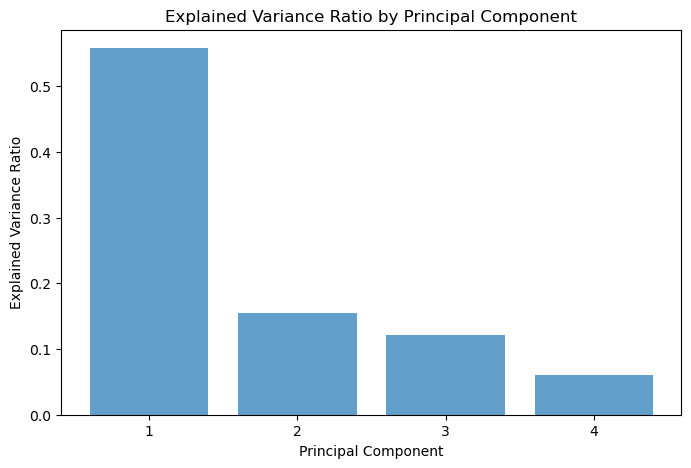

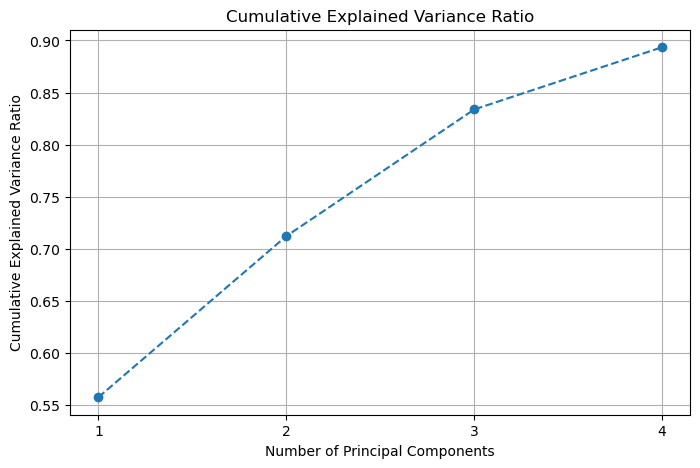

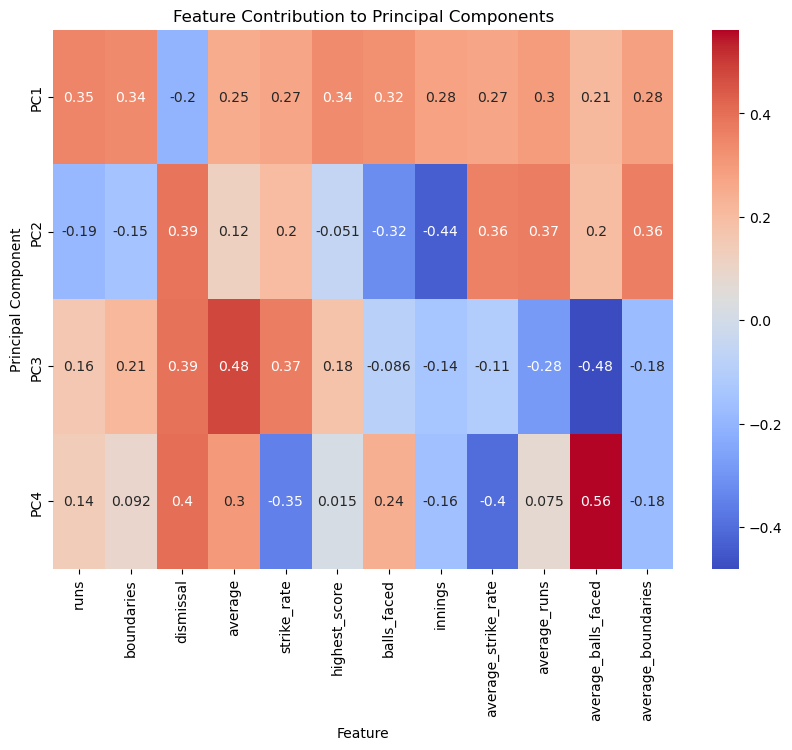

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known

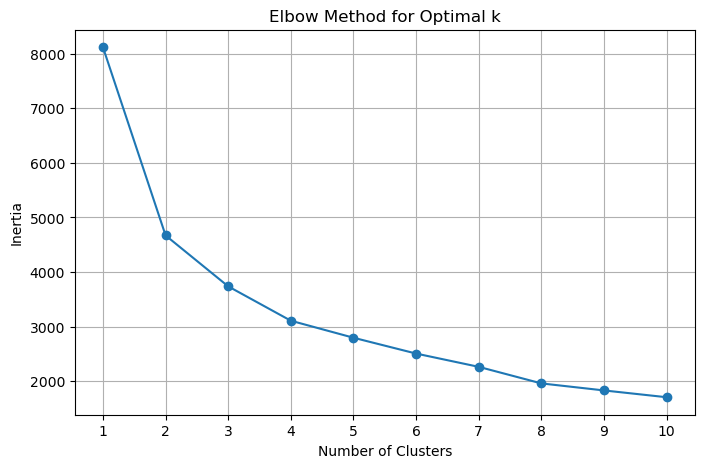

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known

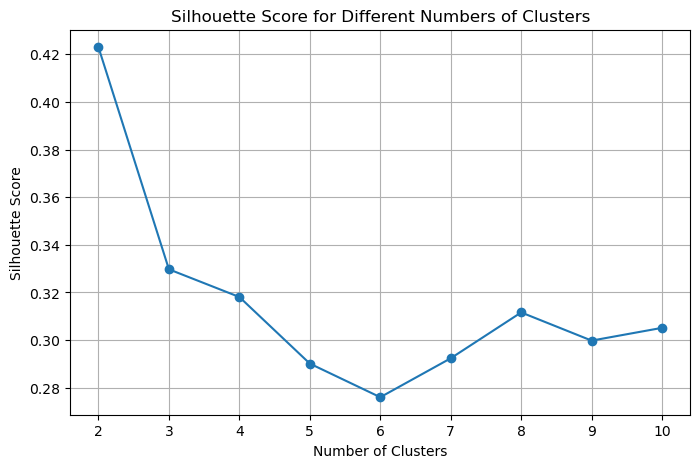

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\AppData\Local\Temp\ipykernel_20088\4247341416.py:131: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', optimal_k)


                   runs  boundaries  dismissal  balls_faced  innings  \
W Symonds            37           5   2.500000          102        6   
J Llewellyn-Dixon    26           2   1.428571           45        7   
L Graham             96          14   2.000000          139        6   
O Gray               17           1   2.500000           44        4   
A Davison            42           4   1.666667          111        7   

                                    scores    average strike_rate  \
W Symonds             [3, 5, 1, 16, 12, 0]   9.250000    36.27451   
J Llewellyn-Dixon    [1, 4, 7, 5, 5, 4, 0]   3.714286   57.777778   
L Graham           [9, 19, 11, 10, 15, 32]  19.200000   69.064748   
O Gray                       [1, 2, 14, 0]   4.250000   38.636364   
A Davison           [9, 2, 3, 10, 9, 9, 0]   7.000000   37.837838   

                   highest_score  average_runs  average_balls_faced  \
W Symonds                     16      3.250000            15.500000   
J Llewelly

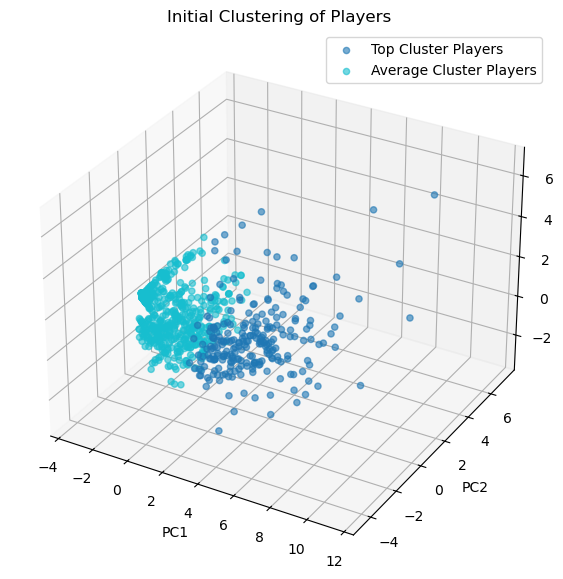

Silhouette Score for 2 clusters: 0.42


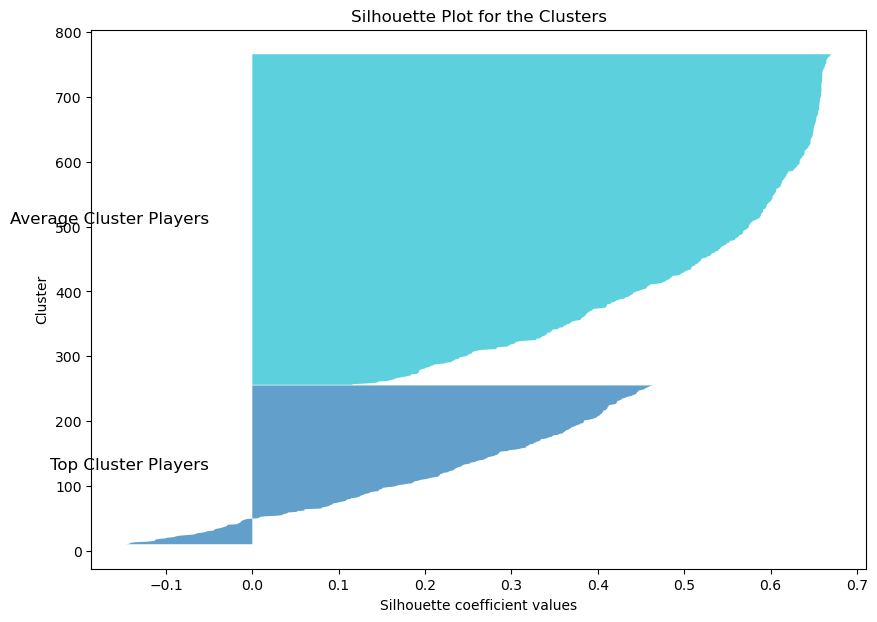

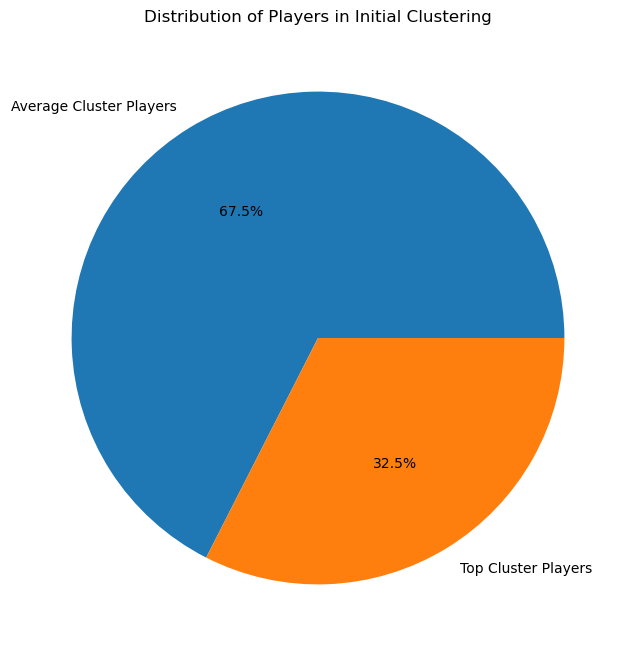

In [1274]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Sample Data (assuming batsman_metrics is a dictionary and defined)
data = batsman_metrics
df_bat1 = pd.DataFrame.from_dict(data, orient='index')
df_bat1 = df_bat1.fillna(0)

# Features to use for clustering
features = ['runs', 'boundaries', 'dismissal', 'average', 'strike_rate', 'highest_score',
            'balls_faced', 'innings', 'average_strike_rate', 'average_runs', 
            'average_balls_faced', 'average_boundaries']

# Extract features
X = df_bat1[features]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X_scaled)

# Plot the explained variance ratio as a bar graph
plt.figure(figsize=(8, 5))
num_components = len(pca.explained_variance_ratio_)
plt.bar(range(1, num_components + 1), pca.explained_variance_ratio_, alpha=0.7, align='center')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.xticks(range(1, num_components + 1))
plt.savefig('explained_variance_ratio.png')  # Save the image
plt.show()

# Plot the cumulative explained variance ratio
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, num_components + 1), cumulative_variance, marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio')
plt.xticks(range(1, num_components + 1))
plt.grid(True)
plt.savefig('cumulative_explained_variance.png')  # Save the image
plt.show()

# Plot the contribution of each feature to each principal component
plt.figure(figsize=(10, 7))
num_components = pca.components_.shape[0]  # Number of principal components
num_features = pca.components_.shape[1]    # Number of features

# Ensure the number of row indices matches the number of principal components
pc_labels = [f'PC{i+1}' for i in range(num_components)]

# Create DataFrame for heatmap
heatmap_df = pd.DataFrame(pca.components_, columns=features, index=pc_labels)

# Plot heatmap
sns.heatmap(heatmap_df, annot=True, cmap='coolwarm')
plt.title('Feature Contribution to Principal Components')
plt.xlabel('Feature')
plt.ylabel('Principal Component')
plt.savefig('feature_contribution_heatmap.png')  # Save the image
plt.show()

# Step 1: Determine the optimal number of clusters using the Elbow method
inertia = []
K_range = range(1, 11)  # Trying 1 to 10 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)

# Plot the Elbow method result
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.xticks(K_range)
plt.grid(True)
plt.savefig('elbow_method.png')  # Save the image
plt.show()

# Step 2: Compute Silhouette Scores for a range of cluster numbers
silhouette_scores = []
K_range = range(2, 11)  # Silhouette score requires at least 2 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    clusters = kmeans.fit_predict(X_pca)
    silhouette_avg = silhouette_score(X_pca, clusters)
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(K_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different Numbers of Clusters')
plt.xticks(K_range)
plt.grid(True)
plt.savefig('silhouette_scores.png')  # Save the image
plt.show()

# Choose the optimal number of clusters based on silhouette score
optimal_k = 2  # Replace this with the optimal number of clusters from the Silhouette Score plot
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
clusters = kmeans.fit_predict(X_pca)

# Add the cluster number to the DataFrame
df_bat1['Cluster'] = clusters

# Display the DataFrame with the cluster column
print(df_bat1.head())

# 3D Scatter Plot with Renamed Clusters
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Define colors for the clusters
colors = plt.cm.get_cmap('tab10', optimal_k)

# Renaming the clusters
cluster_labels = {0: 'Top Cluster Players', 1: 'Average Cluster Players'}

for i in range(optimal_k):
    ax.scatter(X_pca[clusters == i, 0], X_pca[clusters == i, 1], X_pca[clusters == i, 2],
               color=colors(i), label=cluster_labels[i], alpha=0.6)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('Initial Clustering of Players')
ax.legend()
plt.savefig('initial_clustering_players.png')  # Save the image
plt.show()

# Step 4: Plot Silhouette Scores for Each Cluster
silhouette_avg = silhouette_score(X_pca, clusters)
print(f'Silhouette Score for {optimal_k} clusters: {silhouette_avg:.2f}')

# Compute silhouette scores for each sample
sample_silhouette_values = silhouette_samples(X_pca, clusters)

# Create a silhouette plot
fig, ax = plt.subplots(figsize=(10, 7))
y_lower = 10
for i in range(optimal_k):
    # Aggregate the silhouette scores for samples belonging to cluster i
    cluster_silhouette_values = sample_silhouette_values[clusters == i]
    cluster_silhouette_values.sort()
    
    # Compute the size of the cluster
    size_cluster_i = cluster_silhouette_values.shape[0]
    
    # Plot the silhouette scores for cluster i
    ax.fill_betweenx(np.arange(y_lower, y_lower + size_cluster_i),
                     0, cluster_silhouette_values,
                     facecolor=colors(i), alpha=0.7)
    
    # Add the cluster label
    ax.text(-0.05, y_lower + 0.5 * size_cluster_i, cluster_labels[i],
            color='black', va='center', ha='right', fontsize=12)
    
    # Update y_lower for the next cluster
    y_lower += size_cluster_i

ax.set_xlabel('Silhouette coefficient values')
ax.set_ylabel('Cluster')
ax.set_title('Silhouette Plot for the Clusters')
plt.savefig('silhouette_plot.png')  # Save the image
plt.show()

# Pie Chart of Total Number of Points in Each Cluster with Custom Labels
cluster_counts = df_bat1['Cluster'].value_counts()
plt.figure(figsize=(8, 8))

# Custom labels for the pie chart
pie_labels = [cluster_labels[i] for i in cluster_counts.index]

plt.pie(cluster_counts, labels=pie_labels, autopct='%1.1f%%', colors=plt.cm.tab10(range(optimal_k)))
plt.title('Distribution of Players in Initial Clustering')
plt.savefig('cluster_distribution_pie_chart.png')  # Save the pie chart
plt.show()


In [1275]:
# Remove the 'scores' column from the DataFrame
df_bat1 = df_bat1.drop(columns=['scores'])

# Ensure all columns are numeric
df_bat1 = df_bat1.apply(pd.to_numeric, errors='coerce')

# Compute the mean of each feature by cluster
cluster_means1 = df_bat1.groupby('Cluster').mean()

# Display the cluster means
print(cluster_means1)


              runs  boundaries  dismissal  balls_faced   innings    average  \
Cluster                                                                       
0        78.556911   10.186992   3.417774    99.792683  6.678862  22.616264   
1        10.426614    0.966732   6.567313    26.330724  2.855186   5.356164   

         strike_rate  highest_score  average_runs  average_balls_faced  \
Cluster                                                                  
0          81.666076      26.016260      8.692371            14.348140   
1          37.499801       6.931507      2.061132             7.111986   

         average_boundaries  average_strike_rate  
Cluster                                           
0                  1.044413            56.113522  
1                  0.160255            18.979961  


In [1276]:
df_bat1

,runs,boundaries,dismissal,balls_faced,innings,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,Cluster
W Symonds,37,5,2.500000,102,6,9.250000,36.274510,16,3.250000,15.500000,0.250000,18.125000,1
J Llewellyn-Dixon,26,2,1.428571,45,7,3.714286,57.777778,7,3.714286,8.571429,0.285714,40.442857,1
L Graham,96,14,2.000000,139,6,19.200000,69.064748,32,15.000000,26.400000,2.400000,57.814000,0
O Gray,17,1,2.500000,44,4,4.250000,38.636364,14,5.000000,13.500000,0.250000,23.957500,1
A Davison,42,4,1.666667,111,7,7.000000,37.837838,10,5.333333,16.833333,0.333333,27.848333,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
A Daughtery,11,1,10.000000,14,1,11.000000,78.571429,11,11.000000,17.000000,1.000000,64.710000,1
A Routledge,0,0,10.000000,1,1,0.000000,0.000000,0,0.000000,1.000000,0.000000,0.000000,1
E Gaines,0,0,10.000000,4,1,0.000000,0.000000,0,0.000000,4.000000,0.000000,0.000000,1
R Donnelly,0,0,10.000000,12,1,0.000000,0.000000,0,0.000000,12.000000,0.000000,0.000000,1


In [1277]:
df_bat1[(df_bat1['Cluster'] == 0) & (df_bat1['runs'] > 250)]

,runs,boundaries,dismissal,balls_faced,innings,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,Cluster
N Workman,287,48,2.500000,168,12,71.750000,170.833333,35,15.750000,11.750000,2.500000,161.805000,0
F Wright,314,49,1.428571,303,15,44.857143,103.630363,53,13.428571,15.285714,1.714286,79.808571,0
C McCarthy,286,44,3.333333,164,13,95.333333,174.390244,34,9.333333,12.666667,1.333333,81.480000,0
C Bennett,251,43,5.000000,170,9,125.500000,147.647059,34,0.500000,10.500000,0.000000,5.555000,0


In [1278]:
df_bat1[(df_bat1['Cluster'] == 1) & (df_bat1['strike_rate'] > 100) & (df_bat1['balls_faced'] == 24)]

,runs,boundaries,dismissal,balls_faced,innings,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,Cluster


In [1279]:
cluster_1_df = df_bat1[df_bat1['Cluster'] == 0]


In [1280]:
cluster_i = df_bat1[df_bat1['Cluster'] == 1]

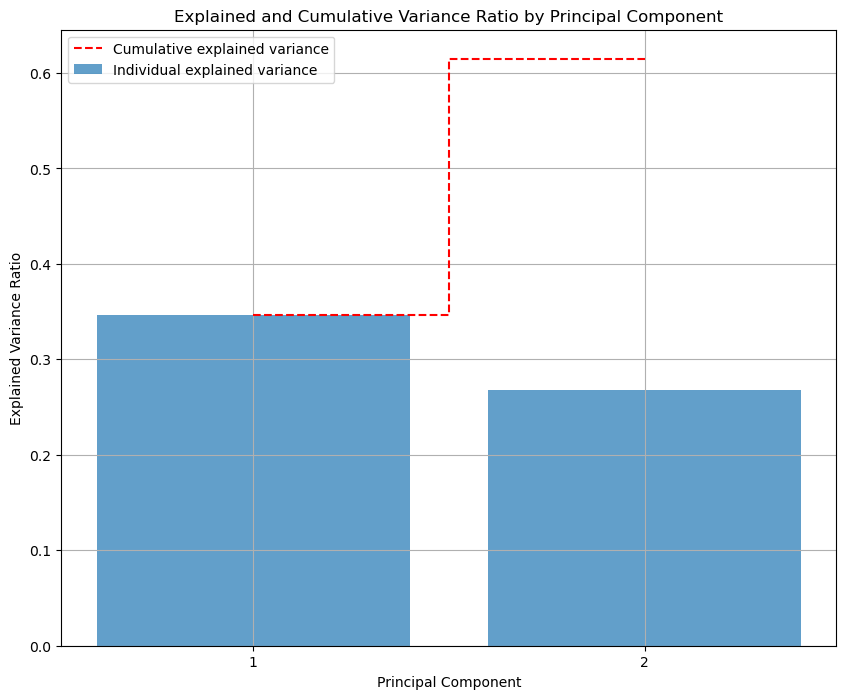

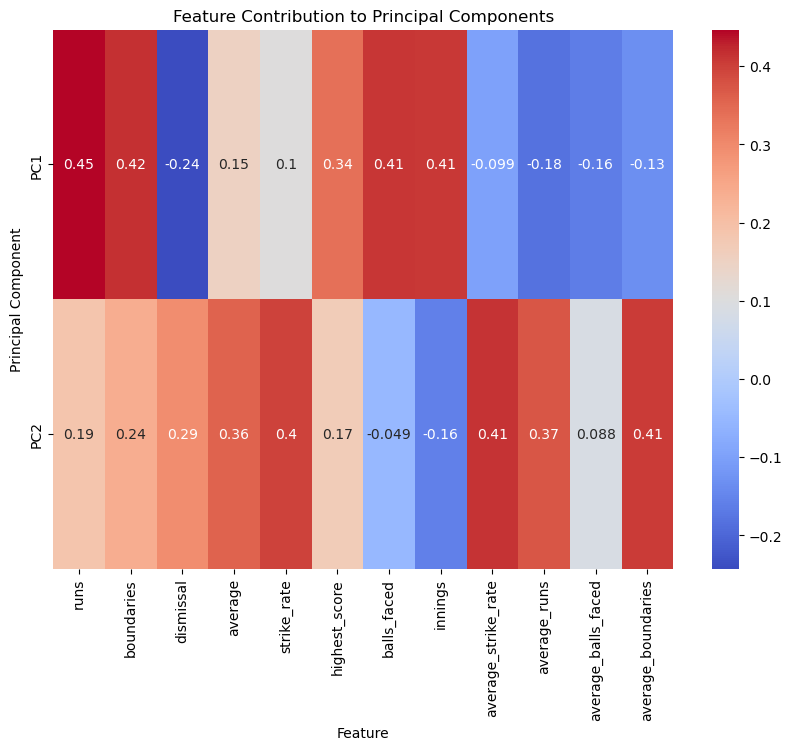

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known

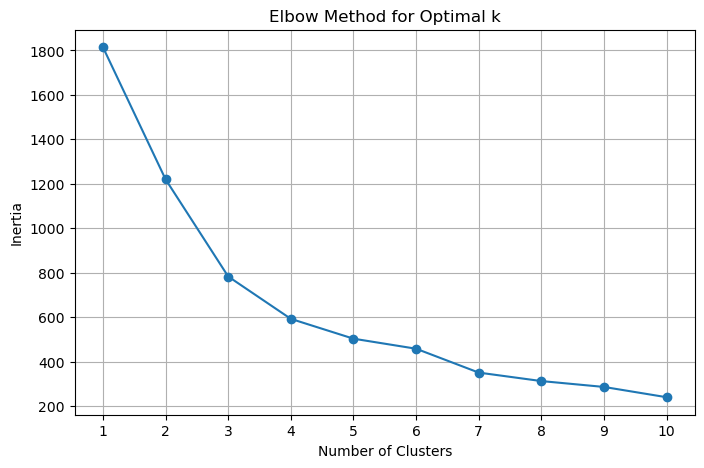

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known

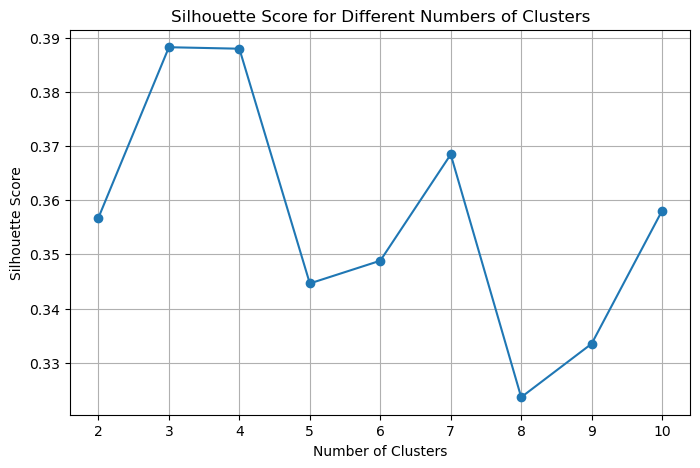

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\dheer\AppData\Local\Temp\ipykernel_20088\835846668.py:106: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bat2['Cluster'] = clusters
C:\Users\dheer\AppData\Local\Temp\ipykernel_20088\835846668.py:113: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab

            runs  boundaries  dismissal  balls_faced  innings  average  \
L Graham      96          14   2.000000          139        6     19.2   
A Davison     42           4   1.666667          111        7      7.0   
A Rowell      38           7   2.500000           39        4      9.5   
K Massam      62           5   2.500000           63        5     15.5   
L Thompson    51           7   2.000000           54        5     10.2   

            strike_rate  highest_score  average_runs  average_balls_faced  \
L Graham      69.064748             32     15.000000            26.400000   
A Davison     37.837838             10      5.333333            16.833333   
A Rowell      97.435897             17      9.500000            10.750000   
K Massam      98.412698             30      8.000000            10.750000   
L Thompson    94.444444             19     10.200000            11.200000   

            average_boundaries  average_strike_rate  Cluster  
L Graham              2.40000

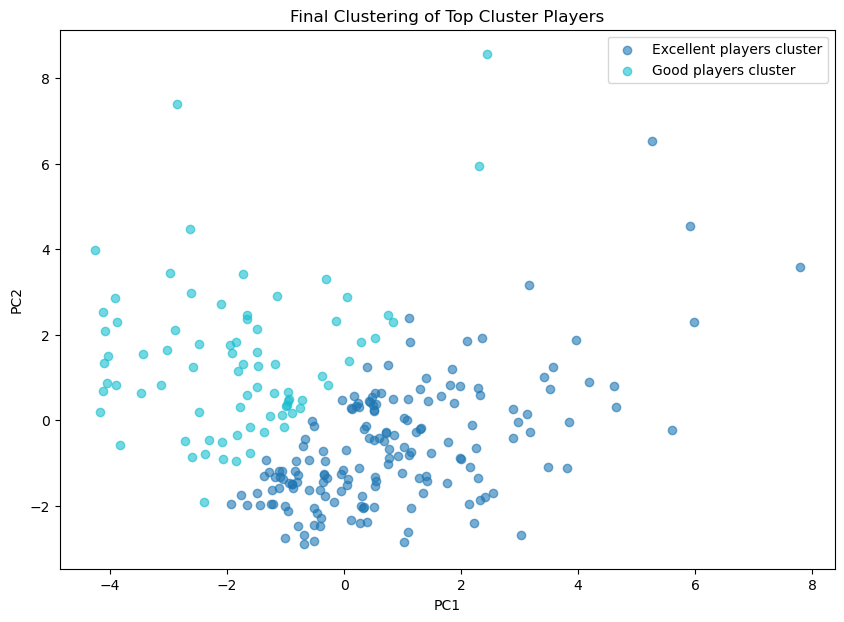

Silhouette Score for 2 clusters: 0.36


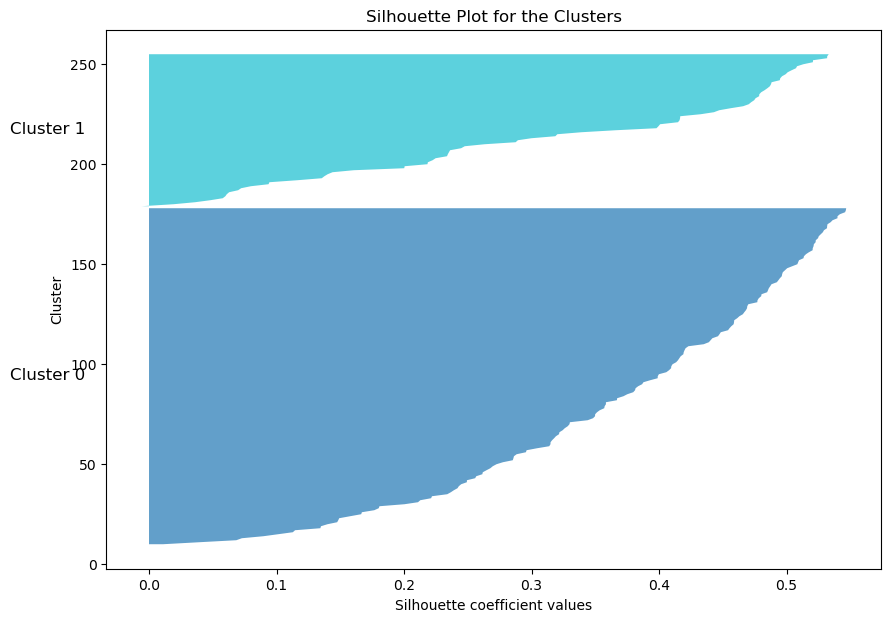

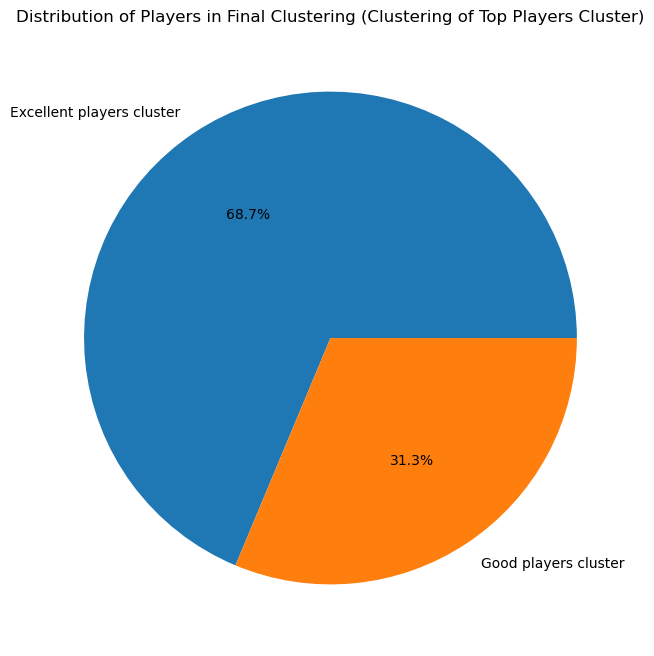

In [1281]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Sample data
df_bat2 = cluster_1_df

# Features to use for clustering
features = ['runs', 'boundaries', 'dismissal', 'average', 'strike_rate', 'highest_score',
            'balls_faced', 'innings', 'average_strike_rate', 'average_runs', 
            'average_balls_faced', 'average_boundaries']

# Extract features
X = df_bat2[features]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA with 2 components (for clustering)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Plot the explained variance ratio and cumulative variance as a bar graph
plt.figure(figsize=(10, 8))

# Explained variance for each component
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Plotting
plt.bar(range(1, 3), explained_variance_ratio, alpha=0.7, align='center', label='Individual explained variance')
plt.step(range(1, 3), cumulative_explained_variance, where='mid', linestyle='--', color='red', label='Cumulative explained variance')

plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained and Cumulative Variance Ratio by Principal Component')
plt.xticks(range(1, 3))
plt.legend(loc='best')
plt.grid(True)
plt.savefig('explained_variance_ratio_2_pca.png')  # Save the explained variance ratio graph
plt.show()

# Plot the contribution of each feature to each principal component
plt.figure(figsize=(10, 7))
sns.heatmap(pd.DataFrame(pca.components_, columns=features, index=['PC1', 'PC2']),
            annot=True, cmap='coolwarm')
plt.title('Feature Contribution to Principal Components')
plt.xlabel('Feature')
plt.ylabel('Principal Component')
plt.savefig('feature_contribution_heatmap_2_pca.png')  # Save the heatmap
plt.show()

# Step 1: Determine the optimal number of clusters using the Elbow method
inertia = []
K_range = range(1, 11)  # Trying 1 to 10 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)

# Plot the Elbow method result
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.xticks(K_range)
plt.grid(True)
plt.savefig('elbow_method_2_pca.png')  # Save the Elbow method plot
plt.show()

# Step 2: Compute Silhouette Scores for a range of cluster numbers
silhouette_scores = []
K_range = range(2, 11)  # Silhouette score requires at least 2 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    clusters = kmeans.fit_predict(X_pca)
    silhouette_avg = silhouette_score(X_pca, clusters)
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(K_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different Numbers of Clusters')
plt.xticks(K_range)
plt.grid(True)
plt.savefig('silhouette_scores_2_pca.png')  # Save the Silhouette Score plot
plt.show()

# Choose the optimal number of clusters based on silhouette score
optimal_k = 2  # Replace this with the optimal number of clusters from the Silhouette Score plot
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
clusters = kmeans.fit_predict(X_pca)

# Add the cluster number to the DataFrame
df_bat2['Cluster'] = clusters

# Display the DataFrame with the cluster column
print(df_bat2.head())

# 2D Scatter Plot (for the two principal components)
plt.figure(figsize=(10, 7))
colors = plt.cm.get_cmap('tab10', optimal_k)

cluster_labels = {0: 'Excellent players cluster', 1: 'Good players cluster'}

for i in range(optimal_k):
    plt.scatter(X_pca[clusters == i, 0], X_pca[clusters == i, 1],
                color=colors(i), label=cluster_labels[i], alpha=0.6)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Final Clustering of Top Cluster Players')
plt.legend()
plt.savefig('final_clustering_of_top_cluster_players_2_pca.png')  # Save the image
plt.show()

# Step 4: Plot Silhouette Scores for Each Cluster
silhouette_avg = silhouette_score(X_pca, clusters)
print(f'Silhouette Score for {optimal_k} clusters: {silhouette_avg:.2f}')

# Compute silhouette scores for each sample
sample_silhouette_values = silhouette_samples(X_pca, clusters)

# Create a silhouette plot
plt.figure(figsize=(10, 7))
y_lower = 10
for i in range(optimal_k):
    # Aggregate the silhouette scores for samples belonging to cluster i
    cluster_silhouette_values = sample_silhouette_values[clusters == i]
    cluster_silhouette_values.sort()
    
    # Compute the size of the cluster
    size_cluster_i = cluster_silhouette_values.shape[0]
    
    # Plot the silhouette scores for cluster i
    plt.fill_betweenx(np.arange(y_lower, y_lower + size_cluster_i),
                     0, cluster_silhouette_values,
                     facecolor=colors(i), alpha=0.7)
    
    # Add the cluster label
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, f'Cluster {i}',
            color='black', va='center', ha='right', fontsize=12)
    
    # Update y_lower for the next cluster
    y_lower += size_cluster_i

plt.xlabel('Silhouette coefficient values')
plt.ylabel('Cluster')
plt.title('Silhouette Plot for the Clusters')
plt.savefig('silhouette_plot_2_pca.png')  # Save the silhouette plot
plt.show()

# Pie Chart of Total Number of Points in Each Cluster with Custom Labels
cluster_counts = df_bat2['Cluster'].value_counts()
plt.figure(figsize=(8, 8))

# Custom labels for the pie chart
pie_labels = [cluster_labels[i] for i in cluster_counts.index]

plt.pie(cluster_counts, labels=pie_labels, autopct='%1.1f%%', colors=plt.cm.tab10(range(optimal_k)))
plt.title('Distribution of Players in Final Clustering (Clustering of Top Players Cluster)')
plt.savefig('cluster_distribution_pie_chart_2_pca.png')  # Save the pie chart
plt.show()


In [1282]:
from PIL import Image

# Load the image
image_path = 'feature_contribution_heatmap_4_pca.png'  # or .jpg, .jpeg, etc.
image = Image.open(image_path)

# Display the image
image.show()


In [1283]:
# Remove the 'scores' column from the DataFrame
#df_bat2 = df_bat2.drop(columns=['scores'])

# Compute the mean of each feature by cluster
cluster_means = df_bat2.groupby('Cluster').mean()

# Display the cluster means
print(cluster_means)


              runs  boundaries  dismissal  balls_faced   innings    average  \
Cluster                                                                       
0        91.331361   11.721893   2.313248   118.928994  8.082840  20.584917   
1        50.519481    6.818182   5.841991    57.792208  3.597403  27.074675   

         strike_rate  highest_score  average_runs  average_balls_faced  \
Cluster                                                                  
0          77.425740      27.562130      6.804477            12.699659   
1          90.972787      22.623377     12.835931            17.966234   

         average_boundaries  average_strike_rate  
Cluster                                           
0                  0.775004            45.985927  
1                  1.635714            78.341619  


In [1284]:
cluster_ii = df_bat2[df_bat2['Cluster'] == 1]
cluster_iii = df_bat2[df_bat2['Cluster'] == 0]
cluster_ii['rating'] = 2
cluster_iii['rating'] = 3
cluster_i['rating'] = 1
combined_df = pd.concat([cluster_ii, cluster_iii, cluster_i])

# Reset index if needed (optiona

C:\Users\dheer\AppData\Local\Temp\ipykernel_20088\3192558432.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_ii['rating'] = 2
C:\Users\dheer\AppData\Local\Temp\ipykernel_20088\3192558432.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_iii['rating'] = 3
C:\Users\dheer\AppData\Local\Temp\ipykernel_20088\3192558432.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

In [1285]:
from sklearn.preprocessing import StandardScaler

# Assuming `combined_df` is your DataFrame

# Identify numeric columns (excluding the target variable 'rating')
numeric_columns = combined_df.select_dtypes(include=['float64', 'int64']).columns
numeric_columns = numeric_columns.drop('rating')  # Exclude the target variable if it's numeric

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on the numeric columns and transform them
combined_df[numeric_columns] = scaler.fit_transform(combined_df[numeric_columns])

# Now `combined_df` has its numeric columns standardized


In [1286]:
combined_df=combined_df.dropna()
# Assuming `combined_df` is your DataFrame
y=combined_df["rating"]
x = combined_df[['runs', 'boundaries', 'dismissal', 'balls_faced', 
                 'innings', 'average', 'strike_rate', 'highest_score', 
                 'average_runs', 'average_balls_faced', 
                 'average_boundaries', 'average_strike_rate']]
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators=500)
model.fit(x, y)

# Get feature importance
importances = model.feature_importances_



from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
x = combined_df[['runs', 'boundaries', 'dismissal', 'balls_faced', 
         'innings', 'average', 'strike_rate', 'highest_score', 
         'average_runs', 'average_balls_faced', 
         'average_boundaries', 'average_strike_rate']]
y = combined_df["rating"]

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Initialize and train the RandomForestClassifier
model = RandomForestClassifier(n_estimators=500, random_state=42)
model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = model.predict(x_test)

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F-measure (F1 Score): {f1:.4f}")



# Coefficients
features = [
    'runs',
    'boundaries',
    'dismissal',
    'balls_faced',
    'innings',
    'average',
    'strike_rate',
    'highest_score',
    'average_runs',
    'average_balls_faced',
    'average_boundaries',
    'average_strike_rate'
]

# Create a dictionary of features and their importances
coefficients = dict(zip(features, importances))
# Compute the weighted score
combined_df['weighted_score'] = (
    combined_df['runs'] * coefficients['runs'] +
    combined_df['boundaries'] * coefficients['boundaries'] +
    combined_df['dismissal'] * coefficients['dismissal'] +
    combined_df['balls_faced'] * coefficients['balls_faced'] +
    combined_df['innings'] * coefficients['innings'] +
    combined_df['average'] * coefficients['average'] +
    combined_df['strike_rate'] * coefficients['strike_rate'] +
    combined_df['highest_score'] * coefficients['highest_score'] +
    combined_df['average_runs'] * coefficients['average_runs'] +
    combined_df['average_balls_faced'] * coefficients['average_balls_faced'] +
    combined_df['average_boundaries'] * coefficients['average_boundaries'] +
    combined_df['average_strike_rate'] * coefficients['average_strike_rate']
)

# Sort the DataFrame by 'weighted_score' from max to min
sorted_df = combined_df.sort_values(by='weighted_score', ascending=False)

# Print the sorted DataFrame
print(sorted_df)





Accuracy: 0.9342
Precision: 0.9355
Recall: 0.9342
F-measure (F1 Score): 0.9330
                 runs  boundaries  dismissal  balls_faced   innings  \
F Wright     6.376593    7.171003  -1.153651     4.965339  3.528026   
N Workman    5.764838    7.011778  -0.853291     2.313718  2.557210   
C McCarthy   5.742181    6.374879  -0.619678     2.235151  2.880815   
J Harker     3.499082    4.145733   1.249228     1.370919  0.939183   
J Soppitt    4.178809    4.145733  -1.153651     3.924333  2.233604   
...               ...         ...        ...          ...       ...   
E Stephen   -0.737882   -0.631010   1.249228    -0.946795 -1.326056   
A Thorve    -0.737882   -0.631010   1.249228    -0.966436 -1.326056   
L Seldon    -0.737882   -0.631010   1.249228    -0.966436 -1.326056   
L Soulsby   -0.737882   -0.631010   1.249228    -0.966436 -1.326056   
T Whitfield -0.737882   -0.631010   1.249228    -0.986078 -1.326056   

               average  strike_rate  highest_score  average_runs  \


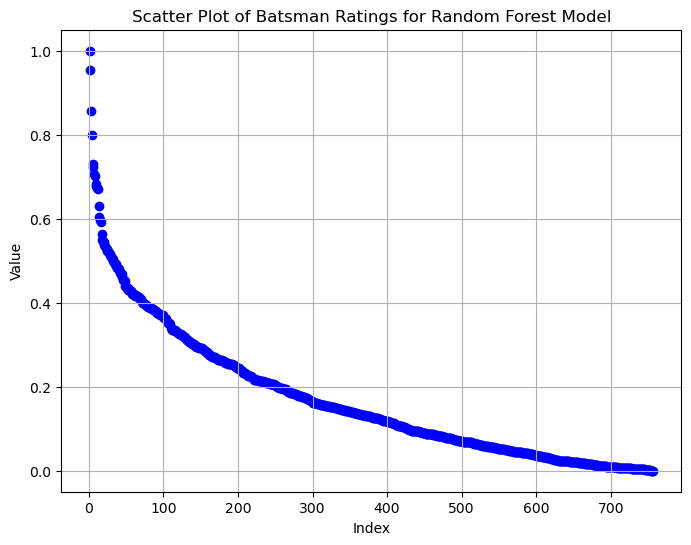

In [1287]:
df = sorted_df

min_score = df['weighted_score'].min()
max_score = df['weighted_score'].max()

df['normalized_score'] = (df['weighted_score'] - min_score) / (max_score - min_score)




# Extract float values
values = df['normalized_score']

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(range(1, len(values) + 1), values, color='blue', marker='o')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Batsman Ratings for Random Forest Model')
plt.grid(True)

# Save the plot as an image file

# Show the plot (optional, remove if not needed)
plt.show()

In [1288]:
sorted_df.head(10)

,runs,boundaries,dismissal,balls_faced,innings,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,Cluster,rating,weighted_score,normalized_score
F Wright,6.376593,7.171003,-1.153651,4.965339,3.528026,2.093258,1.401277,3.411455,2.029541,0.809908,1.999136,1.622778,0,3,4.112658,1.000000
N Workman,5.764838,7.011778,-0.853291,2.313718,2.557210,3.754230,3.220004,1.871163,2.540958,0.318067,3.239161,4.351614,0,3,3.890926,0.955264
C McCarthy,5.742181,6.374879,-0.619678,2.235151,2.880815,5.210797,3.316265,1.785591,1.127348,0.445582,1.397912,1.678403,0,3,3.402960,0.856814
J Harker,3.499082,4.145733,1.249228,1.370919,0.939183,10.872366,2.814056,1.614447,1.935125,-0.342688,4.028267,5.147171,1,2,3.120746,0.799875
J Soppitt,4.178809,4.145733,-1.153651,3.924333,2.233604,1.237405,0.945794,1.700019,1.966597,1.604802,1.999136,1.139790,0,3,2.771171,0.729346
J Winlow,4.178809,4.464182,-1.203711,4.611790,2.880815,0.998075,0.657310,1.443304,1.687285,1.622191,1.266394,0.326738,0,3,2.739154,0.722887
C Bennett,4.949166,6.215655,-0.152451,2.353001,1.586394,7.073968,2.592509,1.785591,-0.818660,0.144184,-0.706372,-0.848377,0,3,2.658107,0.706535
J Errington,4.405385,3.668059,-1.320518,5.043906,4.498843,0.491108,0.597798,1.443304,0.741818,0.306475,0.477288,1.039344,0,3,2.629739,0.700811
J Mellons,4.360069,2.871935,-1.153651,4.101107,2.880815,1.307991,0.947758,1.700019,1.777766,1.306717,0.646382,0.914152,0,3,2.543124,0.683336
H Keegan,3.703000,3.508834,-1.153651,3.433291,2.880815,1.052118,0.954214,1.614447,2.155428,2.002249,1.548218,0.623666,0,3,2.513596,0.677379


In [1290]:
coefficients

{'runs': 0.22643549184394968,
 'boundaries': 0.1391693799973617,
 'dismissal': 0.02296095041189359,
 'balls_faced': 0.0996087242678914,
 'innings': 0.05974683975200601,
 'average': 0.04176393073147808,
 'strike_rate': 0.022499081299332247,
 'highest_score': 0.10617167624539088,
 'average_runs': 0.11404921006933741,
 'average_balls_faced': 0.027860780172397515,
 'average_boundaries': 0.07959805671489092,
 'average_strike_rate': 0.06013587849407053}

In [1291]:
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split

# Assuming combined_df is your DataFrame

# Define the feature matrix 'x' and target vector 'y'
x = combined_df[['runs', 'boundaries', 'dismissal', 'balls_faced', 
                 'innings', 'average', 'strike_rate', 'highest_score', 
                 'average_runs', 'average_balls_faced', 
                 'average_boundaries', 'average_strike_rate']]
y = combined_df["rating"]

# Apply Label Encoding to target labels to ensure they start from 0
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Initialize the XGBoost classifier
model = xgb.XGBClassifier(n_estimators=500, random_state=42)

# Train the model
model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = model.predict(x_test)

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F-measure (F1 Score): {f1:.4f}")

# Get feature importances from the XGBoost model
importances = model.feature_importances_

# Create a dictionary of features and their importances
coefficients = dict(zip(features, importances))

# Compute the weighted score
combined_df['weighted_score'] = (
    combined_df['runs'] * coefficients['runs'] +
    combined_df['boundaries'] * coefficients['boundaries'] +
    combined_df['dismissal'] * coefficients['dismissal'] +
    combined_df['balls_faced'] * coefficients['balls_faced'] +
    combined_df['innings'] * coefficients['innings'] +
    combined_df['average'] * coefficients['average'] +
    combined_df['strike_rate'] * coefficients['strike_rate'] +
    combined_df['highest_score'] * coefficients['highest_score'] +
    combined_df['average_runs'] * coefficients['average_runs'] +
    combined_df['average_balls_faced'] * coefficients['average_balls_faced'] +
    combined_df['average_boundaries'] * coefficients['average_boundaries'] +
    combined_df['average_strike_rate'] * coefficients['average_strike_rate']
)

# Sort the DataFrame by 'weighted_score' from max to min
sorted_df = combined_df.sort_values(by='weighted_score', ascending=False)

# Print the sorted DataFrame
print(sorted_df)


Accuracy: 0.9342
Precision: 0.9340
Recall: 0.9342
F-measure (F1 Score): 0.9335
                 runs  boundaries  dismissal  balls_faced   innings  \
F Wright     6.376593    7.171003  -1.153651     4.965339  3.528026   
N Workman    5.764838    7.011778  -0.853291     2.313718  2.557210   
C McCarthy   5.742181    6.374879  -0.619678     2.235151  2.880815   
J Errington  4.405385    3.668059  -1.320518     5.043906  4.498843   
J Harker     3.499082    4.145733   1.249228     1.370919  0.939183   
...               ...         ...        ...          ...       ...   
I McGann    -0.737882   -0.631010   1.249228    -0.946795 -1.326056   
A Thorve    -0.737882   -0.631010   1.249228    -0.966436 -1.326056   
L Seldon    -0.737882   -0.631010   1.249228    -0.966436 -1.326056   
L Soulsby   -0.737882   -0.631010   1.249228    -0.966436 -1.326056   
T Whitfield -0.737882   -0.631010   1.249228    -0.986078 -1.326056   

               average  strike_rate  highest_score  average_runs  \


In [1295]:
sorted_df.head(10)

,runs,boundaries,dismissal,balls_faced,innings,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,Cluster,rating,weighted_score
F Wright,6.376593,7.171003,-1.153651,4.965339,3.528026,2.093258,1.401277,3.411455,2.029541,0.809908,1.999136,1.622778,0,3,4.319542
N Workman,5.764838,7.011778,-0.853291,2.313718,2.557210,3.754230,3.220004,1.871163,2.540958,0.318067,3.239161,4.351614,0,3,4.172356
C McCarthy,5.742181,6.374879,-0.619678,2.235151,2.880815,5.210797,3.316265,1.785591,1.127348,0.445582,1.397912,1.678403,0,3,3.735472
J Errington,4.405385,3.668059,-1.320518,5.043906,4.498843,0.491108,0.597798,1.443304,0.741818,0.306475,0.477288,1.039344,0,3,3.079183
J Harker,3.499082,4.145733,1.249228,1.370919,0.939183,10.872366,2.814056,1.614447,1.935125,-0.342688,4.028267,5.147171,1,2,3.035645
J Mellons,4.360069,2.871935,-1.153651,4.101107,2.880815,1.307991,0.947758,1.700019,1.777766,1.306717,0.646382,0.914152,0,3,2.993981
J Soppitt,4.178809,4.145733,-1.153651,3.924333,2.233604,1.237405,0.945794,1.700019,1.966597,1.604802,1.999136,1.139790,0,3,2.985248
J Winlow,4.178809,4.464182,-1.203711,4.611790,2.880815,0.998075,0.657310,1.443304,1.687285,1.622191,1.266394,0.326738,0,3,2.941343
H Keegan,3.703000,3.508834,-1.153651,3.433291,2.880815,1.052118,0.954214,1.614447,2.155428,2.002249,1.548218,0.623666,0,3,2.793267
C Bennett,4.949166,6.215655,-0.152451,2.353001,1.586394,7.073968,2.592509,1.785591,-0.818660,0.144184,-0.706372,-0.848377,0,3,2.644589


In [1296]:
brf = sorted_df.index.tolist()

# Print the list of player names
print(brf)

['F Wright', 'N Workman', 'C McCarthy', 'J Errington', 'J Harker', 'J Mellons', 'J Soppitt', 'J Winlow', 'H Keegan', 'C Bennett', 'F Lawler', 'R Curtis', 'O Pattison', 'S Lowther', 'L Agnew', 'L Robertson', 'M Stokoe', 'J Lane', 'O McGilvray', 'A Hawkins', 'E Jackson', 'E Lynch', 'C Tudball', 'R Hart', 'L Harding', 'W Dixon', 'W Curry', 'A Azhar', 'K Sathishkumar', 'S Ramsey', 'N Jepson', 'A Peart', 'C Brook', 'E Morris', 'T Burnham', 'H Simpson', 'B Pratt', 'J Bruce', 'J Hood', 'L Wilson', 'A Samir', 'J Clark', 'I Coy', 'L Graham', 'N Whitfield', 'T McKie', 'N Thursfield', 'H Wilds', 'M McGough', 'S Ragulan', 'T Davison', 'A Grey', 'B McCann', 'C Herkes', 'H Stoker', 'H Forbes-Hunt', 'L McCaffrey', 'L Morris', 'M King', 'W Brookes', 'A Caris', 'R Scott', 'W Lawton', 'I Kahn', 'A Bramley', 'A Hudspeth', 'O Osborne', 'H Banks', 'S Suddick', 'N Stokoe', 'H Coleman', 'J Blacklock', 'Z Cartwright', 'O Potts', 'W Makin', 'J Atkinson', 'A Blenkiron', 'J Heckles', 'L Heslop', 'Y Saleem', 'S H

In [1297]:
cluster_lowb = df_bat1[df_bat1['Cluster'].isin([1])].index.tolist()
cluster_low_mediumb = df_bat2[df_bat2['Cluster'].isin([1])].index.tolist()
cluster_mediumb = df_bat2[df_bat2['Cluster'].isin([0])].index.tolist()


In [1298]:
cluster_mediumb

['A Davison',
 'K Massam',
 'M Robinson',
 'M McGough',
 'N Shaw',
 'C Mccarten',
 'J Benford',
 'L Campbell',
 'J Johnson',
 'Z McDermott',
 'N Watson',
 'J Atkinson',
 'C Osullivan',
 'W Sawyers',
 'J Mellons',
 'M Stokoe',
 'H Collingwood',
 'B Reay',
 'K Hodgson',
 'I Lathan',
 'A Gaughan',
 'E Lynch',
 'N Jepson',
 'N Workman',
 'C Brook',
 'J Gray',
 'J Momand',
 'J Wheatley',
 'J Strong',
 'O Osborne',
 'J Gustard',
 'E Mitchell',
 'A Emmerson',
 'F Lowry',
 'B Thompson',
 'L Agnew',
 'L Harding',
 'J Gulliver',
 'N Gulliver',
 'C Cumiskey',
 'L Gates',
 'S Philliskirk',
 'H Scollen',
 'E Poulton',
 'L Wilson',
 'S Pailla',
 'W Makin',
 'F Todner',
 'J Bruce',
 'L Brennan',
 'C Tudball',
 'A Peart',
 'S Ramsey',
 'S Renshaw',
 'J Renshaw',
 'H Banks',
 'J Liddell',
 'J Hawkins',
 'O Bird',
 'O Pattison',
 'F Wright',
 'J Soppitt',
 'C McCarthy',
 'J English',
 'H Petch',
 'M King',
 'H Wilds',
 'H Coleman',
 'J Hood',
 'J McLaughlin',
 'R Hart',
 'L McCaffrey',
 'Z Charlton',
 '

In [1299]:
import pandas as pd
pdf0=pd.read_excel("nope.xlsx")
pdf0 = pdf0.drop_duplicates()


In [1344]:
pdf0['batter_rating'] = 0

# Assign ratings based on cluster membership
pdf0.loc[pdf0['batsman'].isin(cluster_mediumb), 'batter_rating'] = 3
#pdf.loc[pdf['bowler'].isin(cluster_high), 'bowler_rating'] = 5
pdf0.loc[pdf0['batsman'].isin(cluster_low_mediumb), 'batter_rating'] = 2
pdf0.loc[pdf0['batsman'].isin(cluster_lowb), 'batter_rating'] = 1

In [1345]:
pdf0[pdf0["batter_rating"]==3]

,Over,Ball,Event,Commentary,innings,teamname,teamscore,teamtossinfo,full_match_result,R,B,4s,6s,SR,batting team,bowling team,bowler,batsman,batter_rating
33,Over 15,14.5,1 run,A Routledge to M Kavanagh: 1 run,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Ushaw Moor CC,Bishop Auckland CC,A Routledge,M Kavanagh,3
34,Over 15,14.4,0 runs,A Routledge to M Kavanagh: No run,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Ushaw Moor CC,Bishop Auckland CC,A Routledge,M Kavanagh,3
35,Over 15,14.3,0 runs,A Routledge to M Kavanagh: No run,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Ushaw Moor CC,Bishop Auckland CC,A Routledge,M Kavanagh,3
36,Over 15,14.2,0 runs,A Routledge to M Kavanagh: No run,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Ushaw Moor CC,Bishop Auckland CC,A Routledge,M Kavanagh,3
38,Over 14,13.6,4 runs,M Reynolds to M Kavanagh: 4 runs,1,Ushaw Moor CC,U n d e r 1 3 7 4 / 2 ( 2 0 . 0 ),NaN,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Ushaw Moor CC,Bishop Auckland CC,M Reynolds,M Kavanagh,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47004,Over 9,8.5,1 run,to A Davison: 1 run,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Consett CC,Ryton CC,NaN,A Davison,3
47005,Over 9,8.4,0 runs,to A Davison: No run,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Consett CC,Ryton CC,NaN,A Davison,3
47006,Over 9,8.3,0 runs,to A Davison: No run,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Consett CC,Ryton CC,NaN,A Davison,3
47007,Over 9,8.2,0 runs,to A Davison: No run,2,Consett CC,U n d e r 1 3 4 3 / A l l o u t ...,NaN,RYTON CC WON BY 100 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Consett CC,Ryton CC,NaN,A Davison,3


In [1348]:
df_bat2[(df_bat2["Cluster"] == 0) & (df_bat2["runs"] > 200)]


,runs,boundaries,dismissal,balls_faced,innings,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,Cluster
J Mellons,225,22,1.428571,259,13,32.142857,86.872587,33,12.285714,18.857143,0.857143,58.515714,0
N Workman,287,48,2.500000,168,12,71.750000,170.833333,35,15.750000,11.750000,2.500000,161.805000,0
F Wright,314,49,1.428571,303,15,44.857143,103.630363,53,13.428571,15.285714,1.714286,79.808571,0
J Soppitt,217,30,1.428571,250,11,31.000000,86.800000,33,13.142857,21.000000,1.714286,65.295714,0
C McCarthy,286,44,3.333333,164,13,95.333333,174.390244,34,9.333333,12.666667,1.333333,81.480000,0
J Winlow,217,32,1.250000,285,13,27.125000,76.140351,30,11.875000,21.125000,1.250000,40.865000,0
C Bennett,251,43,5.000000,170,9,125.500000,147.647059,34,0.500000,10.500000,0.000000,5.555000,0
J Errington,227,27,0.833333,307,18,18.916667,73.941368,30,7.583333,11.666667,0.750000,62.277500,0


In [1349]:
batsman_metrics

{'W Symonds': {'runs': 37,
  'boundaries': 5,
  'dismissal': 2.5,
  'balls_faced': 102,
  'innings': 6,
  'scores': [3, 5, 1, 16, 12, 0],
  'average': 9.25,
  'strike_rate': 36.27450980392157,
  'highest_score': 16,
  'average_runs': 3.25,
  'average_balls_faced': 15.5,
  'average_boundaries': 0.25,
  'average_strike_rate': 18.125},
 'J Llewellyn-Dixon': {'runs': 26,
  'boundaries': 2,
  'dismissal': 1.4285714285714284,
  'balls_faced': 45,
  'innings': 7,
  'scores': [1, 4, 7, 5, 5, 4, 0],
  'average': 3.7142857142857144,
  'strike_rate': 57.77777777777777,
  'highest_score': 7,
  'average_runs': 3.7142857142857144,
  'average_balls_faced': 8.571428571428571,
  'average_boundaries': 0.2857142857142857,
  'average_strike_rate': 40.44285714285714},
 'L Graham': {'runs': 96,
  'boundaries': 14,
  'dismissal': 2.0,
  'balls_faced': 139,
  'innings': 6,
  'scores': [9, 19, 11, 10, 15, 32],
  'average': 19.2,
  'strike_rate': 69.06474820143885,
  'highest_score': 32,
  'average_runs': 15.0,

In [1350]:
df_bat2

,runs,boundaries,dismissal,balls_faced,innings,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,Cluster
L Graham,96,14,2.000000,139,6,19.2,69.064748,32,15.000000,26.400000,2.400000,57.814000,1
A Davison,42,4,1.666667,111,7,7.0,37.837838,10,5.333333,16.833333,0.333333,27.848333,0
A Rowell,38,7,2.500000,39,4,9.5,97.435897,17,9.500000,10.750000,1.750000,72.650000,1
K Massam,62,5,2.500000,63,5,15.5,98.412698,30,8.000000,10.750000,0.750000,66.647500,0
L Thompson,51,7,2.000000,54,5,10.2,94.444444,19,10.200000,11.200000,1.400000,71.526000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
H O'Keefe,119,14,10.000000,105,6,119.0,113.333333,32,0.000000,2.000000,0.000000,0.000000,0
A Blenkiron,95,13,5.000000,76,5,47.5,125.000000,35,7.333333,8.333333,1.333333,82.830000,1
S Perrin,59,9,5.000000,73,4,29.5,80.821918,25,10.666667,22.666667,1.333333,49.926667,1
A Doherty,37,6,10.000000,22,2,37.0,168.181818,31,6.000000,8.000000,1.000000,75.000000,1


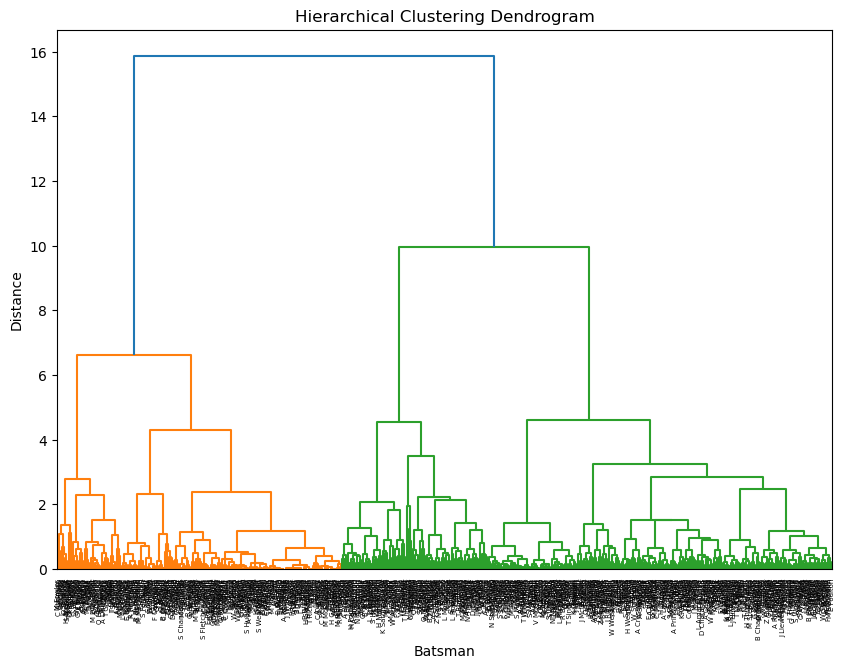

In [1356]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

df_bat_h = pd.DataFrame.from_dict(batsman_metrics, orient='index')

# Fill missing values with 0
df_bat_h = df_bat_h.fillna(0)

# Drop the 'scores' column if it exists
if 'scores' in df_bat_h.columns:
    df_bat_h = df_bat_h.drop(columns=['scores'])


# Step 2: Normalize the data if necessary (using Min-Max scaling here)
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(df_bat_h), columns=df_bat_h.columns, index=df_bat_h.index)

# Step 3: Calculate the distance matrix
from scipy.spatial.distance import pdist, squareform

distance_matrix = pdist(df_normalized, metric='euclidean')

# Step 4: Perform hierarchical clustering
Z = linkage(distance_matrix, method='ward')

# Step 5: Visualize the results using a dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z, labels=df_bat_h.index, leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Batsman')
plt.ylabel('Distance')
plt.show()


In [1357]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, fcluster



df_bat_h = pd.DataFrame.from_dict(batsman_metrics, orient='index')

# Fill missing values with 0
df_bat_h = df_bat_h.fillna(0)

# Drop the 'scores' column if it exists
if 'scores' in df_bat_h.columns:
    df_bat_h = df_bat_h.drop(columns=['scores'])


# Normalize the data
scaler = MinMaxScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(df_bat_h), columns=df_bat_h.columns, index=df_bat_h.index)

# Calculate the distance matrix
distance_matrix = pdist(df_normalized, metric='euclidean')

# Perform hierarchical clustering
Z = linkage(distance_matrix, method='ward')

# Define the threshold for forming clusters
threshold = 2  # Adjust this threshold based on the dendrogram

# Assign cluster labels to each player
cluster_labels = fcluster(Z, threshold, criterion='distance')

# Group and print the players by their cluster labels
clusters = {}
for player, cluster in zip(df_bat_h.index, cluster_labels):
    if cluster not in clusters:
        clusters[cluster] = []
    clusters[cluster].append(player)

for cluster, players in clusters.items():
    print(f"Cluster {cluster}: {', '.join(players)}")


Cluster 18: W Symonds, J Llewellyn-Dixon, A Davison, D Bell, W Sawyers, M Southam, A Gaughan, O Vasey, J Momand, K Wright, J Wood, B Langlands, F Lowry, J Gulliver, N Gulliver, C Cumiskey, D Barrass, L Gates, E Poulton, F Gilmore, S Renshaw, M Wilkinson, D Fletcher, G Armstrong, H Hobson, S Gregg, F Gibbons, K Ladd, J Morgan, C Andersen, A Hasan, P Marshall, K Elliott, A Gray, F Thompson, H Moat, R Khaksar, J Robertson, N Dodds, I Quinn, A Rickaby, J Winn, L West, O Hope, J Newey, E Elener, N Dobinson, L Ward, L Marriott, Z Cummings, N Mayes, O Jefferson, L McGann, Q Charlton, G Dixon, J Foster, G Reed, C Beck, R Morgan, A Rimmington, N Sheridan, A Alam, S Woodward, E Lawson, M Boustead, H Rostron, L Copping, I Burnham, L Sayers, J Huscroft, I Thompson
Cluster 13: L Graham, M McGough, E Lynch, N Jepson, C Brook, A Hawkins, J Wheatley, O Osborne, J Gustard, L Agnew, L Harding, J Bruce, A Peart, S Ramsey, J Renshaw, H Banks, H Wilds, J Hood, R Hart, J Clark, B McCann, A Samir, I Kahn, A 

In [1359]:
for cluster, players in clusters.items():
    if 'N Workman' in players:
        print(f"Cluster {cluster}: {', '.join(players)}")
        break

Cluster 10: J Harker, N Workman, F Wright, C McCarthy, C Bennett, R Curtis


bowler calculations

In [1361]:
bowler_metrics = {k: v for k, v in bowler_metrics.items() if pd.notna(k)}

In [1362]:
for key, metrics in bowler_metrics.items():
    if metrics['runs_conceded'] != 0:  # Avoid division by zero
        metrics['runs_conceded'] = (1 / metrics['runs_conceded'])*100
    else:
        metrics['runs_conceded'] = 100

# Display the updated dictionary
print(bowler_metrics)

{'K Massam': {'runs_conceded': 2.0408163265306123, 'wickets': 5, 'extras': 2, 'balls_bowled': 73, 'innings': 5, 'average': 9.8, 'strike_rate': 14.6, 'economy_rate': 4.027397260273973}, 'L Thompson': {'runs_conceded': 2.083333333333333, 'wickets': 7, 'extras': 11, 'balls_bowled': 81, 'innings': 5, 'average': 6.857142857142857, 'strike_rate': 11.571428571428571, 'economy_rate': 3.5555555555555554}, 'A Rowell': {'runs_conceded': 5.0, 'wickets': 3, 'extras': 2, 'balls_bowled': 51, 'innings': 3, 'average': 6.666666666666667, 'strike_rate': 17.0, 'economy_rate': 2.3529411764705883}, 'T Williamson': {'runs_conceded': 2.7777777777777777, 'wickets': 4, 'extras': 14, 'balls_bowled': 57, 'innings': 2, 'average': 9.0, 'strike_rate': 14.25, 'economy_rate': 3.789473684210526}, 'H Philpson': {'runs_conceded': 20.0, 'wickets': 1, 'extras': 5, 'balls_bowled': 9, 'innings': 0, 'average': 5.0, 'strike_rate': 9.0, 'economy_rate': 3.3333333333333335}, 'O Rowell': {'runs_conceded': 20.0, 'wickets': 2, 'extr

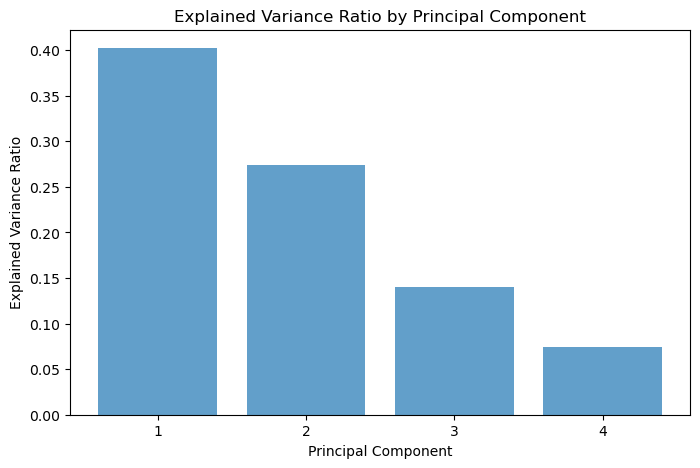

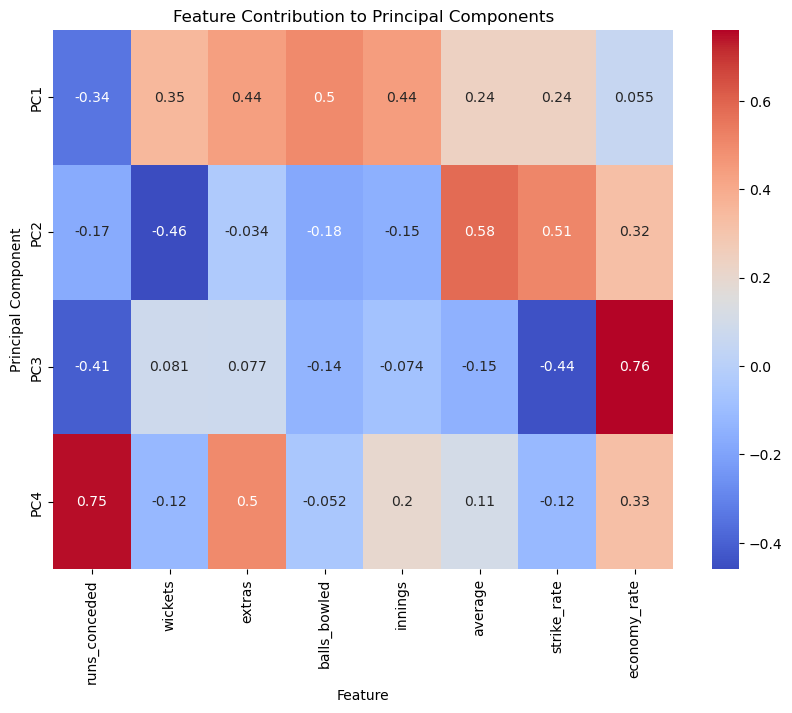

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known

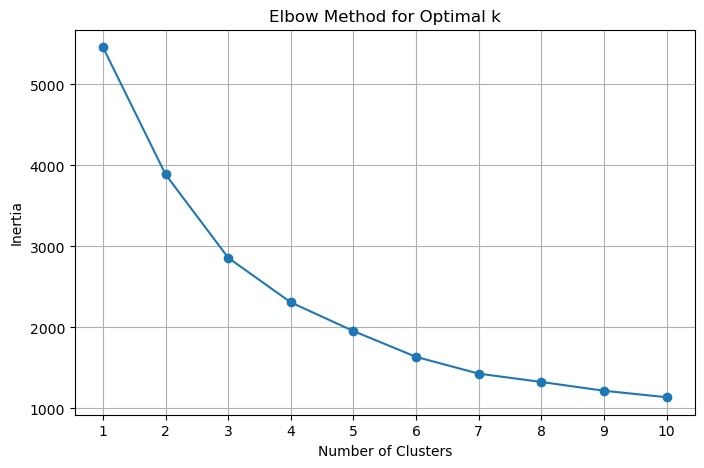

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known

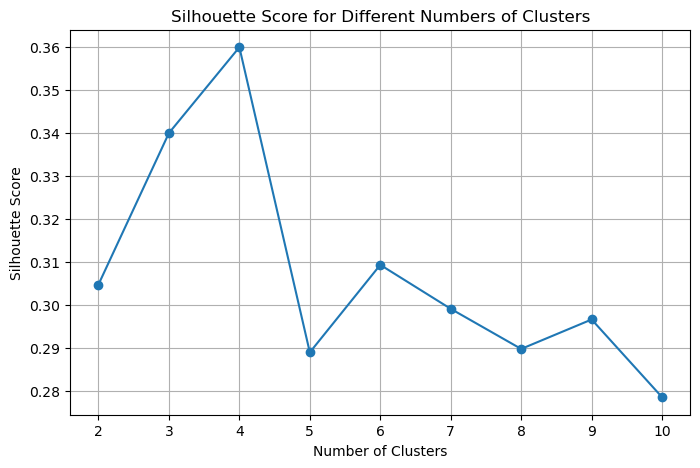

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dheer\AppData\Local\Temp\ipykernel_20088\7274131.py:113: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', optimal_k)


              runs_conceded  wickets  extras  balls_bowled  innings   average  \
K Massam           2.040816        5       2            73        5  9.800000   
L Thompson         2.083333        7      11            81        5  6.857143   
A Rowell           5.000000        3       2            51        3  6.666667   
T Williamson       2.777778        4      14            57        2  9.000000   
H Philpson        20.000000        1       5             9        0  5.000000   

              strike_rate  economy_rate  Cluster  
K Massam        14.600000      4.027397        1  
L Thompson      11.571429      3.555556        1  
A Rowell        17.000000      2.352941        0  
T Williamson    14.250000      3.789474        1  
H Philpson       9.000000      3.333333        0  


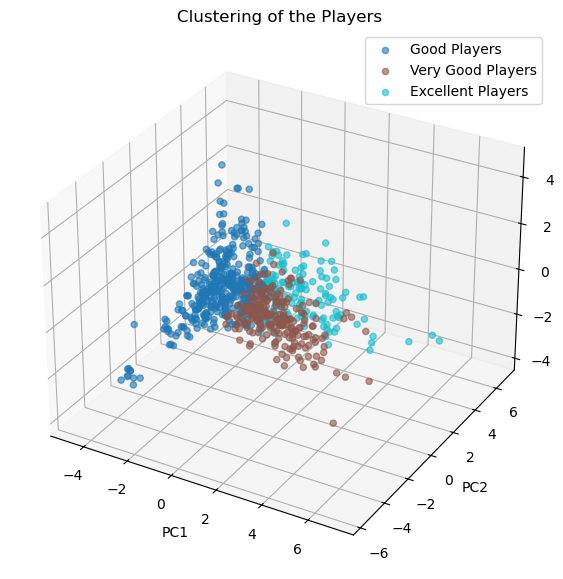

Silhouette Score for 3 clusters: 0.34


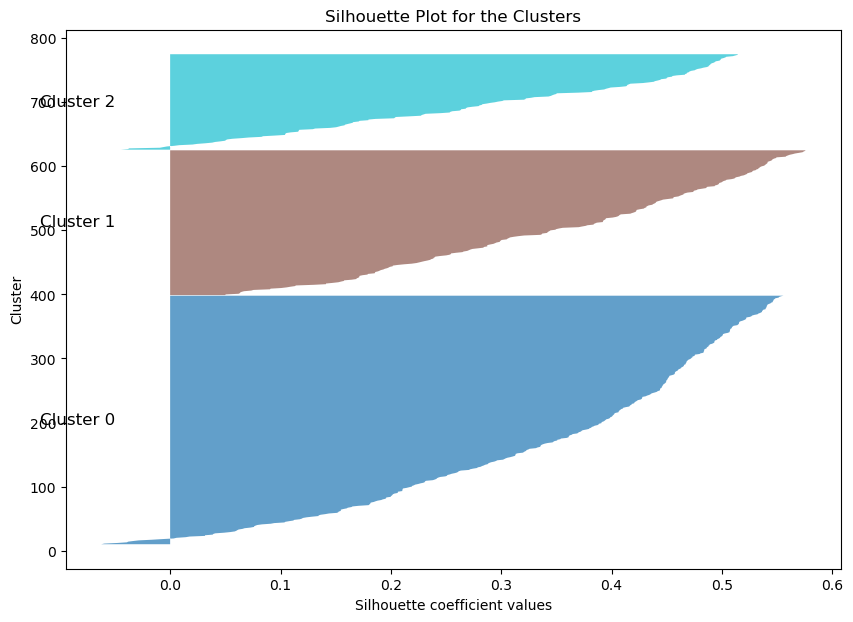

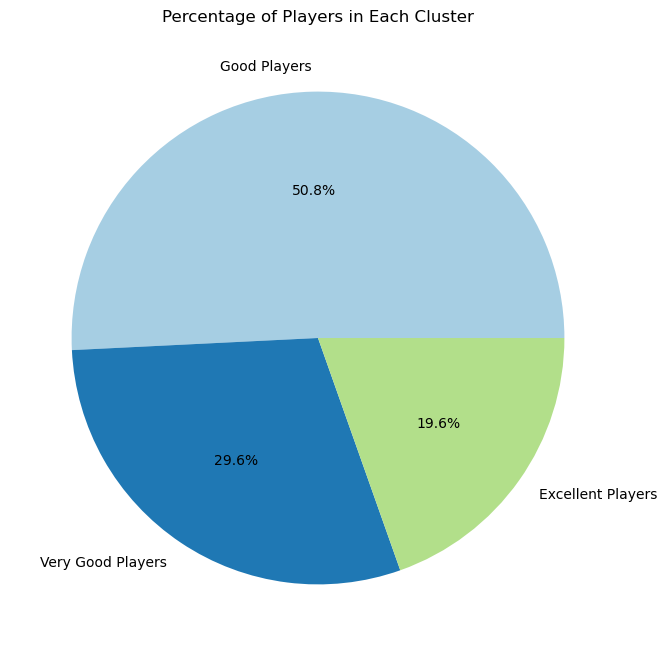

In [1365]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# Sample Data (assuming bowler_metrics is a dictionary and defined)
data = bowler_metrics
df_bowl = pd.DataFrame.from_dict(data, orient='index')
df_bowl = df_bowl.fillna(0)

# Features to use for clustering
features = ['runs_conceded', 'wickets', 'extras', 'balls_bowled', 'innings', 'average', 'strike_rate', 'economy_rate']

# Extract features
X = df_bowl[features]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X_scaled)

# Plot the explained variance ratio as a bar graph
plt.figure(figsize=(8, 5))
num_components = len(pca.explained_variance_ratio_)
plt.bar(range(1, num_components + 1), pca.explained_variance_ratio_, alpha=0.7, align='center')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.xticks(range(1, num_components + 1))
plt.show()

# Plot the contribution of each feature to each principal component
plt.figure(figsize=(10, 7))
num_components = pca.components_.shape[0]  # Number of principal components
num_features = pca.components_.shape[1]    # Number of features

# Ensure the number of row indices matches the number of principal components
pc_labels = [f'PC{i+1}' for i in range(num_components)]

# Create DataFrame for heatmap
heatmap_df = pd.DataFrame(pca.components_, columns=features, index=pc_labels)

# Plot heatmap
sns.heatmap(heatmap_df, annot=True, cmap='coolwarm')
plt.title('Feature Contribution to Principal Components')
plt.xlabel('Feature')
plt.ylabel('Principal Component')
plt.show()

# Step 1: Determine the optimal number of clusters using the Elbow method
inertia = []
K_range = range(1, 11)  # Trying 1 to 10 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)

# Plot the Elbow method result
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.xticks(K_range)
plt.grid(True)
plt.show()

# Step 2: Compute Silhouette Scores for a range of cluster numbers
silhouette_scores = []
K_range = range(2, 11)  # Silhouette score requires at least 2 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    clusters = kmeans.fit_predict(X_pca)
    silhouette_avg = silhouette_score(X_pca, clusters)
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(K_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different Numbers of Clusters')
plt.xticks(K_range)
plt.grid(True)
plt.show()

# Choose the optimal number of clusters based on silhouette score
optimal_k = 3  # Replace this with the optimal number of clusters from the Silhouette Score plot
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
clusters = kmeans.fit_predict(X_pca)

# Add the cluster number to the DataFrame
df_bowl['Cluster'] = clusters

# Display the DataFrame with the cluster column
print(df_bowl.head())

# 3D Scatter Plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Define colors for the clusters
colors = plt.cm.get_cmap('tab10', optimal_k)

# Define cluster names
cluster_names = {0: 'Good Players', 1: 'Very Good Players', 2: 'Excellent Players'}

for i in range(optimal_k):
    ax.scatter(X_pca[clusters == i, 0], X_pca[clusters == i, 1], X_pca[clusters == i, 2],
               color=colors(i), label=cluster_names[i], alpha=0.6)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('Clustering of the Players')
ax.legend()

# Save the 3D scatter plot
plt.savefig('clustering_of_the_players.png', bbox_inches='tight')

# Display the 3D scatter plot
plt.show()

# Step 4: Plot Silhouette Scores for Each Cluster
silhouette_avg = silhouette_score(X_pca, clusters)
print(f'Silhouette Score for {optimal_k} clusters: {silhouette_avg:.2f}')

# Compute silhouette scores for each sample
sample_silhouette_values = silhouette_samples(X_pca, clusters)

# Create a silhouette plot
fig, ax = plt.subplots(figsize=(10, 7))
y_lower = 10
for i in range(optimal_k):
    # Aggregate the silhouette scores for samples belonging to cluster i
    cluster_silhouette_values = sample_silhouette_values[clusters == i]
    cluster_silhouette_values.sort()
    
    # Compute the size of the cluster
    size_cluster_i = cluster_silhouette_values.shape[0]
    
    # Plot the silhouette scores for cluster i
    ax.fill_betweenx(np.arange(y_lower, y_lower + size_cluster_i),
                     0, cluster_silhouette_values,
                     facecolor=colors(i), alpha=0.7)
    
    # Add the cluster label
    ax.text(-0.05, y_lower + 0.5 * size_cluster_i, f'Cluster {i}',
            color='black', va='center', ha='right', fontsize=12)
    
    # Update y_lower for the next cluster
    y_lower += size_cluster_i

ax.set_xlabel('Silhouette coefficient values')
ax.set_ylabel('Cluster')
ax.set_title('Silhouette Plot for the Clusters')
plt.show()

# Pie Chart of Clusters
cluster_counts = df_bowl['Cluster'].value_counts()
cluster_labels = {0: 'Good Players', 1: 'Very Good Players', 2: 'Excellent Players'}
labels = [cluster_labels[i] for i in cluster_counts.index]

plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=labels, autopct='%1.1f%%', colors=plt.cm.Paired(range(optimal_k)))
plt.title('Percentage of Players in Each Cluster')
plt.savefig('percentage_of_players_in_each_cluster.png', bbox_inches='tight')
plt.show()


In [1366]:
df_bowl[df_bowl['Cluster']==1].max()

runs_conceded      7.142857
wickets           24.000000
extras            54.000000
balls_bowled     216.000000
innings           14.000000
average           36.000000
strike_rate       30.250000
economy_rate      10.181818
Cluster            1.000000
dtype: float64

In [1367]:
for i in range(3):
    print(df_bowl[(df_bowl['Cluster'] == i) ].mean())

runs_conceded    13.041624
wickets           1.383033
extras            3.401028
balls_bowled     20.411311
innings           1.455013
average          10.422237
strike_rate      12.426178
economy_rate      5.263369
Cluster           0.000000
dtype: float64
runs_conceded     1.687473
wickets           6.748899
extras           14.118943
balls_bowled     87.185022
innings           5.427313
average          12.126519
strike_rate      14.284337
economy_rate      5.076792
Cluster           1.000000
dtype: float64
runs_conceded     2.355578
wickets           1.120000
extras            9.840000
balls_bowled     52.066667
innings           3.500000
average          39.057778
strike_rate      39.652222
economy_rate      6.165640
Cluster           2.000000
dtype: float64


In [1368]:
cluster_low_medium = df_bowl[df_bowl['Cluster'].isin([2])].index.tolist()
cluster_low = df_bowl[df_bowl['Cluster'].isin([0])].index.tolist()
cluster_medium = df_bowl[df_bowl['Cluster'].isin([1])].index.tolist()


In [1369]:
df_bowl.loc['M Mullarky']

runs_conceded     2.941176
wickets           5.000000
extras            5.000000
balls_bowled     70.000000
innings           2.000000
average           6.800000
strike_rate      14.000000
economy_rate      2.914286
Cluster           0.000000
Name: M Mullarky, dtype: float64

In [1370]:
df_bowl.loc[df_bowl['Cluster'] == 1, 'rating'] = 3
df_bowl.loc[df_bowl['Cluster'] == 0, 'rating'] = 2
df_bowl.loc[df_bowl['Cluster'] == 2, 'rating'] = 1


In [1371]:
# Assuming df_bowl is your DataFrame and you want to classify based on the 'Cluster' column
df_bowl = df_bowl.dropna()
numeric_columns = df_bowl.select_dtypes(include=['float64', 'int64']).columns
numeric_columns = numeric_columns.drop('rating')  # Exclude the target variable if it's numeric

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on the numeric columns and transform them
df_bowl[numeric_columns] = scaler.fit_transform(df_bowl[numeric_columns])
# Define the feature matrix 'x' and target vector 'y'
y = df_bowl["rating"]
x = df_bowl[['runs_conceded', 'wickets', 'extras', 'balls_bowled', 
             'innings', 'average', 'strike_rate', 'economy_rate']]

# Initialize and train the RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Train the RandomForestClassifier
model = RandomForestClassifier(n_estimators=500, random_state=42)
model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = model.predict(x_test)

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F-measure (F1 Score): {f1:.4f}")

# Get feature importance
importances = model.feature_importances_

# Coefficients
features = [
    'runs_conceded',
    'wickets',
    'extras',
    'balls_bowled',
    'innings',
    'average',
    'strike_rate',
    'economy_rate'
]

# Create a dictionary of features and their importances
coefficients = dict(zip(features, importances))

# Compute the weighted score
df_bowl['weighted_score'] = (
    df_bowl['runs_conceded'] * coefficients['runs_conceded'] +
    df_bowl['wickets'] * coefficients['wickets'] +
    df_bowl['extras'] * coefficients['extras'] +
    df_bowl['balls_bowled'] * coefficients['balls_bowled'] +
    df_bowl['innings'] * coefficients['innings'] +
    df_bowl['average'] * coefficients['average'] +
    df_bowl['strike_rate'] * coefficients['strike_rate'] +
    df_bowl['economy_rate'] * coefficients['economy_rate']
)

# Sort the DataFrame by 'weighted_score' from max to min
sorted_df = df_bowl.sort_values(by='weighted_score', ascending=False)

# Print the sorted DataFrame
print(sorted_df)

# Display the top 10 records
print(sorted_df.head(20))


Accuracy: 0.9481
Precision: 0.9488
Recall: 0.9481
F-measure (F1 Score): 0.9482
             runs_conceded   wickets    extras  balls_bowled   innings  \
J Errington      -0.464989  6.440259  1.070672      4.487505  4.170951   
B Thompson       -0.506278 -0.281607  3.300726      2.820584  1.889116   
A Emmerson       -0.477204 -0.892685  1.726571      1.497631  0.748199   
F Wright         -0.494915  3.995944  6.055499      3.534979  3.030034   
J Willmott       -0.457722 -0.892685  1.464211      1.127204  2.269422   
...                    ...       ...       ...           ...       ...   
E Garside         0.656297 -0.892685 -0.765842     -1.068898 -1.153329   
I McGann          0.656297 -0.892685 -0.897022     -1.042439 -1.153329   
C Krzysiak        0.355211 -0.892685 -1.028202     -0.989521 -1.153329   
D Briggs          0.484247 -0.892685 -0.897022     -1.095357 -1.153329   
E Leo             0.355211 -0.892685 -0.897022     -1.068898 -1.153329   

              average  strike_ra

In [1372]:
sorted_df.head(10)

,runs_conceded,wickets,extras,balls_bowled,innings,average,strike_rate,economy_rate,Cluster,rating,weighted_score
J Errington,-0.464989,6.440259,1.070672,4.487505,4.170951,-0.915368,-0.682532,-1.278772,1,3.0,2.125895
B Thompson,-0.506278,-0.281607,3.300726,2.820584,1.889116,4.960890,4.266910,0.602981,2,1.0,2.045030
A Emmerson,-0.477204,-0.892685,1.726571,1.497631,0.748199,6.059918,6.210024,0.239971,2,1.0,1.931339
F Wright,-0.494915,3.995944,6.055499,3.534979,3.030034,-0.569706,-0.517551,-0.366829,1,3.0,1.771169
J Willmott,-0.457722,-0.892685,1.464211,1.127204,2.269422,4.500007,5.183473,0.003660,2,1.0,1.573460
R Scott,-0.494122,1.551629,1.857750,4.196456,3.030034,0.015261,0.536497,-0.630236,1,3.0,1.356696
S Lowther,-0.488817,2.773787,2.644828,3.323307,3.410339,-0.451531,-0.291465,-0.486395,1,3.0,1.350612
A Carter,-0.491594,0.023933,2.644828,3.032257,1.128505,1.852884,2.592654,-0.264784,2,1.0,1.318675
Z Charlton,-0.481139,-0.281607,1.464211,2.159108,1.508811,2.656475,3.350347,-0.138843,2,1.0,1.288568
D Lynn,-0.479228,-0.281607,2.644828,1.920976,1.128505,2.550117,3.020384,-0.039053,2,1.0,1.234186


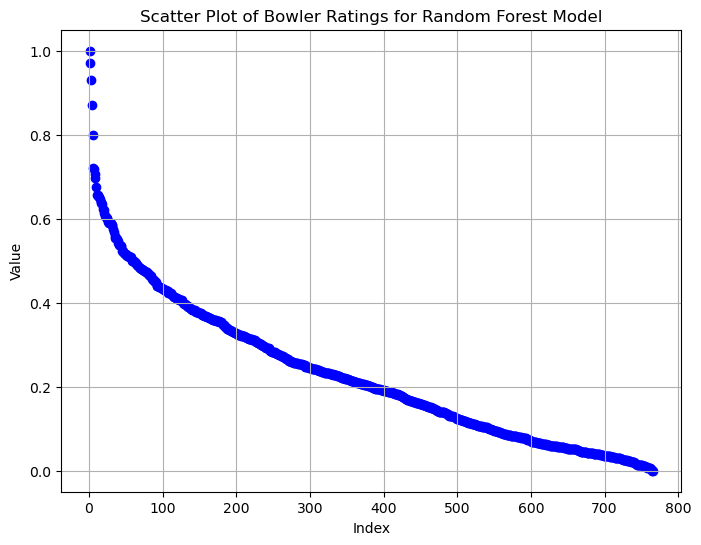

In [1373]:
df = sorted_df

min_score = df['weighted_score'].min()
max_score = df['weighted_score'].max()

df['normalized_score'] = (df['weighted_score'] - min_score) / (max_score - min_score)




# Extract float values
values = df['normalized_score']

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(range(1, len(values) + 1), values, color='blue', marker='o')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Bowler Ratings for Random Forest Model')
plt.grid(True)

# Save the plot as an image file

# Show the plot (optional, remove if not needed)
plt.show()

In [1379]:
coefficients

{'runs_conceded': 0.1730549010089944,
 'wickets': 0.20481483420084204,
 'extras': 0.06033629691267299,
 'balls_bowled': 0.17680834598669581,
 'innings': 0.07097991303907163,
 'average': 0.16044603208486488,
 'strike_rate': 0.1282302293821674,
 'economy_rate': 0.025329447384690836}

In [1380]:
# Assuming df_bowl is your DataFrame and you want to classify based on the 'Cluster' column
df_bowl = df_bowl.dropna()

# Define the feature matrix 'x' and target vector 'y'
y = df_bowl["rating"]
x = df_bowl[['runs_conceded', 'wickets', 'extras', 'balls_bowled', 
             'innings', 'average', 'strike_rate', 'economy_rate']]

# Initialize and train the RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Train the RandomForestClassifier
model = RandomForestClassifier(n_estimators=500, random_state=42)
model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = model.predict(x_test)

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F-measure (F1 Score): {f1:.4f}")

# Get feature importance
importances = model.feature_importances_

# Coefficients
features = [
    'runs_conceded',
    'wickets',
    'extras',
    'balls_bowled',
    'innings',
    'average',
    'strike_rate',
    'economy_rate'
]

# Create a dictionary of features and their importances
coefficients = dict(zip(features, importances))

# Compute the weighted score
df_bowl['weighted_score'] = (
    df_bowl['runs_conceded'] * coefficients['runs_conceded'] +
    df_bowl['wickets'] * coefficients['wickets'] +
    df_bowl['extras'] * coefficients['extras'] +
    df_bowl['balls_bowled'] * coefficients['balls_bowled'] +
    df_bowl['innings'] * coefficients['innings'] +
    df_bowl['average'] * coefficients['average'] +
    df_bowl['strike_rate'] * coefficients['strike_rate'] +
    df_bowl['economy_rate'] * coefficients['economy_rate']
)

# Sort the DataFrame by 'weighted_score' from max to min
sorted_df = df_bowl.sort_values(by='weighted_score', ascending=False)

# Print the sorted DataFrame
print(sorted_df)

# Display the top 10 records
print(sorted_df.head(10))


Accuracy: 0.9481
Precision: 0.9488
Recall: 0.9481
F-measure (F1 Score): 0.9482
             runs_conceded   wickets    extras  balls_bowled   innings  \
J Errington      -0.464989  6.440259  1.070672      4.487505  4.170951   
B Thompson       -0.506278 -0.281607  3.300726      2.820584  1.889116   
A Emmerson       -0.477204 -0.892685  1.726571      1.497631  0.748199   
F Wright         -0.494915  3.995944  6.055499      3.534979  3.030034   
J Willmott       -0.457722 -0.892685  1.464211      1.127204  2.269422   
...                    ...       ...       ...           ...       ...   
E Garside         0.656297 -0.892685 -0.765842     -1.068898 -1.153329   
I McGann          0.656297 -0.892685 -0.897022     -1.042439 -1.153329   
C Krzysiak        0.355211 -0.892685 -1.028202     -0.989521 -1.153329   
D Briggs          0.484247 -0.892685 -0.897022     -1.095357 -1.153329   
E Leo             0.355211 -0.892685 -0.897022     -1.068898 -1.153329   

              average  strike_ra

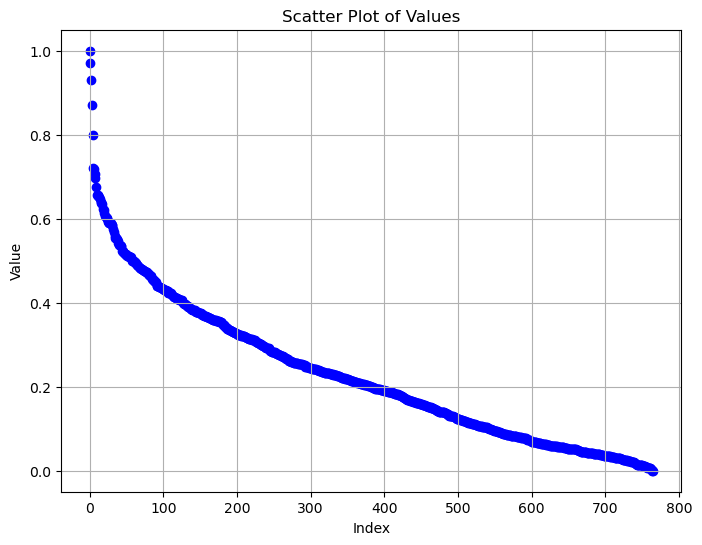

In [1381]:
df = sorted_df

min_score = df['weighted_score'].min()
max_score = df['weighted_score'].max()

df['normalized_score'] = (df['weighted_score'] - min_score) / (max_score - min_score)




# Extract float values
values = df['normalized_score']

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(range(len(values)), values, color='blue', marker='o')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Values')
plt.grid(True)

# Save the plot as an image file
plt.savefig('scatter_plot.png')

# Show the plot (optional, remove if not needed)
plt.show()

In [1382]:
df.head(10)

,runs_conceded,wickets,extras,balls_bowled,innings,average,strike_rate,economy_rate,Cluster,rating,weighted_score,normalized_score
J Errington,-0.464989,6.440259,1.070672,4.487505,4.170951,-0.915368,-0.682532,-1.278772,1,3.0,2.125895,1.000000
B Thompson,-0.506278,-0.281607,3.300726,2.820584,1.889116,4.960890,4.266910,0.602981,2,1.0,2.045030,0.970664
A Emmerson,-0.477204,-0.892685,1.726571,1.497631,0.748199,6.059918,6.210024,0.239971,2,1.0,1.931339,0.929420
F Wright,-0.494915,3.995944,6.055499,3.534979,3.030034,-0.569706,-0.517551,-0.366829,1,3.0,1.771169,0.871314
J Willmott,-0.457722,-0.892685,1.464211,1.127204,2.269422,4.500007,5.183473,0.003660,2,1.0,1.573460,0.799590
R Scott,-0.494122,1.551629,1.857750,4.196456,3.030034,0.015261,0.536497,-0.630236,1,3.0,1.356696,0.720953
S Lowther,-0.488817,2.773787,2.644828,3.323307,3.410339,-0.451531,-0.291465,-0.486395,1,3.0,1.350612,0.718746
A Carter,-0.491594,0.023933,2.644828,3.032257,1.128505,1.852884,2.592654,-0.264784,2,1.0,1.318675,0.707160
Z Charlton,-0.481139,-0.281607,1.464211,2.159108,1.508811,2.656475,3.350347,-0.138843,2,1.0,1.288568,0.696237
D Lynn,-0.479228,-0.281607,2.644828,1.920976,1.128505,2.550117,3.020384,-0.039053,2,1.0,1.234186,0.676509


In [1383]:
print(len(cluster_1_df))

246


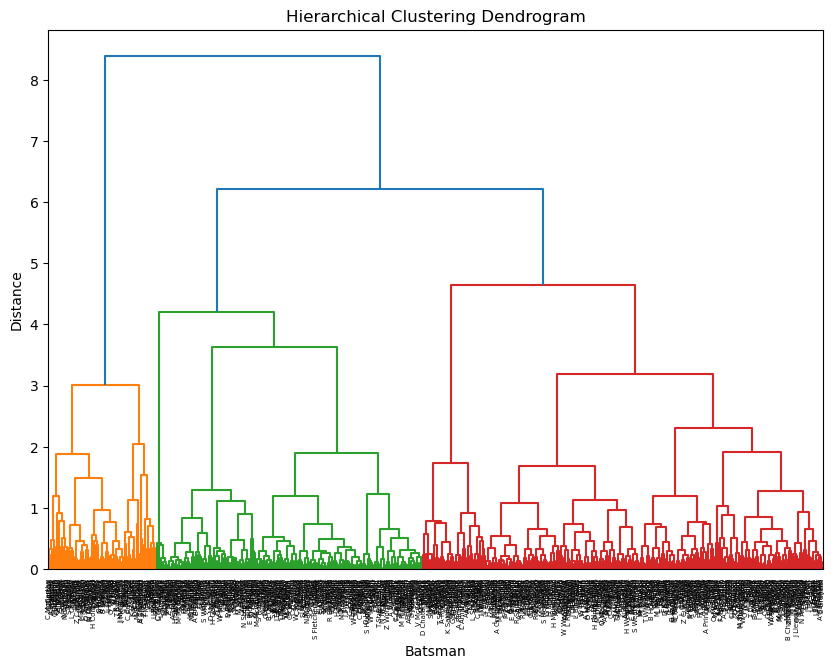

In [1384]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

df_bowler_h = pd.DataFrame.from_dict(bowler_metrics, orient='index')

# Fill missing values with 0
df_bowler_h = df_bowler_h.fillna(0)

# Drop the 'scores' column if it exists
if 'scores' in df_bowler_h.columns:
    df_bowler_h = df_bowler_h.drop(columns=['scores'])


# Step 2: Normalize the data if necessary (using Min-Max scaling here)
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(df_bowler_h), columns=df_bowler_h.columns, index=df_bowler_h.index)

# Step 3: Calculate the distance matrix
from scipy.spatial.distance import pdist, squareform

distance_matrix = pdist(df_normalized, metric='euclidean')

# Step 4: Perform hierarchical clustering
Z = linkage(distance_matrix, method='ward')

# Step 5: Visualize the results using a dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z, labels=df_bowler_h.index, leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Batsman')
plt.ylabel('Distance')
plt.show()


In [1385]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, fcluster



df_bowler_h = pd.DataFrame.from_dict(bowler_metrics, orient='index')

# Fill missing values with 0
df_bowler_h = df_bowler_h.fillna(0)

# Drop the 'scores' column if it exists
if 'scores' in df_bowler_h.columns:
    df_bowler_h = df_bowler_h.drop(columns=['scores'])


# Normalize the data
scaler = MinMaxScaler()
df_normalized = pd.DataFrame(scaler.fit_transform(df_bowler_h), columns=df_bowler_h.columns, index=df_bowler_h.index)

# Calculate the distance matrix
distance_matrix = pdist(df_normalized, metric='euclidean')

# Perform hierarchical clustering
Z = linkage(distance_matrix, method='ward')

# Define the threshold for forming clusters
threshold = 2  # Adjust this threshold based on the dendrogram

# Assign cluster labels to each player
cluster_labels = fcluster(Z, threshold, criterion='distance')

# Group and print the players by their cluster labels
clusters = {}
for player, cluster in zip(df_bowler_h.index, cluster_labels):
    if cluster not in clusters:
        clusters[cluster] = []
    clusters[cluster].append(player)

for cluster, players in clusters.items():
    print(f"Cluster {cluster}: {', '.join(players)}")


Cluster 10: K Massam, L Graham, J Llewellyn-Dixon, R Ribiero, D Carr, M McGough, A Storey, J Doherty, C Mccarten, M Swanston, J Benford, E Hind, O Pearson, J Johnson, Z McDermott, W Armstrong, H Reay, K Cockburn, R Sayer, W McGeorge, R Lesner, H Philipson, M Southam, E Chadwick, G Cave, C Brook, J Gray, J Strong, J Gulliver, H Scollen, E Poulton, T Turnbull, M King, J Blacklock, A Bethapudi, L McCaffrey, O McCaffery, H Hobson, J Hill, B Atkinson, H Pike, A Potts, S Brown, J Clark, A Gray, F Thompson, A Samir, M Davison, O Gibson, O Peart, C Burdis, I Quinn, T Smith, J Robertson, G Ovington, T Davidson, J Welch, D Walker, J Winn, S McKenna, E Elener, O Hope, A Snowdon, N Dodds, S Jackson, J Bushell, N Ellison, O Jefferson, M Stephenson, H Thushyanth, B O'Brien, A Sammons, G Jennings, F Harper, J Maxwell, J Foster, M Balmer, L Gowland, E Cowan, B Chapman-Dodd, M Dobbie, M Rachel, G Reed, N Armstrong, C Herkes, A Steele, J Lane, E Jackson, O McGilvray, N Whitfield, A Alam, B Kris, T Xu, A

In [1386]:
import pandas as pd
pdf=pd.read_excel("nope.xlsx")
pdf = pdf.drop_duplicates()


In [1387]:
pdf['bowler_rating'] = 0

# Assign ratings based on cluster membership
pdf.loc[pdf['bowler'].isin(cluster_medium), 'bowler_rating'] = 3
#pdf.loc[pdf['bowler'].isin(cluster_high), 'bowler_rating'] = 5
pdf.loc[pdf['bowler'].isin(cluster_low_medium), 'bowler_rating'] = 2
pdf.loc[pdf['bowler'].isin(cluster_low), 'bowler_rating'] = 1

In [1388]:
filtered_df = pdf[pdf['bowler_rating'] == 0]

filtered_df['bowler'].unique()

array([nan], dtype=object)

In [1389]:
pdf[pdf['batsman']=='J Harker']

,Over,Ball,Event,Commentary,innings,teamname,teamscore,teamtossinfo,full_match_result,R,B,4s,6s,SR,batting team,bowling team,bowler,batsman,bowler_rating
40329,Over 14,13.3,4 runs,to J Harker: 4 runs,1,Burnopfield CC,U n d e r 1 3 9 5 / 7 ( 2 0 . 0 ),NaN,WHICKHAM CC WON BY 6 WICKETS WICKETS,NaN,NaN,NaN,NaN,NaN,Burnopfield CC,Whickham CC,NaN,J Harker,0
40330,Over 14,13.2,2 byes,to J Harker: 2 b,1,Burnopfield CC,U n d e r 1 3 9 5 / 7 ( 2 0 . 0 ),NaN,WHICKHAM CC WON BY 6 WICKETS WICKETS,NaN,NaN,NaN,NaN,NaN,Burnopfield CC,Whickham CC,NaN,J Harker,0
40332,Over 14,13.1,1 run,to J Harker: 1 run,1,Burnopfield CC,U n d e r 1 3 9 5 / 7 ( 2 0 . 0 ),NaN,WHICKHAM CC WON BY 6 WICKETS WICKETS,NaN,NaN,NaN,NaN,NaN,Burnopfield CC,Whickham CC,NaN,J Harker,0
40336,Over 13,12.3,1 run,to J Harker: 1 run,1,Burnopfield CC,U n d e r 1 3 9 5 / 7 ( 2 0 . 0 ),NaN,WHICKHAM CC WON BY 6 WICKETS WICKETS,NaN,NaN,NaN,NaN,NaN,Burnopfield CC,Whickham CC,NaN,J Harker,0
40338,Over 13,12.1,1 run,to J Harker: 1 run,1,Burnopfield CC,U n d e r 1 3 9 5 / 7 ( 2 0 . 0 ),NaN,WHICKHAM CC WON BY 6 WICKETS WICKETS,NaN,NaN,NaN,NaN,NaN,Burnopfield CC,Whickham CC,NaN,J Harker,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44738,Over 2,1.4,0 runs,O Gray to J Harker: No run,1,Burnopfield CC,U n d e r 1 3 1 3 9 / 3 ( 2 0 . 0 ),NaN,BURNOPFIELD CC WON BY 63 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Burnopfield CC,Consett CC,O Gray,J Harker,3
44741,Over 2,1.1,1 run,O Gray to J Harker: 1 run,1,Burnopfield CC,U n d e r 1 3 1 3 9 / 3 ( 2 0 . 0 ),NaN,BURNOPFIELD CC WON BY 63 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Burnopfield CC,Consett CC,O Gray,J Harker,3
44745,Over 1,0.3,1 leg bye,W Symonds to J Harker: 1 lb,1,Burnopfield CC,U n d e r 1 3 1 3 9 / 3 ( 2 0 . 0 ),NaN,BURNOPFIELD CC WON BY 63 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Burnopfield CC,Consett CC,W Symonds,J Harker,2
44746,Over 1,0.2,4 runs,W Symonds to J Harker: 4 runs,1,Burnopfield CC,U n d e r 1 3 1 3 9 / 3 ( 2 0 . 0 ),NaN,BURNOPFIELD CC WON BY 63 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Burnopfield CC,Consett CC,W Symonds,J Harker,2


In [1390]:
print(bowler_metrics['M Mullarky'])

{'runs_conceded': 2.941176470588235, 'wickets': 5, 'extras': 5, 'balls_bowled': 70, 'innings': 2, 'average': 6.8, 'strike_rate': 14.0, 'economy_rate': 2.9142857142857146}


In [1391]:
print(len(bowler_metrics))

766


In [1392]:
bat_rating3=pdf[pdf['bowler_rating']==3]
bat_rating2=pdf[pdf['bowler_rating']==2]
bat_rating1=pdf[pdf['bowler_rating']==1]
bat_rating0 = pdf[pdf['bowler'].isna()]
import pandas as pd
from decimal import Decimal

# Function to process events and calculate metrics for batsmen and bowlers
def calculate_metrics(df):
    # Initialize dictionaries to hold metrics
    batsman_metrics = {}
    bowler_metrics = {}

    # Define scoring rules
    runs_scored = {
        '0 runs': 0, '1 run': 1, '2 runs': 2, '3 runs': 3, '4 runs': 4, '6 runs': 6,
        '1 run \n 1 no ball': 1, '2 runs \n 1 no ball': 2, '3 runs \n 1 no ball': 3, 
        '4 runs \n 1 no ball': 4, '6 runs \n 1 no ball': 6, '5 runs': 5,
        '1 run \n 2 no balls': 1, '4 runs \n 2 no balls': 4,
    }
    
    dismissals = [
        'Wicket!', 'Wicket! \n 2 wides', 'Wicket! \n 1 run \n 1 no ball', 
        'Wicket! \n 1 run', 'Wicket! \n 2 runs', 'Wicket! \n 1 bye', 
        'Wicket! \n 1 no ball', 'Wicket! \n 1 wide', 'Wicket! \n 1 leg bye'
    ]

    extras = {
        '1 wide': 1, '2 wides': 2, '3 wides': 3, '4 wides': 4, '5 wides': 5, '6 wides': 6,
        '1 no ball': 1, '2 no balls': 2, '1 bye': 1, '2 byes': 2, '3 byes': 3, 
        '4 byes': 4, '5 byes': 5, '1 leg bye': 1, '2 leg byes': 2, '3 leg byes': 3, 
        '4 leg byes': 4, '2 1nb + byes': 2, '3 1nb + byes': 3, '6 1nb + byes': 6, 
        '5 1nb + byes': 5, '4 1nb + byes': 4, '2 1nb + leg byes': 2
    }

    previous_bowling_team = None

    for _, row in df.iterrows():
        event = row['Event']
        bowler = row['bowler']
        batsman = row['batsman']
        bowling_team = row['bowling team']
        over = int(row['Over'][5:])

        # Initialize batsman and bowler if not already in the dictionary
        if batsman not in batsman_metrics:
            batsman_metrics[batsman] = {'runs': 0, 'boundaries': 0, 'dismissal': 0, 'balls_faced': 0, 'innings': 0, 'scores': []}
        

        # Handle change in batting team (new match or new innings)
        if previous_bowling_team is not None and previous_bowling_team != bowling_team:
            # Save the scores for all batsmen
            for b in batsman_metrics:
                if batsman_metrics[b]['runs'] > 0:
                    batsman_metrics[b]['scores'].append(batsman_metrics[b]['runs'])
                    batsman_metrics[b]['runs'] = 0

        # Calculate metrics for batsmen
        if event in runs_scored:
            runs = runs_scored[event]
            batsman_metrics[batsman]['runs'] += runs
            batsman_metrics[batsman]['balls_faced'] += 1
            if runs >= 4:
                batsman_metrics[batsman]['boundaries'] += 1

        if event in dismissals:
            batsman_metrics[batsman]['balls_faced'] += 1
            batsman_metrics[batsman]['dismissal'] += 1
            batsman_metrics[batsman]['scores'].append(batsman_metrics[batsman]['runs'])
            batsman_metrics[batsman]['runs'] = 0  # Reset runs for the next innings

        

        previous_bowling_team = bowling_team

    # Ensure last innings runs are recorded
    for batsman in batsman_metrics:
        if batsman_metrics[batsman]['runs'] > 0:
            batsman_metrics[batsman]['scores'].append(batsman_metrics[batsman]['runs'])

    # Calculate additional metrics for batsmen
    for batsman in batsman_metrics:
        runs = sum(batsman_metrics[batsman]['scores'])
        dismissal = batsman_metrics[batsman]['dismissal']
        balls_faced = batsman_metrics[batsman]['balls_faced']

        average = runs / dismissal if dismissal > 0 else runs
        strike_rate = (runs / balls_faced * 100) if balls_faced > 0 else Decimal('0')
        highest_score = max(batsman_metrics[batsman]['scores']) if batsman_metrics[batsman]['scores'] else runs

        batsman_metrics[batsman]['average'] = average
        batsman_metrics[batsman]['strike_rate'] = strike_rate
        batsman_metrics[batsman]['highest_score'] = highest_score
        batsman_metrics[batsman]['runs'] = runs
        batsman_metrics[batsman]['innings'] = len(batsman_metrics[batsman]['scores'])

    

    return batsman_metrics



# Calculate metrics
rat3 = calculate_metrics(bat_rating3)
rat2 = calculate_metrics(bat_rating2)
rat1 = calculate_metrics(bat_rating1)
rat0 = calculate_metrics(bat_rating0)
ran = calculate_metrics(pdf)
# Print results
print("Batsman Metrics:", rat3)


Batsman Metrics: {'S Perrin': {'runs': 6, 'boundaries': 0, 'dismissal': 1, 'balls_faced': 21, 'innings': 4, 'scores': [3, 2, 0, 1], 'average': 6.0, 'strike_rate': 28.57142857142857, 'highest_score': 3}, "H O'Keefe": {'runs': 60, 'boundaries': 7, 'dismissal': 0, 'balls_faced': 57, 'innings': 4, 'scores': [20, 24, 1, 15], 'average': 60, 'strike_rate': 105.26315789473684, 'highest_score': 24}, 'A Blenkiron': {'runs': 32, 'boundaries': 5, 'dismissal': 1, 'balls_faced': 21, 'innings': 4, 'scores': [3, 0, 2, 27], 'average': 32.0, 'strike_rate': 152.38095238095238, 'highest_score': 27}, 'A Murray': {'runs': 0, 'boundaries': 0, 'dismissal': 0, 'balls_faced': 1, 'innings': 0, 'scores': [], 'average': 0, 'strike_rate': 0.0, 'highest_score': 0}, 'A Doherty': {'runs': 19, 'boundaries': 3, 'dismissal': 1, 'balls_faced': 13, 'innings': 3, 'scores': [0, 6, 13], 'average': 19.0, 'strike_rate': 146.15384615384613, 'highest_score': 13}, 'T Jacobs': {'runs': 17, 'boundaries': 1, 'dismissal': 1, 'balls_fa

In [1393]:
import math
rat3 = {k: v for k, v in rat3.items() if not (isinstance(k, float) and math.isnan(k))}
rat2 = {k: v for k, v in rat2.items() if not (isinstance(k, float) and math.isnan(k))}
rat1 = {k: v for k, v in rat1.items() if not (isinstance(k, float) and math.isnan(k))}
rat0 = {k: v for k, v in rat0.items() if not (isinstance(k, float) and math.isnan(k))}
ran = {k: v for k, v in ran.items() if not (isinstance(k, float) and math.isnan(k))}


In [1394]:
from decimal import Decimal

# Example data (assuming decimal.Decimal values might be present)
data = rat3

# Convert Decimal to float for normalization
def convert_to_float(value):
    if isinstance(value, Decimal):
        return float(value)
    return value

# Prepare for normalization
metrics = ['runs', 'boundaries', 'dismissal', 'balls_faced', 'innings', 'average', 'strike_rate', 'highest_score']
values = {metric: [] for metric in metrics}

# Collect values for each metric
for player, stats in data.items():
    for metric in metrics:
        values[metric].append(convert_to_float(stats.get(metric, Decimal('0'))))

# Normalize values using Min-Max Scaling
normalized_data3 = {}

for player, stats in data.items():
    normalized_data3[player] = {}
    for metric in metrics:
        min_val = min(values[metric])
        max_val = max(values[metric])
        value = convert_to_float(stats.get(metric, Decimal('0')))
        
        if max_val > min_val:  # Avoid division by zero
            normalized_data3[player][metric] = (value - min_val) / (max_val - min_val)
        else:
            normalized_data3[player][metric] = 0  # In case all values are the same

# Optionally include scores separately (if normalization needed, apply similarly)
for player in normalized_data3:
    normalized_data3[player]['scores'] = data[player]['scores']

print(normalized_data3)
from decimal import Decimal

# Example data (assuming decimal.Decimal values might be present)
data = rat2

# Convert Decimal to float for normalization
def convert_to_float(value):
    if isinstance(value, Decimal):
        return float(value)
    return value

# Prepare for normalization
metrics = ['runs', 'boundaries', 'dismissal', 'balls_faced', 'innings', 'average', 'strike_rate', 'highest_score']
values = {metric: [] for metric in metrics}

# Collect values for each metric
for player, stats in data.items():
    for metric in metrics:
        values[metric].append(convert_to_float(stats.get(metric, Decimal('0'))))

# Normalize values using Min-Max Scaling
normalized_data2 = {}

for player, stats in data.items():
    normalized_data2[player] = {}
    for metric in metrics:
        min_val = min(values[metric])
        max_val = max(values[metric])
        value = convert_to_float(stats.get(metric, Decimal('0')))
        
        if max_val > min_val:  # Avoid division by zero
            normalized_data2[player][metric] = (value - min_val) / (max_val - min_val)
        else:
            normalized_data2[player][metric] = 0  # In case all values are the same

# Optionally include scores separately (if normalization needed, apply similarly)
for player in normalized_data2:
    normalized_data2[player]['scores'] = data[player]['scores']

print(normalized_data2)
from decimal import Decimal

# Example data (assuming decimal.Decimal values might be present)
data = rat1

# Convert Decimal to float for normalization
def convert_to_float(value):
    if isinstance(value, Decimal):
        return float(value)
    return value

# Prepare for normalization
metrics = ['runs', 'boundaries', 'dismissal', 'balls_faced', 'innings', 'average', 'strike_rate', 'highest_score']
values = {metric: [] for metric in metrics}

# Collect values for each metric
for player, stats in data.items():
    for metric in metrics:
        values[metric].append(convert_to_float(stats.get(metric, Decimal('0'))))

# Normalize values using Min-Max Scaling
normalized_data1 = {}

for player, stats in data.items():
    normalized_data1[player] = {}
    for metric in metrics:
        min_val = min(values[metric])
        max_val = max(values[metric])
        value = convert_to_float(stats.get(metric, Decimal('0')))
        
        if max_val > min_val:  # Avoid division by zero
            normalized_data1[player][metric] = (value - min_val) / (max_val - min_val)
        else:
            normalized_data1[player][metric] = 0  # In case all values are the same

# Optionally include scores separately (if normalization needed, apply similarly)
for player in normalized_data1:
    normalized_data1[player]['scores'] = data[player]['scores']

print(normalized_data1)
from decimal import Decimal

# Example data (assuming decimal.Decimal values might be present)
data = rat0

# Convert Decimal to float for normalization
def convert_to_float(value):
    if isinstance(value, Decimal):
        return float(value)
    return value

# Prepare for normalization
metrics = ['runs', 'boundaries', 'dismissal', 'balls_faced', 'innings', 'average', 'strike_rate', 'highest_score']
values = {metric: [] for metric in metrics}

# Collect values for each metric
for player, stats in data.items():
    for metric in metrics:
        values[metric].append(convert_to_float(stats.get(metric, Decimal('0'))))

# Normalize values using Min-Max Scaling
normalized_data0 = {}

for player, stats in data.items():
    normalized_data0[player] = {}
    for metric in metrics:
        min_val = min(values[metric])
        max_val = max(values[metric])
        value = convert_to_float(stats.get(metric, Decimal('0')))
        
        if max_val > min_val:  # Avoid division by zero
            normalized_data0[player][metric] = (value - min_val) / (max_val - min_val)
        else:
            normalized_data0[player][metric] = 0  # In case all values are the same

# Optionally include scores separately (if normalization needed, apply similarly)
for player in normalized_data0:
    normalized_data0[player]['scores'] = data[player]['scores']

print(normalized_data0)


{'S Perrin': {'runs': 0.03260869565217391, 'boundaries': 0.0, 'dismissal': 0.08333333333333333, 'balls_faced': 0.10194174757281553, 'innings': 0.17391304347826086, 'average': 0.05217391304347826, 'strike_rate': 0.09523809523809523, 'highest_score': 0.075, 'scores': [3, 2, 0, 1]}, "H O'Keefe": {'runs': 0.32608695652173914, 'boundaries': 0.2413793103448276, 'dismissal': 0.0, 'balls_faced': 0.2766990291262136, 'innings': 0.17391304347826086, 'average': 0.5217391304347826, 'strike_rate': 0.3508771929824561, 'highest_score': 0.6, 'scores': [20, 24, 1, 15]}, 'A Blenkiron': {'runs': 0.17391304347826086, 'boundaries': 0.1724137931034483, 'dismissal': 0.08333333333333333, 'balls_faced': 0.10194174757281553, 'innings': 0.17391304347826086, 'average': 0.2782608695652174, 'strike_rate': 0.5079365079365079, 'highest_score': 0.675, 'scores': [3, 0, 2, 27]}, 'A Murray': {'runs': 0.0, 'boundaries': 0.0, 'dismissal': 0.0, 'balls_faced': 0.0048543689320388345, 'innings': 0.0, 'average': 0.0, 'strike_rat

In [1396]:
players=[]
for i in ran.keys():
    players.append(i)
key_final={}

In [1397]:
for i in players:
    key_final[i]={}
    if i in rat0:
        key_final[i][0]=normalized_data0[i]
    if i in rat1:
        key_final[i][1]=normalized_data1[i]
    if i in rat2:
        key_final[i][2]=normalized_data2[i]
    if i in rat3:
        key_final[i][3]=normalized_data3[i]

In [1398]:
key_final

{'J Bett': {1: {'runs': 0.08235294117647059,
   'boundaries': 0.0,
   'dismissal': 0.0,
   'balls_faced': 0.2524271844660194,
   'innings': 0.16666666666666666,
   'average': 0.08235294117647059,
   'strike_rate': 0.09849906191369606,
   'highest_score': 0.11764705882352941,
   'scores': [4, 3]},
  2: {'runs': 0.031914893617021274,
   'boundaries': 0.0,
   'dismissal': 0.0,
   'balls_faced': 0.1111111111111111,
   'innings': 0.2222222222222222,
   'average': 0.031914893617021274,
   'strike_rate': 0.09302325581395346,
   'highest_score': 0.0625,
   'scores': [2, 1]},
  3: {'runs': 0.0,
   'boundaries': 0.0,
   'dismissal': 0.0,
   'balls_faced': 0.03398058252427184,
   'innings': 0.0,
   'average': 0.0,
   'strike_rate': 0.0,
   'highest_score': 0.0,
   'scores': []}},
 'R Harvey': {1: {'runs': 0.15294117647058825,
   'boundaries': 0.0,
   'dismissal': 0.16666666666666666,
   'balls_faced': 0.32038834951456313,
   'innings': 0.25,
   'average': 0.15294117647058825,
   'strike_rate': 0.

In [1399]:
for player_name in key_final.keys():
    key_final[player_name]['average_runs'] = 0# Initialize runs average to 0
    key_final[player_name]['average_balls_faced'] = 0# Initialize balls faced average to 0
    key_final[player_name]['average_boundaries'] = 0# Initialize total boundaries to 0
    key_final[player_name]['average_strike_rate'] = 0

In [1400]:
columns_to_normalize = ['R', 'B', '4s', '6s', 'SR']
df = averages

# Apply Min-Max Scaling
for column in columns_to_normalize:
    min_val = df[column].min()
    max_val = df[column].max()
    df[column + '_norm'] = (df[column] - min_val) / (max_val - min_val)

# Drop the original columns if you only need the normalized data
df_normalized_a = df.drop(columns=columns_to_normalize)

print(df_normalized_a)

         batsman    R_norm    B_norm   4s_norm   6s_norm   SR_norm
0        - Jacob  0.000000  0.000000  0.000000  0.000000  0.000000
1         A Alam  0.179487  0.197279  0.125000  0.000000  0.197031
2         A Alan  0.230769  0.142857  0.250000  0.000000  0.400000
3          A Ali  0.211538  0.295918  0.125000  0.000000  0.186000
4    A Armstrong  0.057692  0.051020  0.000000  0.000000  0.160000
..           ...       ...       ...       ...       ...       ...
673   Z Cummings  0.230769  0.221088  0.166667  0.041667  0.152853
674    Z Elliott  0.038462  0.326531  0.000000  0.000000  0.031360
675      Z Malik  0.134615  0.163265  0.125000  0.000000  0.197387
676  Z McDermott  0.115385  0.173469  0.000000  0.000000  0.162960
677       Z Nash  0.269231  0.551020  0.250000  0.000000  0.133333

[678 rows x 6 columns]


In [1401]:
for index, row in df_normalized_a.iterrows():
    player_name = row['batsman']
    if player_name in key_final:
        key_final[player_name]['average_runs'] = row['R_norm']  # Set runs average
        key_final[player_name]['average_balls_faced'] = row['B_norm']  # Set balls faced average
        key_final[player_name]['average_boundaries'] = row['4s_norm'] + row['6s_norm']  # Set total boundaries
        key_final[player_name]['average_strike_rate'] = row['SR_norm']  # Set strike rate

# Print the updated dictionary
print(key_final)

{'J Bett': {1: {'runs': 0.08235294117647059, 'boundaries': 0.0, 'dismissal': 0.0, 'balls_faced': 0.2524271844660194, 'innings': 0.16666666666666666, 'average': 0.08235294117647059, 'strike_rate': 0.09849906191369606, 'highest_score': 0.11764705882352941, 'scores': [4, 3]}, 2: {'runs': 0.031914893617021274, 'boundaries': 0.0, 'dismissal': 0.0, 'balls_faced': 0.1111111111111111, 'innings': 0.2222222222222222, 'average': 0.031914893617021274, 'strike_rate': 0.09302325581395346, 'highest_score': 0.0625, 'scores': [2, 1]}, 3: {'runs': 0.0, 'boundaries': 0.0, 'dismissal': 0.0, 'balls_faced': 0.03398058252427184, 'innings': 0.0, 'average': 0.0, 'strike_rate': 0.0, 'highest_score': 0.0, 'scores': []}, 'average_runs': 0, 'average_balls_faced': 0, 'average_boundaries': 0, 'average_strike_rate': 0}, 'R Harvey': {1: {'runs': 0.15294117647058825, 'boundaries': 0.0, 'dismissal': 0.16666666666666666, 'balls_faced': 0.32038834951456313, 'innings': 0.25, 'average': 0.15294117647058825, 'strike_rate': 0

In [1402]:
default_stats = {
    'runs': 0.0,
    'boundaries': 0.0,
    'dismissal': 0.0,
    'balls_faced': 0.0,
    'innings': 0,
    'average': 0.0,
    'strike_rate': 0.0,
    'highest_score': 0.0,
    'scores':0.0
}

# Extract statistics with default values
stats = []
for player, details in key_final.items():
    for key in [0, 1, 2, 3]:
        stats_dict = details.get(key, default_stats.copy())
        stats_dict['player'] = player
        stats_dict['key'] = key
        stats.append(stats_dict)

# Sorting by the highest value among the numeric statistics
sorted_stats = sorted(stats, key=lambda x: max(v for v in x.values() if isinstance(v, (int, float))), reverse=True)

# Preparing the ordered dictionary
ordered_data = {}
for stat in sorted_stats:
    player = stat.pop('player')
    key = stat.pop('key')
    if player not in ordered_data:
        ordered_data[player] = {}
    ordered_data[player][key] = stat

ordered_data

{'J Bett': {3: {'runs': 0.0,
   'boundaries': 0.0,
   'dismissal': 0.0,
   'balls_faced': 0.03398058252427184,
   'innings': 0.0,
   'average': 0.0,
   'strike_rate': 0.0,
   'highest_score': 0.0,
   'scores': []},
  2: {'runs': 0.031914893617021274,
   'boundaries': 0.0,
   'dismissal': 0.0,
   'balls_faced': 0.1111111111111111,
   'innings': 0.2222222222222222,
   'average': 0.031914893617021274,
   'strike_rate': 0.09302325581395346,
   'highest_score': 0.0625,
   'scores': [2, 1]},
  1: {'runs': 0.08235294117647059,
   'boundaries': 0.0,
   'dismissal': 0.0,
   'balls_faced': 0.2524271844660194,
   'innings': 0.16666666666666666,
   'average': 0.08235294117647059,
   'strike_rate': 0.09849906191369606,
   'highest_score': 0.11764705882352941,
   'scores': [4, 3]},
  0: {'runs': 0.0,
   'boundaries': 0.0,
   'dismissal': 0.0,
   'balls_faced': 0.0,
   'innings': 0,
   'average': 0.0,
   'strike_rate': 0.0,
   'highest_score': 0.0,
   'scores': 0.0}},
 'R Harvey': {3: {'runs': 0.0054

In [1403]:
import numpy as np
import decimal

def ahp(matrix_dict):
    def calculate_priority_vector_and_consistency(matrix):
        n = matrix.shape[0]
        
        # Normalize the matrix
        column_sums = np.sum(matrix, axis=0)
        normalized_matrix = matrix / column_sums
        
        # Calculate the Priority Vector
        priority_vector = np.mean(normalized_matrix, axis=1)
        
        # Compute the Weighted Sum Vector using the original matrix
        weighted_sum_vector = np.dot(matrix, priority_vector)
        
        # Compute Lambda Max
        lambda_max = np.mean(weighted_sum_vector / priority_vector)
        
        # Calculate Consistency Index (CI)
        CI = (lambda_max - n) / (n - 1)
        
        # Random Index (RI) for consistency ratio calculation
        RI_dict = {1: 0, 2: 0, 3: 0.58, 4: 0.90, 5: 1.12, 6: 1.24, 7: 1.32, 8: 1.41, 9: 1.45, 10: 1.49}
        RI = RI_dict.get(n, 1.49)
        
        # Calculate Consistency Ratio (CR)
        CR = CI / RI if RI != 0 else 0
        
        return priority_vector, CI, CR

    results = {}
    for key, matrix in matrix_dict.items():
        priority_vector, CI, CR = calculate_priority_vector_and_consistency(matrix)
        if CR > 0.1:
            raise ValueError(f"The consistency ratio for {key} is too high: {CR:.2f}")
        results[key] = {'priority_vector': priority_vector, 'CI': CI, 'CR': CR}
    
    return results

def calculate_weighted_score(weights, metrics):
    # Convert metrics values to float if they are decimal.Decimal
    metrics = {k: float(v) if isinstance(v, decimal.Decimal) else v for k, v in metrics.items()}
    
    return sum(weights.get(key, 0) * metrics.get(key, 0) for key in weights)

def calculate_batsman_rating(bowler_rating, scoring_metrics, consistency_metrics, efficiency_metrics, results):
    # Calculate weighted scores for each level
    scoring_ability_score = calculate_weighted_score(
        dict(zip(['runs', 'boundaries', 'highest_score'], results['Scoring Ability']['priority_vector'])),
        scoring_metrics
    )
    
    consistency_score = calculate_weighted_score(
        dict(zip(['average', 'average_runs', 'dismissals', 'innings'], results['Consistency']['priority_vector'])),
        consistency_metrics
    )
    
    efficiency_score = calculate_weighted_score(
        dict(zip(['strike_rate', 'average_strike_rate', 'balls_faced', 'average_balls_faced', 'average_boundaries'], results['Efficiency']['priority_vector'])),
        efficiency_metrics
    )
    
    # Calculate Level 2 weighted score
    level_2_weights = dict(zip(['scoring_ability', 'consistency', 'efficiency'], results['Level 2']['priority_vector']))
    level_2_score = (
        level_2_weights['scoring_ability'] * scoring_ability_score +
        level_2_weights['consistency'] * consistency_score +
        level_2_weights['efficiency'] * efficiency_score
    )
    
    # Multiply level 2 score by bowler rating priority vector
    bowler_rating_weight = results['Bowler Rating']['priority_vector'][bowler_rating - 1]  # Adjust index for 0-based array
    overall_rating = bowler_rating_weight * level_2_score
    
    return overall_rating

# Define matrices
bowler_rating_matrix = np.array([
    [1, 1.5, 1.75, 2],
    [0.667, 1, 1.5, 1.75],
    [0.571, 0.667, 1, 1.5],
    [0.5, 0.571, 0.667, 1]
])

level_2_matrix = np.array([
    [1, 1.25, 1.5],
    [0.8, 1, 1.25],
    [0.667, 0.8, 1]
])

scoring_ability_matrix = np.array([
    [1, 3, 5],
    [0.33, 1, 3],
    [0.2, 0.33, 1]
])

consistency_matrix = np.array([
    [1, 3, 5, 7],
    [0.33, 1, 3, 5],
    [0.2, 0.33, 1, 3],
    [0.14, 0.2, 0.33, 1]
])

efficiency_matrix = np.array([
    [1, 3, 5, 7, 9],
    [0.33, 1, 3, 5, 7],
    [0.2, 0.33, 1, 3, 5],
    [0.14, 0.2, 0.33, 1, 3],
    [0.11, 0.14, 0.2, 0.33, 1]
])

# Creating dictionary of matrices
matrix_dict = {
    'Bowler Rating': bowler_rating_matrix,
    'Level 2': level_2_matrix,
    'Scoring Ability': scoring_ability_matrix,
    'Consistency': consistency_matrix,
    'Efficiency': efficiency_matrix
}

# Calculate AHP results
results = ahp(matrix_dict)


# Calculate and print the batsman ratings
final_ratings = {}
for batsman, metrics_by_bowler in key_final.items():
    final_rating = 0
    print(f"\nBatsman: {batsman}")
    
    # Default values for metrics
    default_metrics = {
        'average_runs': metrics_by_bowler.get('average_runs', 0),
        'average_balls_faced': metrics_by_bowler.get('average_balls_faced', 0),
        'average_boundaries': metrics_by_bowler.get('average_boundaries', 0),
        'average_strike_rate': metrics_by_bowler.get('average_strike_rate', 0)
    }
    
    for bowler_rating, metrics in metrics_by_bowler.items():
        if isinstance(bowler_rating, int):  # Skip non-metric entries
            scoring_metrics = {
                'runs': metrics.get('runs', 0),
                'boundaries': metrics.get('boundaries', 0),
                'highest_score': metrics.get('highest_score', 0)
            }
            consistency_metrics = {
                'average': metrics.get('average', default_metrics['average_runs']),
                'average_runs': default_metrics['average_runs'],
                'dismissals': metrics.get('dismissal', 0),
                'innings': metrics.get('innings', 0)
            }
            efficiency_metrics = {
                'strike_rate': metrics.get('strike_rate', 0),
                'average_strike_rate': default_metrics['average_strike_rate'],
                'balls_faced': metrics.get('balls_faced', 0),
                'average_balls_faced': default_metrics['average_balls_faced'],
                'average_boundaries': default_metrics['average_boundaries']
            }
            overall_rating = calculate_batsman_rating(bowler_rating, scoring_metrics, consistency_metrics, efficiency_metrics, results)
            final_rating += overall_rating
            print(f"  Bowler Rating {bowler_rating}: Overall Batsman Rating = {overall_rating}")
    final_ratings[batsman] = final_rating
    print(f"  Final Rating: {final_rating}")

print("\nFinal Batsman Ratings:")
for batsman, rating in final_ratings.items():
    print(f"{batsman}: {rating}")



Batsman: J Bett
  Bowler Rating 1: Overall Batsman Rating = 0.024035529601649355
  Bowler Rating 2: Overall Batsman Rating = 0.010226002425849456
  Bowler Rating 3: Overall Batsman Rating = 0.00025247938752959837
  Final Rating: 0.03451401141502841

Batsman: R Harvey
  Bowler Rating 1: Overall Batsman Rating = 0.047920047216042275
  Bowler Rating 2: Overall Batsman Rating = 0.0422573401520682
  Bowler Rating 3: Overall Batsman Rating = 0.0057197294571747215
  Final Rating: 0.0958971168252852

Batsman: M Kavanagh
  Bowler Rating 0: Overall Batsman Rating = 0.00961065163161055
  Bowler Rating 1: Overall Batsman Rating = 0.10615045823233399
  Bowler Rating 2: Overall Batsman Rating = 0.10182020569721482
  Bowler Rating 3: Overall Batsman Rating = 0.027590702719947898
  Final Rating: 0.24517201828110727

Batsman: S Robertson
  Bowler Rating 1: Overall Batsman Rating = 0.07574090420108041
  Bowler Rating 2: Overall Batsman Rating = 0.05169311402027205
  Final Rating: 0.12743401822135247

B

In [1404]:
sorted_ratings = sorted(final_ratings.items(), key=lambda x: x[1], reverse=True)
ahpb  =[]
# Print the sorted values
for name, value in sorted_ratings:
    print(f"{name}: {value}")
    ahpb.append(name)

N Workman: 0.6515356407221202
F Wright: 0.629461095552311
C McCarthy: 0.5947374664871131
J Mellons: 0.44651967935566284
J Harker: 0.4385335050053264
J Errington: 0.41473952311220513
J Soppitt: 0.4005357765034795
H Keegan: 0.3670542223458385
R Curtis: 0.36545337147463747
L Agnew: 0.36378398246818155
A Hawkins: 0.35865080799995736
C Bennett: 0.35803195217406275
J Winlow: 0.35700275871614384
E Lynch: 0.35565060005419996
E Jackson: 0.3552288365797102
L Robertson: 0.3551053190636261
C Brook: 0.34770994376786585
A Azhar: 0.34635144481728236
W Curry: 0.338078350856007
M Stokoe: 0.337274229954389
A Peart: 0.3343232134780097
N Jepson: 0.33345396884045025
O Pattison: 0.33270516637097647
T Burnham: 0.33115905577895743
L Harding: 0.33049400950732455
S Lowther: 0.3213314777767839
I Coy: 0.3213299050971192
C Tudball: 0.3153276602197933
A Samir: 0.3132863938547902
S Ramsey: 0.31038313414090263
T Davison: 0.30846643186897593
F Lawler: 0.30510637576038036
H Forbes-Hunt: 0.30389514198854684
W Lawton: 0.

In [1405]:
ahpb

['N Workman',
 'F Wright',
 'C McCarthy',
 'J Mellons',
 'J Harker',
 'J Errington',
 'J Soppitt',
 'H Keegan',
 'R Curtis',
 'L Agnew',
 'A Hawkins',
 'C Bennett',
 'J Winlow',
 'E Lynch',
 'E Jackson',
 'L Robertson',
 'C Brook',
 'A Azhar',
 'W Curry',
 'M Stokoe',
 'A Peart',
 'N Jepson',
 'O Pattison',
 'T Burnham',
 'L Harding',
 'S Lowther',
 'I Coy',
 'C Tudball',
 'A Samir',
 'S Ramsey',
 'T Davison',
 'F Lawler',
 'H Forbes-Hunt',
 'W Lawton',
 'M McGough',
 'J Hood',
 'L Graham',
 'N Thursfield',
 'W Brookes',
 'O McGilvray',
 'A Blenkiron',
 'J Clark',
 'I Lathan',
 'L McCaffrey',
 'H Collingwood',
 'D Lynn',
 'J Bruce',
 'N Stokoe',
 'W Dixon',
 'L Heslop',
 'L Morris',
 'T McKie',
 'J Brooks',
 'T Martindale',
 'B McCann',
 'M Harvey',
 'G Temple',
 'A Grey',
 'O Osborne',
 'M Kavanagh',
 'N Whitfield',
 'I Kahn',
 'H Banks',
 'H Simpson',
 'H Wilds',
 'L Brennan',
 'A Tipton',
 'B Pratt',
 'N Shaw',
 'C Herkes',
 'C Robinson',
 "H O'Keefe",
 'J Gray',
 'R Sayer',
 'J Eng

In [1406]:
nr_bats=sorted_ratings

In [1407]:
values = [value for name, value in nr_bats]

# Compute min and max values
min_value = min(values)
max_value = max(values)

# Normalize values
normalized_data = [(name, (value - min_value) / (max_value - min_value)) for name, value in nr_bats]

# Output the normalized data
for name, normalized_value in normalized_data:
    print(f'{name}: {normalized_value:.4f}')

N Workman: 1.0000
F Wright: 0.9661
C McCarthy: 0.9128
J Mellons: 0.6853
J Harker: 0.6731
J Errington: 0.6366
J Soppitt: 0.6148
H Keegan: 0.5634
R Curtis: 0.5609
L Agnew: 0.5583
A Hawkins: 0.5505
C Bennett: 0.5495
J Winlow: 0.5479
E Lynch: 0.5459
E Jackson: 0.5452
L Robertson: 0.5450
C Brook: 0.5337
A Azhar: 0.5316
W Curry: 0.5189
M Stokoe: 0.5177
A Peart: 0.5131
N Jepson: 0.5118
O Pattison: 0.5106
T Burnham: 0.5083
L Harding: 0.5073
S Lowther: 0.4932
I Coy: 0.4932
C Tudball: 0.4840
A Samir: 0.4808
S Ramsey: 0.4764
T Davison: 0.4734
F Lawler: 0.4683
H Forbes-Hunt: 0.4664
W Lawton: 0.4514
M McGough: 0.4434
J Hood: 0.4371
L Graham: 0.4371
N Thursfield: 0.4301
W Brookes: 0.4296
O McGilvray: 0.4275
A Blenkiron: 0.4223
J Clark: 0.4183
I Lathan: 0.4148
L McCaffrey: 0.4137
H Collingwood: 0.4062
D Lynn: 0.4049
J Bruce: 0.4011
N Stokoe: 0.3988
W Dixon: 0.3977
L Heslop: 0.3959
L Morris: 0.3957
T McKie: 0.3956
J Brooks: 0.3948
T Martindale: 0.3937
B McCann: 0.3884
M Harvey: 0.3851
G Temple: 0.3837

In [1408]:
normalized_data

[('N Workman', 1.0),
 ('F Wright', 0.9661192054737893),
 ('C McCarthy', 0.9128241485422721),
 ('J Mellons', 0.6853342341499064),
 ('J Harker', 0.6730767706265217),
 ('J Errington', 0.636556923658903),
 ('J Soppitt', 0.6147565098043621),
 ('H Keegan', 0.563367833475724),
 ('R Curtis', 0.5609107908043103),
 ('L Agnew', 0.5583485533730538),
 ('A Hawkins', 0.5504699752149428),
 ('C Bennett', 0.5495201333533237),
 ('J Winlow', 0.547940490746546),
 ('E Lynch', 0.5458651496946808),
 ('E Jackson', 0.5452178121614305),
 ('L Robertson', 0.5450282330987299),
 ('C Brook', 0.5336775489096598),
 ('A Azhar', 0.531592476558011),
 ('W Curry', 0.5188946386437168),
 ('M Stokoe', 0.5176604453757525),
 ('A Peart', 0.5131311206666566),
 ('N Jepson', 0.511796973179965),
 ('O Pattison', 0.5106476846028368),
 ('T Burnham', 0.508274659252596),
 ('L Harding', 0.5072539226572874),
 ('S Lowther', 0.4931909441218607),
 ('I Coy', 0.4931885303173557),
 ('C Tudball', 0.48397607208456683),
 ('A Samir', 0.48084306409940

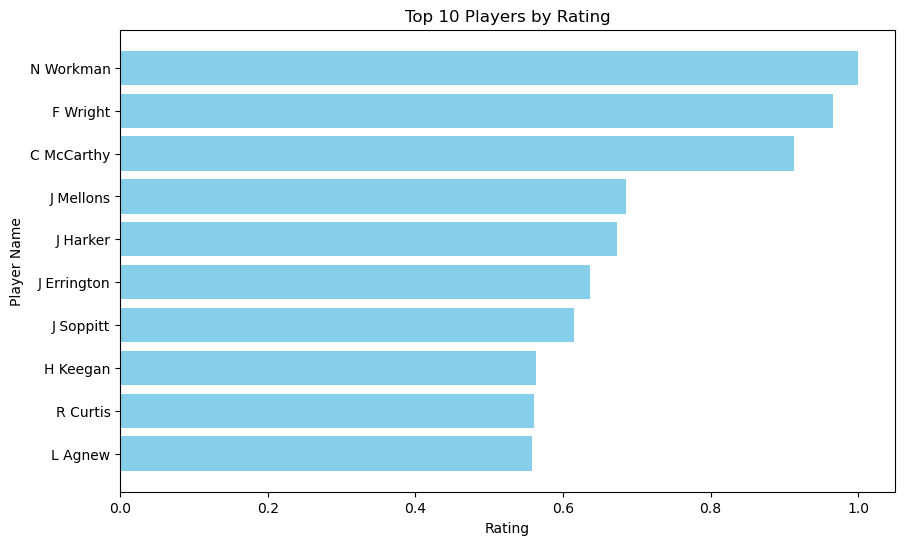

In [1409]:
import matplotlib.pyplot as plt

# Data for top players
data = [
    ('N Workman', 1.0),
    ('F Wright', 0.9661192054737893),
    ('C McCarthy', 0.9128241485422721),
    ('J Mellons', 0.6853342341499064),
    ('J Harker', 0.6730767706265217),
    ('J Errington', 0.636556923658903),
    ('J Soppitt', 0.6147565098043621),
    ('H Keegan', 0.563367833475724),
    ('R Curtis', 0.5609107908043103),
    ('L Agnew', 0.5583485533730538)
]

# Sort data by rating and get top 10
top_10 = sorted(data, key=lambda x: x[1], reverse=True)[:10]

# Separate names and ratings for plotting
names, ratings = zip(*top_10)

# Create the plot
plt.figure(figsize=(10, 6))
plt.barh(names, ratings, color='skyblue')
plt.xlabel('Rating')
plt.ylabel('Player Name')
plt.title('Top 10 Players by Rating')
plt.gca().invert_yaxis()  # Highest ratings at the top

# Save the plot as a PNG file
plt.savefig('top_10_players_by_rating.png', bbox_inches='tight')

# Display the plot
plt.show()


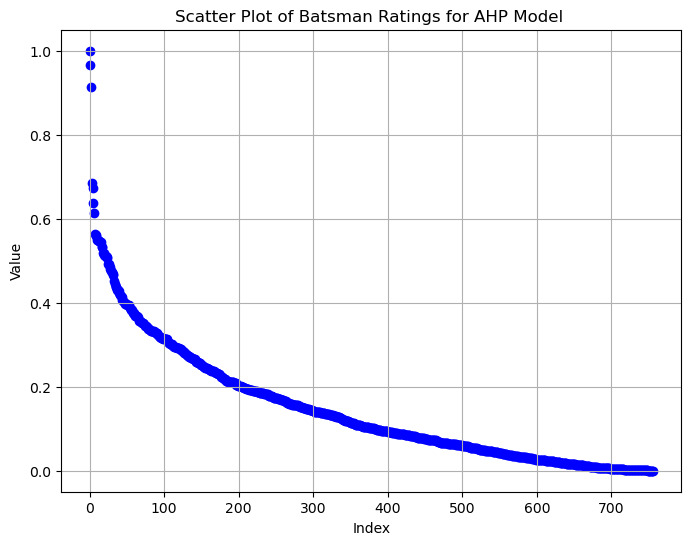

In [1410]:
# Extract float values
values = [x[1] for x in normalized_data]

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(range(len(values)), values, color='blue', marker='o')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Batsman Ratings for AHP Model ')
plt.grid(True)

# Save the plot as an image file
plt.savefig('scatter_plot.png')

# Show the plot (optional, remove if not needed)
plt.show()

In [1412]:
rating_dict = dict(normalized_data)
player_stats=batsman_metrics
def update_player_ratings(stats_dict, ratings_dict):
    for player, stats in stats_dict.items():
        if player in ratings_dict:
            stats['rating'] = ratings_dict[player]
        else:
            stats['rating'] = None  # Handle missing ratings

# Update player stats with ratings
update_player_ratings(player_stats, rating_dict)

# Print updated player stats
for player, stats in player_stats.items():
    print(f"Player: {player}")
    print(f"Stats: {stats}\n")


Player: W Symonds
Stats: {'runs': 37, 'boundaries': 5, 'dismissal': 2.5, 'balls_faced': 102, 'innings': 6, 'scores': [3, 5, 1, 16, 12, 0], 'average': 9.25, 'strike_rate': 36.27450980392157, 'highest_score': 16, 'average_runs': 3.25, 'average_balls_faced': 15.5, 'average_boundaries': 0.25, 'average_strike_rate': 18.125, 'rating': 0.17257759104382345}

Player: J Llewellyn-Dixon
Stats: {'runs': 26, 'boundaries': 2, 'dismissal': 1.4285714285714284, 'balls_faced': 45, 'innings': 7, 'scores': [1, 4, 7, 5, 5, 4, 0], 'average': 3.7142857142857144, 'strike_rate': 57.77777777777777, 'highest_score': 7, 'average_runs': 3.7142857142857144, 'average_balls_faced': 8.571428571428571, 'average_boundaries': 0.2857142857142857, 'average_strike_rate': 40.44285714285714, 'rating': 0.1391344224204579}

Player: L Graham
Stats: {'runs': 96, 'boundaries': 14, 'dismissal': 2.0, 'balls_faced': 139, 'innings': 6, 'scores': [9, 19, 11, 10, 15, 32], 'average': 19.2, 'strike_rate': 69.06474820143885, 'highest_score

In [1413]:
dfB = pd.DataFrame(player_stats).T


In [1414]:
dfB

,runs,boundaries,dismissal,balls_faced,innings,scores,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,rating
W Symonds,37,5,2.5,102,6,"[3, 5, 1, 16, 12, 0]",9.25,36.27451,16,3.25,15.5,0.25,18.125,0.172578
J Llewellyn-Dixon,26,2,1.428571,45,7,"[1, 4, 7, 5, 5, 4, 0]",3.714286,57.777778,7,3.714286,8.571429,0.285714,40.442857,0.139134
L Graham,96,14,2.0,139,6,"[9, 19, 11, 10, 15, 32]",19.2,69.064748,32,15.0,26.4,2.4,57.814,0.437077
O Gray,17,1,2.5,44,4,"[1, 2, 14, 0]",4.25,38.636364,14,5.0,13.5,0.25,23.9575,0.159072
A Davison,42,4,1.666667,111,7,"[9, 2, 3, 10, 9, 9, 0]",7.0,37.837838,10,5.333333,16.833333,0.333333,27.848333,0.211337
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A Daughtery,11,1,10.0,14,1,[11],11.0,78.571429,11,11.0,17.0,1.0,64.71,0.110829
A Routledge,0,0,10.0,1,1,[0],0.0,0.0,0,0.0,1.0,0.0,0.0,0.004739
E Gaines,0,0,10.0,4,1,[0],0.0,0.0,0,0.0,4.0,0.0,0.0,0.005925
R Donnelly,0,0,10.0,12,1,[0],0.0,0.0,0,0.0,12.0,0.0,0.0,0.010405


In [1415]:
dfB['Rating Class'] = pd.cut(dfB['rating'], bins=np.linspace(0, 1, 9), labels=range(1, 9))



In [1416]:
dfB

,runs,boundaries,dismissal,balls_faced,innings,scores,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,rating,Rating Class
W Symonds,37,5,2.5,102,6,"[3, 5, 1, 16, 12, 0]",9.25,36.27451,16,3.25,15.5,0.25,18.125,0.172578,2
J Llewellyn-Dixon,26,2,1.428571,45,7,"[1, 4, 7, 5, 5, 4, 0]",3.714286,57.777778,7,3.714286,8.571429,0.285714,40.442857,0.139134,2
L Graham,96,14,2.0,139,6,"[9, 19, 11, 10, 15, 32]",19.2,69.064748,32,15.0,26.4,2.4,57.814,0.437077,4
O Gray,17,1,2.5,44,4,"[1, 2, 14, 0]",4.25,38.636364,14,5.0,13.5,0.25,23.9575,0.159072,2
A Davison,42,4,1.666667,111,7,"[9, 2, 3, 10, 9, 9, 0]",7.0,37.837838,10,5.333333,16.833333,0.333333,27.848333,0.211337,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A Daughtery,11,1,10.0,14,1,[11],11.0,78.571429,11,11.0,17.0,1.0,64.71,0.110829,1
A Routledge,0,0,10.0,1,1,[0],0.0,0.0,0,0.0,1.0,0.0,0.0,0.004739,1
E Gaines,0,0,10.0,4,1,[0],0.0,0.0,0,0.0,4.0,0.0,0.0,0.005925,1
R Donnelly,0,0,10.0,12,1,[0],0.0,0.0,0,0.0,12.0,0.0,0.0,0.010405,1


In [1417]:
dfB=dfB.dropna()

In [1418]:
dfB

,runs,boundaries,dismissal,balls_faced,innings,scores,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,rating,Rating Class
W Symonds,37,5,2.5,102,6,"[3, 5, 1, 16, 12, 0]",9.25,36.27451,16,3.25,15.5,0.25,18.125,0.172578,2
J Llewellyn-Dixon,26,2,1.428571,45,7,"[1, 4, 7, 5, 5, 4, 0]",3.714286,57.777778,7,3.714286,8.571429,0.285714,40.442857,0.139134,2
L Graham,96,14,2.0,139,6,"[9, 19, 11, 10, 15, 32]",19.2,69.064748,32,15.0,26.4,2.4,57.814,0.437077,4
O Gray,17,1,2.5,44,4,"[1, 2, 14, 0]",4.25,38.636364,14,5.0,13.5,0.25,23.9575,0.159072,2
A Davison,42,4,1.666667,111,7,"[9, 2, 3, 10, 9, 9, 0]",7.0,37.837838,10,5.333333,16.833333,0.333333,27.848333,0.211337,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A Daughtery,11,1,10.0,14,1,[11],11.0,78.571429,11,11.0,17.0,1.0,64.71,0.110829,1
A Routledge,0,0,10.0,1,1,[0],0.0,0.0,0,0.0,1.0,0.0,0.0,0.004739,1
E Gaines,0,0,10.0,4,1,[0],0.0,0.0,0,0.0,4.0,0.0,0.0,0.005925,1
R Donnelly,0,0,10.0,12,1,[0],0.0,0.0,0,0.0,12.0,0.0,0.0,0.010405,1


In [1419]:
# Assuming `combined_df` is your DataFrame
y=dfB["Rating Class"]
x = dfB[['runs', 'boundaries', 'dismissal', 'balls_faced', 
                 'innings', 'average', 'strike_rate', 'highest_score', 
                 'average_runs', 'average_balls_faced', 
                 'average_boundaries', 'average_strike_rate']]
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators=500)
model.fit(x, y)

# Get feature importance
importances = model.feature_importances_

In [1420]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
x = dfB[['runs', 'boundaries', 'dismissal', 'balls_faced', 
         'innings', 'average', 'strike_rate', 'highest_score', 
         'average_runs', 'average_balls_faced', 
         'average_boundaries', 'average_strike_rate']]
y = dfB["Rating Class"]

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Initialize and train the RandomForestClassifier
model = RandomForestClassifier(n_estimators=500, random_state=42)
model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = model.predict(x_test)

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F-measure (F1 Score): {f1:.4f}")

Accuracy: 0.8382
Precision: 0.8472
Recall: 0.8382
F-measure (F1 Score): 0.8361


C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [1421]:
importances

array([0.21644552, 0.13320955, 0.0191448 , 0.0840925 , 0.03102824,
       0.10988136, 0.07187738, 0.12434954, 0.06818212, 0.04577642,
       0.03472487, 0.06128771])

In [1422]:
# Coefficients
features = [
    'runs',
    'boundaries',
    'dismissal',
    'balls_faced',
    'innings',
    'average',
    'strike_rate',
    'highest_score',
    'average_runs',
    'average_balls_faced',
    'average_boundaries',
    'average_strike_rate'
]

# Create a dictionary of features and their importances
coefficients = dict(zip(features, importances))
# Compute the weighted score
dfB['weighted_score'] = (
    dfB['runs'] * coefficients['runs'] +
    dfB['boundaries'] * coefficients['boundaries'] +
    dfB['dismissal'] * coefficients['dismissal'] +
    dfB['balls_faced'] * coefficients['balls_faced'] +
    dfB['innings'] * coefficients['innings'] +
    dfB['average'] * coefficients['average'] +
    dfB['strike_rate'] * coefficients['strike_rate'] +
    dfB['highest_score'] * coefficients['highest_score'] +
    dfB['average_runs'] * coefficients['average_runs'] +
    dfB['average_balls_faced'] * coefficients['average_balls_faced'] +
    dfB['average_boundaries'] * coefficients['average_boundaries'] +
    dfB['average_strike_rate'] * coefficients['average_strike_rate']
)

# Sort the DataFrame by 'weighted_score' from max to min
sorted_df = dfB.sort_values(by='weighted_score', ascending=False)

# Print the sorted DataFrame
print(sorted_df)

            runs boundaries dismissal balls_faced innings  \
F Wright     314         49  1.428571         303      15   
N Workman    287         48       2.5         168      12   
C McCarthy   286         44  3.333333         164      13   
C Bennett    251         43       5.0         170       9   
J Harker     187         30      10.0         120       7   
...          ...        ...       ...         ...     ...   
R Ingram       0          0      10.0           1       1   
A Routledge    0          0      10.0           1       1   
B Thirwell     0          0      10.0           1       1   
C Dye          0          0      10.0           1       1   
J Wrightson    0          0      10.0           1       1   

                                                        scores    average  \
F Wright     [31, 30, 21, 30, 12, 21, 32, 8, 53, 20, 4, 30,...  44.857143   
N Workman        [35, 31, 26, 22, 9, 30, 32, 30, 30, 6, 6, 30]      71.75   
C McCarthy   [34, 34, 16, 24, 6, 30,

C:\Users\dheer\AppData\Local\Temp\ipykernel_20088\292815037.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfB['weighted_score'] = (


In [1423]:
sorted_df.head(10)

,runs,boundaries,dismissal,balls_faced,innings,scores,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,rating,Rating Class,weighted_score
F Wright,314,49,1.428571,303,15,"[31, 30, 21, 30, 12, 21, 32, 8, 53, 20, 4, 30,...",44.857143,103.630363,53,13.428571,15.285714,1.714286,79.808571,0.966119,8,125.998256
N Workman,287,48,2.5,168,12,"[35, 31, 26, 22, 9, 30, 32, 30, 30, 6, 6, 30]",71.75,170.833333,35,15.75,11.75,2.5,161.805,1.0,8,119.192148
C McCarthy,286,44,3.333333,164,13,"[34, 34, 16, 24, 6, 30, 16, 32, 0, 31, 30, 1, 32]",95.333333,174.390244,34,9.333333,12.666667,1.333333,81.48,0.912824,8,115.517169
C Bennett,251,43,5.0,170,9,"[31, 1, 31, 32, 31, 28, 33, 30, 34]",125.5,147.647059,34,0.5,10.5,0.0,5.555,0.54952,5,104.212213
J Harker,187,30,10.0,120,7,"[30, 30, 30, 22, 30, 13, 32]",187.0,155.833333,32,13.0,7.0,3.0,185.71,0.673077,6,103.391953
J Errington,227,27,0.833333,307,18,"[4, 20, 3, 12, 0, 24, 30, 0, 16, 24, 4, 8, 9, ...",18.916667,73.941368,30,7.583333,11.666667,0.75,62.2775,0.636557,6,95.138432
J Mellons,225,22,1.428571,259,13,"[22, 30, 33, 30, 5, 6, 12, 21, 30, 15, 12, 3, 6]",32.142857,86.872587,33,12.285714,18.857143,0.857143,58.515714,0.685334,6,93.038072
R Curtis,174,22,10.0,112,7,"[28, 30, 0, 20, 31, 31, 34]",174.0,155.357143,34,14.0,14.0,1.0,100.0,0.560911,5,92.691956
J Winlow,217,32,1.25,285,13,"[10, 30, 7, 23, 30, 2, 19, 30, 9, 0, 30, 2, 25]",27.125,76.140351,30,11.875,21.125,1.25,40.865,0.54794,5,92.133448
J Soppitt,217,30,1.428571,250,11,"[29, 15, 19, 5, 33, 6, 30, 8, 31, 10, 31]",31.0,86.8,33,13.142857,21.0,1.714286,65.295714,0.614757,5,92.024328


In [1424]:
player_names = df.index.tolist()


In [1425]:
sorted_df

,runs,boundaries,dismissal,balls_faced,innings,scores,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,rating,Rating Class,weighted_score
F Wright,314,49,1.428571,303,15,"[31, 30, 21, 30, 12, 21, 32, 8, 53, 20, 4, 30,...",44.857143,103.630363,53,13.428571,15.285714,1.714286,79.808571,0.966119,8,125.998256
N Workman,287,48,2.5,168,12,"[35, 31, 26, 22, 9, 30, 32, 30, 30, 6, 6, 30]",71.75,170.833333,35,15.75,11.75,2.5,161.805,1.0,8,119.192148
C McCarthy,286,44,3.333333,164,13,"[34, 34, 16, 24, 6, 30, 16, 32, 0, 31, 30, 1, 32]",95.333333,174.390244,34,9.333333,12.666667,1.333333,81.48,0.912824,8,115.517169
C Bennett,251,43,5.0,170,9,"[31, 1, 31, 32, 31, 28, 33, 30, 34]",125.5,147.647059,34,0.5,10.5,0.0,5.555,0.54952,5,104.212213
J Harker,187,30,10.0,120,7,"[30, 30, 30, 22, 30, 13, 32]",187.0,155.833333,32,13.0,7.0,3.0,185.71,0.673077,6,103.391953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R Ingram,0,0,10.0,1,1,[0],0.0,0.0,0,0.0,1.0,0.0,0.0,0.004739,1,0.352345
A Routledge,0,0,10.0,1,1,[0],0.0,0.0,0,0.0,1.0,0.0,0.0,0.004739,1,0.352345
B Thirwell,0,0,10.0,1,1,[0],0.0,0.0,0,0.0,1.0,0.0,0.0,0.001375,1,0.352345
C Dye,0,0,10.0,1,1,[0],0.0,0.0,0,0.0,1.0,0.0,0.0,0.004739,1,0.352345


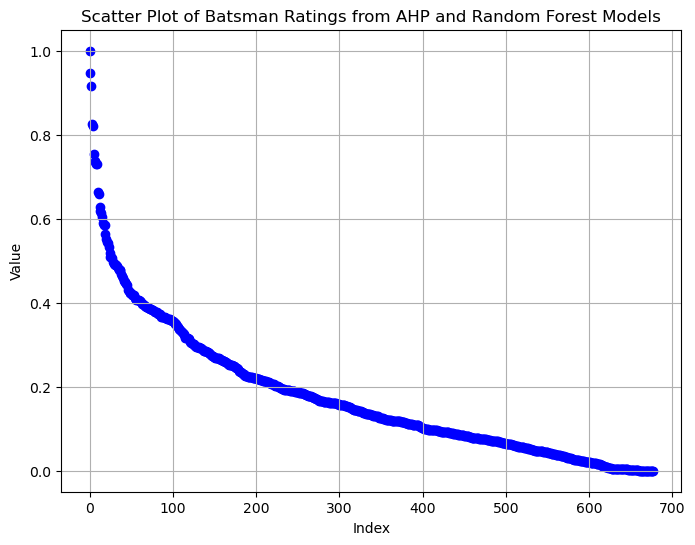

In [1426]:
df = sorted_df

min_score = df['weighted_score'].min()
max_score = df['weighted_score'].max()

df['normalized_score'] = (df['weighted_score'] - min_score) / (max_score - min_score)




# Extract float values
values = df['normalized_score']

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(range(len(values)), values, color='blue', marker='o')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Batsman Ratings from AHP and Random Forest Models')
plt.grid(True)

# Save the plot as an image file
plt.savefig('scatter_plot.png')

# Show the plot (optional, remove if not needed)
plt.show()

In [1427]:
df.head(10)

,runs,boundaries,dismissal,balls_faced,innings,scores,average,strike_rate,highest_score,average_runs,average_balls_faced,average_boundaries,average_strike_rate,rating,Rating Class,weighted_score,normalized_score
F Wright,314,49,1.428571,303,15,"[31, 30, 21, 30, 12, 21, 32, 8, 53, 20, 4, 30,...",44.857143,103.630363,53,13.428571,15.285714,1.714286,79.808571,0.966119,8,125.998256,1.0
N Workman,287,48,2.5,168,12,"[35, 31, 26, 22, 9, 30, 32, 30, 30, 6, 6, 30]",71.75,170.833333,35,15.75,11.75,2.5,161.805,1.0,8,119.192148,0.945831
C McCarthy,286,44,3.333333,164,13,"[34, 34, 16, 24, 6, 30, 16, 32, 0, 31, 30, 1, 32]",95.333333,174.390244,34,9.333333,12.666667,1.333333,81.48,0.912824,8,115.517169,0.916582
C Bennett,251,43,5.0,170,9,"[31, 1, 31, 32, 31, 28, 33, 30, 34]",125.5,147.647059,34,0.5,10.5,0.0,5.555,0.54952,5,104.212213,0.826608
J Harker,187,30,10.0,120,7,"[30, 30, 30, 22, 30, 13, 32]",187.0,155.833333,32,13.0,7.0,3.0,185.71,0.673077,6,103.391953,0.820079
J Errington,227,27,0.833333,307,18,"[4, 20, 3, 12, 0, 24, 30, 0, 16, 24, 4, 8, 9, ...",18.916667,73.941368,30,7.583333,11.666667,0.75,62.2775,0.636557,6,95.138432,0.754391
J Mellons,225,22,1.428571,259,13,"[22, 30, 33, 30, 5, 6, 12, 21, 30, 15, 12, 3, 6]",32.142857,86.872587,33,12.285714,18.857143,0.857143,58.515714,0.685334,6,93.038072,0.737674
R Curtis,174,22,10.0,112,7,"[28, 30, 0, 20, 31, 31, 34]",174.0,155.357143,34,14.0,14.0,1.0,100.0,0.560911,5,92.691956,0.734919
J Winlow,217,32,1.25,285,13,"[10, 30, 7, 23, 30, 2, 19, 30, 9, 0, 30, 2, 25]",27.125,76.140351,30,11.875,21.125,1.25,40.865,0.54794,5,92.133448,0.730474
J Soppitt,217,30,1.428571,250,11,"[29, 15, 19, 5, 33, 6, 30, 8, 31, 10, 31]",31.0,86.8,33,13.142857,21.0,1.714286,65.295714,0.614757,5,92.024328,0.729606


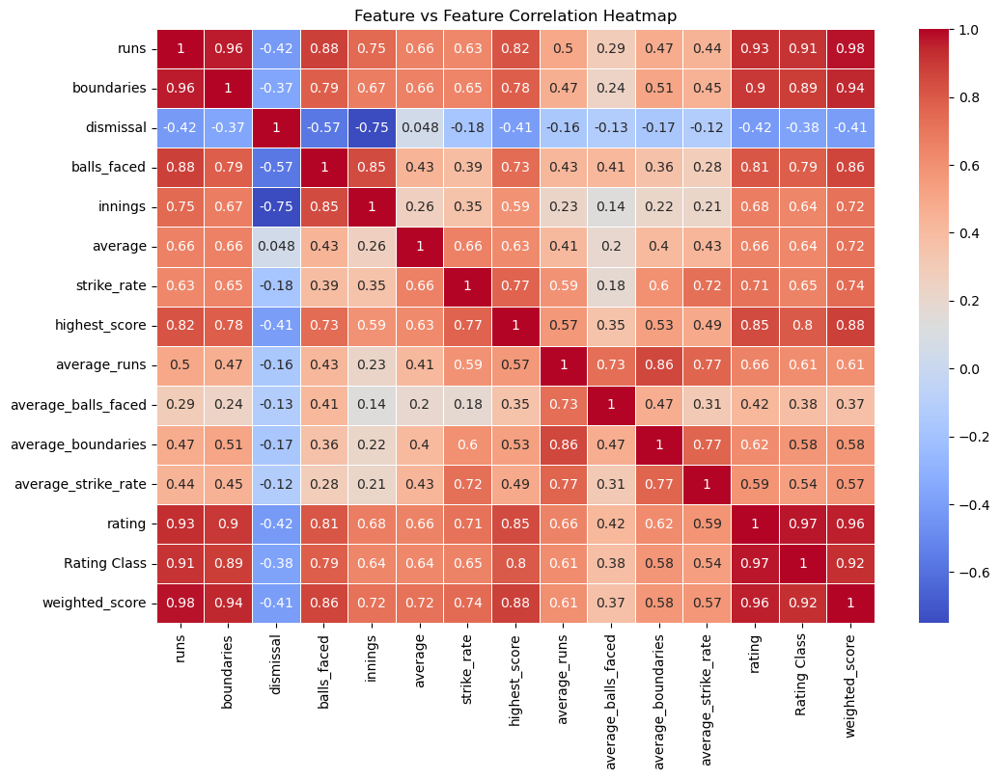

In [1428]:
dfB.set_index('scores', inplace=True)

# Compute the correlation matrix
correlation_matrix = dfB.corr()

# Plotting the heatmap for feature vs feature correlations
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=.5)
plt.title("Feature vs Feature Correlation Heatmap")
plt.show()

In [1434]:
pdf0[pdf0["bowler"]=="M Watson"]

,Over,Ball,Event,Commentary,innings,teamname,teamscore,teamtossinfo,full_match_result,R,B,4s,6s,SR,batting team,bowling team,bowler,batsman,batter_rating
148,Over 11,10.6,Wicket!,M Watson to V McCormick: V McCormick dismissed,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,0.0,3.0,0.0,0.0,0.00,Bishop Auckland CC,Ushaw Moor CC,M Watson,V McCormick,1
149,Over 11,10.5,0 runs,M Watson to V McCormick: No run,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Bishop Auckland CC,Ushaw Moor CC,M Watson,V McCormick,1
150,Over 11,10.4,1 run,M Watson to A Daughtery: 1 run,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Bishop Auckland CC,Ushaw Moor CC,M Watson,A Daughtery,1
151,Over 11,10.3,0 runs,M Watson to A Daughtery: No run,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Bishop Auckland CC,Ushaw Moor CC,M Watson,A Daughtery,1
152,Over 11,10.2,1 leg bye,M Watson to V McCormick: 1 lb,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Bishop Auckland CC,Ushaw Moor CC,M Watson,V McCormick,1
153,Over 11,10.1,Wicket!,M Watson to S Perrin: S Perrin dismissed,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,9.0,25.0,1.0,0.0,36.00,Bishop Auckland CC,Ushaw Moor CC,M Watson,S Perrin,2
200,Over 3,2.6,Wicket!,M Watson to A Blenkiron: A Blenkiron dismissed,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,10.0,11.0,1.0,1.0,90.91,Bishop Auckland CC,Ushaw Moor CC,M Watson,A Blenkiron,2
201,Over 3,2.5,0 runs,M Watson to A Blenkiron: No run,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Bishop Auckland CC,Ushaw Moor CC,M Watson,A Blenkiron,2
202,Over 3,2.4,4 runs,M Watson to A Blenkiron: 4 runs,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Bishop Auckland CC,Ushaw Moor CC,M Watson,A Blenkiron,2
203,Over 3,2.3,6 runs,M Watson to A Blenkiron: 6 runs,2,Bishop Auckland CC,U n d e r 1 3 5 3 / A l l o u t ...,Won the toss and elected to field,USHAW MOOR CC WON BY 21 RUNS RUNS,NaN,NaN,NaN,NaN,NaN,Bishop Auckland CC,Ushaw Moor CC,M Watson,A Blenkiron,2


In [1435]:
bow3=pdf0[pdf0['batter_rating']==3]
bow2=pdf0[pdf0['batter_rating']==2]
bow1=pdf0[pdf0['batter_rating']==1]
bow0 = pdf0[pdf0['batter_rating'].isna()]
import pandas as pd
from decimal import Decimal

# Function to process events and calculate metrics for bowlers
def calculate_bowler_metrics(df):
    # Initialize dictionary to hold metrics
    bowler_metrics = {}

    # Define scoring rules
    runs_scored = {
        '0 runs': 0, '1 run': 1, '2 runs': 2, '3 runs': 3, '4 runs': 4, '6 runs': 6,
        '1 run \n 1 no ball': 1, '2 runs \n 1 no ball': 2, '3 runs \n 1 no ball': 3, 
        '4 runs \n 1 no ball': 4, '6 runs \n 1 no ball': 6, '5 runs': 5,
        '1 run \n 2 no balls': 1, '4 runs \n 2 no balls': 4,
    }
    
    dismissals = [
        'Wicket!', 'Wicket! \n 2 wides', 'Wicket! \n 1 run \n 1 no ball', 
        'Wicket! \n 1 run', 'Wicket! \n 2 runs', 'Wicket! \n 1 bye', 
        'Wicket! \n 1 no ball', 'Wicket! \n 1 wide', 'Wicket! \n 1 leg bye'
    ]

    extras = {
        '1 wide': 1, '2 wides': 2, '3 wides': 3, '4 wides': 4, '5 wides': 5, '6 wides': 6,
        '1 no ball': 1, '2 no balls': 2, '1 bye': 1, '2 byes': 2, '3 byes': 3, 
        '4 byes': 4, '5 byes': 5, '1 leg bye': 1, '2 leg byes': 2, '3 leg byes': 3, 
        '4 leg byes': 4, '2 1nb + byes': 2, '3 1nb + byes': 3, '6 1nb + byes': 6, 
        '5 1nb + byes': 5, '4 1nb + byes': 4, '2 1nb + leg byes': 2
    }

    for _, row in df.iterrows():
        event = row['Event']
        bowler = row['bowler']
        bowling_team = row['bowling team']
        over = int(row['Over'][5:])

        # Initialize bowler if not already in the dictionary
        if bowler not in bowler_metrics:
            bowler_metrics[bowler] = {'runs_conceded': 0, 'wickets': 0, 'extras': 0, 'balls_bowled': 0, 'innings': 0}

        # Calculate metrics for bowlers
        if event in runs_scored:
            bowler_metrics[bowler]['runs_conceded'] += runs_scored[event]
            bowler_metrics[bowler]['balls_bowled'] += 1

        if event in dismissals:
            bowler_metrics[bowler]['wickets'] += 1

        if event in extras:
            bowler_metrics[bowler]['extras'] += extras[event]
            bowler_metrics[bowler]['runs_conceded'] += extras[event]

    # Calculate additional metrics for bowlers
    for bowler in bowler_metrics:
        runs_conceded = bowler_metrics[bowler]['runs_conceded']
        wickets = bowler_metrics[bowler]['wickets']
        balls_bowled = bowler_metrics[bowler]['balls_bowled']

        bowler_metrics[bowler]['average'] = runs_conceded / wickets if wickets > 0 else runs_conceded
        bowler_metrics[bowler]['strike_rate'] = balls_bowled / wickets if wickets > 0 else balls_bowled
        bowler_metrics[bowler]['economy_rate'] = (runs_conceded / (balls_bowled / 6)) if balls_bowled > 0 else 0
        reciprocal_runs_conceded = 1 / runs_conceded if runs_conceded > 0 else 1
        bowler_metrics[bowler]['runs_conceded'] = reciprocal_runs_conceded*100
    return bowler_metrics

# Calculate metrics for each rating category
rat3_bowler_metrics = calculate_bowler_metrics(bow3)
rat2_bowler_metrics = calculate_bowler_metrics(bow2)
rat1_bowler_metrics = calculate_bowler_metrics(bow1)
rat0_bowler_metrics = calculate_bowler_metrics(bow0)
cam=calculate_bowler_metrics(pdf0)
# Print results
print("Rating 3 Bowler Metrics:", rat3_bowler_metrics)
print("Rating 2 Bowler Metrics:", rat2_bowler_metrics)
print("Rating 1 Bowler Metrics:", rat1_bowler_metrics)
print("Rating 0 Bowler Metrics:", rat0_bowler_metrics)


Rating 3 Bowler Metrics: {'A Routledge': {'runs_conceded': 16.666666666666664, 'wickets': 0, 'extras': 0, 'balls_bowled': 7, 'innings': 0, 'average': 6, 'strike_rate': 7, 'economy_rate': 5.142857142857142}, 'M Reynolds': {'runs_conceded': 16.666666666666664, 'wickets': 0, 'extras': 2, 'balls_bowled': 2, 'innings': 0, 'average': 6, 'strike_rate': 2, 'economy_rate': 18.0}, 'A Murray': {'runs_conceded': 5.0, 'wickets': 0, 'extras': 2, 'balls_bowled': 20, 'innings': 0, 'average': 20, 'strike_rate': 20, 'economy_rate': 6.0}, 'E Gaines': {'runs_conceded': 100.0, 'wickets': 0, 'extras': 0, 'balls_bowled': 4, 'innings': 0, 'average': 1, 'strike_rate': 4, 'economy_rate': 1.5}, 'V McCormick': {'runs_conceded': 33.33333333333333, 'wickets': 0, 'extras': 0, 'balls_bowled': 4, 'innings': 0, 'average': 3, 'strike_rate': 4, 'economy_rate': 4.5}, 'M Mullarky': {'runs_conceded': 11.11111111111111, 'wickets': 2, 'extras': 3, 'balls_bowled': 21, 'innings': 0, 'average': 4.5, 'strike_rate': 10.5, 'economy

In [1436]:
playersb=[]
for i in cam.keys():
    playersb.append(i)
key_fina={}

In [1437]:
for i in playersb:
    key_fina[i]={}
    if i in rat0_bowler_metrics:
        key_fina[i][0]=rat0_bowler_metrics[i]
    if i in rat1_bowler_metrics:
        key_fina[i][1]=rat1_bowler_metrics[i]
    if i in rat2_bowler_metrics:
        key_fina[i][2]=rat2_bowler_metrics[i]
    if i in rat3_bowler_metrics:
        key_fina[i][3]=rat3_bowler_metrics[i]

In [1438]:
key_fina

{'A Routledge': {1: {'runs_conceded': 7.6923076923076925,
   'wickets': 0,
   'extras': 4,
   'balls_bowled': 22,
   'innings': 0,
   'average': 13,
   'strike_rate': 22,
   'economy_rate': 3.5454545454545454},
  3: {'runs_conceded': 16.666666666666664,
   'wickets': 0,
   'extras': 0,
   'balls_bowled': 7,
   'innings': 0,
   'average': 6,
   'strike_rate': 7,
   'economy_rate': 5.142857142857142}},
 'J Lord': {1: {'runs_conceded': 4.166666666666666,
   'wickets': 0,
   'extras': 6,
   'balls_bowled': 21,
   'innings': 0,
   'average': 24,
   'strike_rate': 21,
   'economy_rate': 6.857142857142857}},
 'V McCormick': {1: {'runs_conceded': 7.142857142857142,
   'wickets': 0,
   'extras': 2,
   'balls_bowled': 18,
   'innings': 0,
   'average': 14,
   'strike_rate': 18,
   'economy_rate': 4.666666666666667},
  2: {'runs_conceded': 14.285714285714285,
   'wickets': 0,
   'extras': 0,
   'balls_bowled': 8,
   'innings': 0,
   'average': 7,
   'strike_rate': 8,
   'economy_rate': 5.25},
  3

In [1439]:
cleaned_key_final = {key: value for key, value in key_fina.items() if not (isinstance(key, float) and math.isnan(key))}


In [1440]:
key_fina=cleaned_key_final

In [1441]:
import pprint

# Sample data
data = key_fina

# Extract metrics
metrics = ['runs_conceded', 'wickets', 'extras', 'balls_bowled', 'innings', 'average', 'strike_rate', 'economy_rate']

# Flatten all metric values to find min and max
all_values = {metric: [] for metric in metrics}

for player, ratings in data.items():
    for rating, values in ratings.items():
        for metric in metrics:
            if metric in values:
                all_values[metric].append(values[metric])

# Calculate min and max for each metric
min_max_values = {metric: (min(all_values[metric]), max(all_values[metric])) for metric in metrics}

# Normalize function
def normalize(value, metric, min_max_values):
    min_val, max_val = min_max_values[metric]
    if max_val == min_val:
        return 0  # Avoid division by zero if all values are the same
    return (value - min_val) / (max_val - min_val)

# Normalize the data
standardized_data = {}
for player, ratings in data.items():
    standardized_data[player] = {}
    for rating, values in ratings.items():
        standardized_data[player][rating] = {
            metric: normalize(values[metric], metric, min_max_values) for metric in metrics if metric in values
        }

# Print the normalized data
pprint.pprint(standardized_data)


{'- Jacob': {1: {'average': 0.0,
                 'balls_bowled': 0.008620689655172414,
                 'economy_rate': 0.0,
                 'extras': 0.0,
                 'innings': 0,
                 'runs_conceded': 1.0,
                 'strike_rate': 0.010101010101010102,
                 'wickets': 0.08333333333333333},
             2: {'average': 0.0,
                 'balls_bowled': 0.04310344827586207,
                 'economy_rate': 0.0,
                 'extras': 0.0,
                 'innings': 0,
                 'runs_conceded': 1.0,
                 'strike_rate': 0.050505050505050504,
                 'wickets': 0.08333333333333333},
             3: {'average': 0.016666666666666666,
                 'balls_bowled': 0.034482758620689655,
                 'economy_rate': 0.07142857142857142,
                 'extras': 0.02564102564102564,
                 'innings': 0,
                 'runs_conceded': 0.49618320610687017,
                 'strike_rate': 0.0404040404

In [1442]:
key_fina=standardized_data

In [1443]:
default_stats = {
    'runs_conceded': 0.0,
    'wickets': 0.0,
    'extras': 0.0,
    'balls_bowled': 0.0,
    'innings': 0,
    'average': 0.0,
    'strike_rate': 0.0,
    'economy_rate': 0.0
}

# Extract statistics with default values
stats = []
for player, details in key_fina.items():
    for key in [0, 1, 2, 3]:
        stats_dict = details.get(key, default_stats.copy())
        stats_dict['player'] = player
        stats_dict['key'] = key
        stats.append(stats_dict)

# Sorting by the highest value among the numeric statistics
sorted_stats = sorted(stats, key=lambda x: max(v for v in x.values() if isinstance(v, (int, float))), reverse=True)

# Preparing the ordered dictionary
ordered_data = {}
for stat in sorted_stats:
    player = stat.pop('player')
    key = stat.pop('key')
    if player not in ordered_data:
        ordered_data[player] = {}
    ordered_data[player][key] = stat

ordered_data

{'A Routledge': {3: {'runs_conceded': 0.16030534351145034,
   'wickets': 0.0,
   'extras': 0.0,
   'balls_bowled': 0.0603448275862069,
   'innings': 0,
   'average': 0.05,
   'strike_rate': 0.0707070707070707,
   'economy_rate': 0.12244897959183672},
  2: {'runs_conceded': 0.0,
   'wickets': 0.0,
   'extras': 0.0,
   'balls_bowled': 0.0,
   'innings': 0,
   'average': 0.0,
   'strike_rate': 0.0,
   'economy_rate': 0.0},
  1: {'runs_conceded': 0.06987668819729888,
   'wickets': 0.0,
   'extras': 0.10256410256410256,
   'balls_bowled': 0.1896551724137931,
   'innings': 0,
   'average': 0.10833333333333334,
   'strike_rate': 0.2222222222222222,
   'economy_rate': 0.08441558441558442},
  0: {'runs_conceded': 0.0,
   'wickets': 0.0,
   'extras': 0.0,
   'balls_bowled': 0.0,
   'innings': 0,
   'average': 0.0,
   'strike_rate': 0.0,
   'economy_rate': 0.0}},
 'J Lord': {3: {'runs_conceded': 0.0,
   'wickets': 0.0,
   'extras': 0.0,
   'balls_bowled': 0.0,
   'innings': 0,
   'average': 0.0,


In [1444]:
key_fina=ordered_data

In [1445]:
import numpy as np
import decimal

def ahp(matrix_dict):
    def calculate_priority_vector_and_consistency(matrix):
        n = matrix.shape[0]
        
        # Normalize the matrix
        column_sums = np.sum(matrix, axis=0)
        normalized_matrix = matrix / column_sums
        
        # Calculate the Priority Vector
        priority_vector = np.mean(normalized_matrix, axis=1)
        
        # Compute the Weighted Sum Vector using the original matrix
        weighted_sum_vector = np.dot(matrix, priority_vector)
        
        # Compute Lambda Max
        lambda_max = np.mean(weighted_sum_vector / priority_vector)
        
        # Calculate Consistency Index (CI)
        CI = (lambda_max - n) / (n - 1)
        
        # Random Index (RI) for consistency ratio calculation
        RI_dict = {1: 0, 2: 0, 3: 0.58, 4: 0.90, 5: 1.12, 6: 1.24, 7: 1.32, 8: 1.41, 9: 1.45, 10: 1.49}
        RI = RI_dict.get(n, 1.49)
        
        # Calculate Consistency Ratio (CR)
        CR = CI / RI if RI != 0 else 0
        
        return priority_vector, CI, CR

    results = {}
    for key, matrix in matrix_dict.items():
        priority_vector, CI, CR = calculate_priority_vector_and_consistency(matrix)
        if CR > 0.1:
            raise ValueError(f"The consistency ratio for {key} is too high: {CR:.2f}")
        results[key] = {'priority_vector': priority_vector, 'CI': CI, 'CR': CR}
    
    return results

def calculate_weighted_score(weights, metrics):
    # Convert metrics values to float if they are decimal.Decimal
    metrics = {k: float(v) if isinstance(v, decimal.Decimal) else v for k, v in metrics.items()}
    
    return sum(weights.get(key, 0) * metrics.get(key, 0) for key in weights)

def calculate_batsman_rating(bowler_rating, scoring_metrics, efficiency_metrics, results):
    # Calculate weighted scores for each level
    scoring_ability_score = calculate_weighted_score(
        dict(zip(['wickets','average', 'innings'], results['Scoring Ability']['priority_vector'])),
        scoring_metrics
    )
    
    efficiency_score = calculate_weighted_score(
        dict(zip(['economy_rate','balls_bowled','runs_conceded','strike_rate',  'extras' ], results['Efficiency']['priority_vector'])),
        efficiency_metrics
    )
    
    # Calculate Level 2 weighted score
    level_2_weights = dict(zip(['scoring_ability', 'efficiency'], results['Level 2']['priority_vector']))
    level_2_score = (
        level_2_weights['scoring_ability'] * scoring_ability_score +
        level_2_weights['efficiency'] * efficiency_score
    )
    
    # Multiply level 2 score by bowler rating priority vector
    bowler_rating_weight = results['Bowler Rating']['priority_vector'][bowler_rating - 1]  # Adjust index for 0-based array
    overall_rating = bowler_rating_weight * level_2_score
    
    return overall_rating

# Define matrices
bowler_rating_matrix = np.array([
    [1, 1.5, 1.75, 2],
    [0.667, 1, 1.5, 1.75],
    [0.571, 0.667, 1, 1.5],
    [0.5, 0.571, 0.667, 1]
])

level_2_matrix = np.array([
    [1, 1.25],
    [0.8, 1]
])

efficiency_matrix = np.array([
    [1, 3, 5, 7, 9],
    [0.33, 1, 3, 5, 7],
    [0.2, 0.33, 1, 3, 5],
    [0.14, 0.2, 0.33, 1, 3],
    [0.11, 0.14, 0.2, 0.33, 1]
])

scoring_ability_matrix = np.array([
    [1, 3, 5],
    [0.33, 1, 3],
    [0.2, 0.33, 1]
])

# Creating dictionary of matrices
matrix_dict = {
    'Bowler Rating': bowler_rating_matrix,
    'Level 2': level_2_matrix,
    'Scoring Ability': scoring_ability_matrix,
    'Efficiency': efficiency_matrix
}

# Calculate AHP results
results = ahp(matrix_dict)

# Example metrics data for batsmen (replace with actual data)
key_final = key_fina

# Calculate and print the batsman ratings
final_ratings = {}
for batsman, metrics_by_bowler in key_final.items():
    final_rating = 0
    print(f"\nbowler: {batsman}")
    
    for bowler_rating, metrics in metrics_by_bowler.items():
        scoring_metrics = {
            'average': metrics.get('average', 0),
            'wickets': metrics.get('wickets', 0),
            'innings': metrics.get('innings', 0)
        }
        efficiency_metrics = {
            'strike_rate': metrics.get('strike_rate', 0),
            'balls_bowled': metrics.get('balls_bowled', 0),
            'economy_rate': metrics.get('economy_rate', 0),
            'extras': metrics.get('extras', 0),
            'runs_conceded': metrics.get('runs_conceded', 0)
        }
        
        overall_rating = calculate_batsman_rating(bowler_rating, scoring_metrics, efficiency_metrics, results)
        final_rating += overall_rating
        print(f"  batsman Rating {bowler_rating}: Overall bowler Rating = {overall_rating:.2f}")
    
    final_ratings[batsman] = final_rating
    print(f"  Final Rating: {final_rating:.2f}")

print("\nFinal Batsman Ratings:")
for batsman, rating in final_ratings.items():
    print(f"{batsman}: {rating:.2f}")



bowler: A Routledge
  batsman Rating 3: Overall bowler Rating = 0.01
  batsman Rating 2: Overall bowler Rating = 0.00
  batsman Rating 1: Overall bowler Rating = 0.02
  batsman Rating 0: Overall bowler Rating = 0.00
  Final Rating: 0.04

bowler: J Lord
  batsman Rating 3: Overall bowler Rating = 0.00
  batsman Rating 2: Overall bowler Rating = 0.00
  batsman Rating 1: Overall bowler Rating = 0.04
  batsman Rating 0: Overall bowler Rating = 0.00
  Final Rating: 0.04

bowler: V McCormick
  batsman Rating 3: Overall bowler Rating = 0.01
  batsman Rating 2: Overall bowler Rating = 0.02
  batsman Rating 1: Overall bowler Rating = 0.03
  batsman Rating 0: Overall bowler Rating = 0.00
  Final Rating: 0.05

bowler: M Reynolds
  batsman Rating 3: Overall bowler Rating = 0.02
  batsman Rating 2: Overall bowler Rating = 0.00
  batsman Rating 1: Overall bowler Rating = 0.03
  batsman Rating 0: Overall bowler Rating = 0.00
  Final Rating: 0.05

bowler: E Gaines
  batsman Rating 3: Overall bowler R

In [1446]:
nr_bow=final_ratings

In [1447]:
nr_bow

{'A Routledge': 0.03589909429757259,
 'J Lord': 0.03502477485297846,
 'V McCormick': 0.05107504900163338,
 'M Reynolds': 0.0502496716541771,
 'E Gaines': 0.06400462700376629,
 'A Murray': 0.0846360110620647,
 'M Mullarky': 0.08919580529478766,
 'A Daughtery': 0.02783933812683601,
 'A Blenkiron': 0.0772630544661409,
 'J Bett': 0.07241201249529905,
 'S Robertson': 0.06738864433570418,
 'M Watson': 0.08893114947239816,
 'R Harvey': 0.07008695453393116,
 'E Moralee': 0.04798749428416539,
 'M Kavanagh': 0.09598092380848958,
 'S Bowater': 0.019328106573153737,
 'V McCormack': 0.018741293170786696,
 "H O'Keefe": 0.06400336193554322,
 'T Jacobs': 0.09670815461798613,
 'A Doherty': 0.03046236530319281,
 'H Davison': 0.05173421045765248,
 'A Tiplady': 0.08030481042060077,
 'J Bird': 0.06684158278559023,
 'O Clark': 0.06753228976321646,
 'L Morris': 0.12109877785784443,
 'L Heslop': 0.09919222645967851,
 'W Nichols': 0.07402430917563962,
 'T Singlewood': 0.08838121835881252,
 'S Irvine': 0.016376

In [1448]:
sorted_ratings = sorted(final_ratings.items(), key=lambda x: x[1], reverse=True)


In [1449]:
sorted_ratings

[('J Errington', 0.27199279999042153),
 ('T McKie', 0.2486935060547512),
 ('H Keegan', 0.2063648815962228),
 ('A Hawkins', 0.2057961564192741),
 ('C Atkinson', 0.19531218117779686),
 ('T Baker', 0.1873388121326351),
 ('C Tudball', 0.1842883823067077),
 ('F Wright', 0.18356687015782938),
 ('G Kilner', 0.1826243869704486),
 ('J Nielson', 0.17973384471329648),
 ('N Workman', 0.17937005849963297),
 ('E Lynch', 0.1791052185640417),
 ('S Lowther', 0.17812879101748869),
 ('H Petch', 0.17250634507181),
 ('O Pattison', 0.17194759637918738),
 ('E Morris', 0.16842972482476257),
 ('T Smith', 0.16779264680586153),
 ('S Ramsey', 0.1669009401428964),
 ('J Mellons', 0.16530519946167543),
 ('C McCarthy', 0.16455773758599027),
 ('H Coleman', 0.16135140138835713),
 ('L Wilson', 0.15875905966039383),
 ('L Ellison', 0.15787962843458508),
 ('B Thompson', 0.15757667489717603),
 ('K Elliott', 0.15703450080870682),
 ('Y Saleem', 0.1562629959742002),
 ('A Grey', 0.15507178464192756),
 ('N Shaw', 0.1536061429928

In [1450]:
# Assuming sorted_ratings is a list of tuples in the form (name, value)
nr_bats = sorted_ratings

# Extract values from the list of tuples
values = [value for name, value in nr_bats]

# Compute min and max values
min_value = min(values)
max_value = max(values)

# Normalize values
normalized_data = [(name, (value - min_value) / (max_value - min_value)) for name, value in nr_bats]

# Output the normalized data
for name, normalized_value in normalized_data:
    print(f'{name}: {normalized_value:.4f}')


J Errington: 1.0000
T McKie: 0.9143
H Keegan: 0.7587
A Hawkins: 0.7566
C Atkinson: 0.7181
T Baker: 0.6888
C Tudball: 0.6775
F Wright: 0.6749
G Kilner: 0.6714
J Nielson: 0.6608
N Workman: 0.6595
E Lynch: 0.6585
S Lowther: 0.6549
H Petch: 0.6342
O Pattison: 0.6322
E Morris: 0.6192
T Smith: 0.6169
S Ramsey: 0.6136
J Mellons: 0.6078
C McCarthy: 0.6050
H Coleman: 0.5932
L Wilson: 0.5837
L Ellison: 0.5805
B Thompson: 0.5793
K Elliott: 0.5773
Y Saleem: 0.5745
A Grey: 0.5701
N Shaw: 0.5647
A Princy-Joseph: 0.5608
H Stoker: 0.5508
S Suddick: 0.5490
J Beeston: 0.5455
O Thomas: 0.5411
A Peart: 0.5398
H Banks: 0.5396
S Birbeck: 0.5384
E Irfan: 0.5297
H Collingwood: 0.5280
O Potts: 0.5277
J Calvert: 0.5233
N Sheridan: 0.5229
W Curry: 0.5197
H Higginson: 0.5183
H Hunter: 0.5176
F Gilmore: 0.5164
H Thushyanth: 0.5140
L Sayers: 0.5132
L Marriott: 0.5060
S Hood: 0.5058
B Pratt: 0.4959
I Coy: 0.4945
M Wilkinson: 0.4940
O Anderson: 0.4916
R Scott: 0.4914
D Kijo: 0.4898
L Wilkinson: 0.4889
J Hood: 0.4887


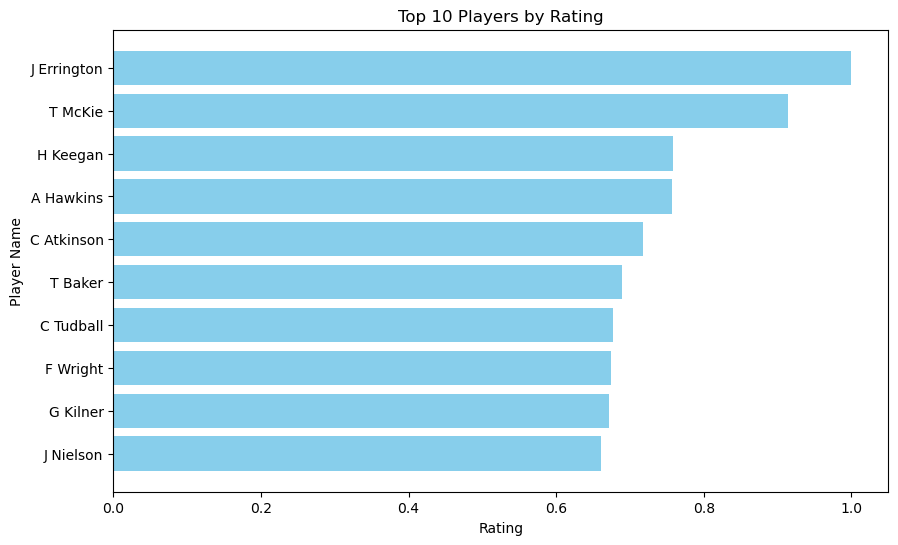

In [1451]:
import matplotlib.pyplot as plt

# Data for top players
data = [
    ('J Errington', 1.0000),
    ('T McKie', 0.9143),
    ('H Keegan', 0.7587),
    ('A Hawkins', 0.7566),
    ('C Atkinson', 0.7181),
    ('T Baker', 0.6888),
    ('C Tudball', 0.6775),
    ('F Wright', 0.6749),
    ('G Kilner', 0.6714),
    ('J Nielson', 0.6608)
]

# Sort data by rating and get top 10
top_10 = sorted(data, key=lambda x: x[1], reverse=True)[:10]

# Separate names and ratings for plotting
names, ratings = zip(*top_10)

# Create the plot
plt.figure(figsize=(10, 6))
plt.barh(names, ratings, color='skyblue')
plt.xlabel('Rating')
plt.ylabel('Player Name')
plt.title('Top 10 Players by Rating')
plt.gca().invert_yaxis()  # Highest ratings at the top

# Save the plot as a PNG file
plt.savefig('top_10_players_by_rating.png', bbox_inches='tight')

# Display the plot
plt.show()


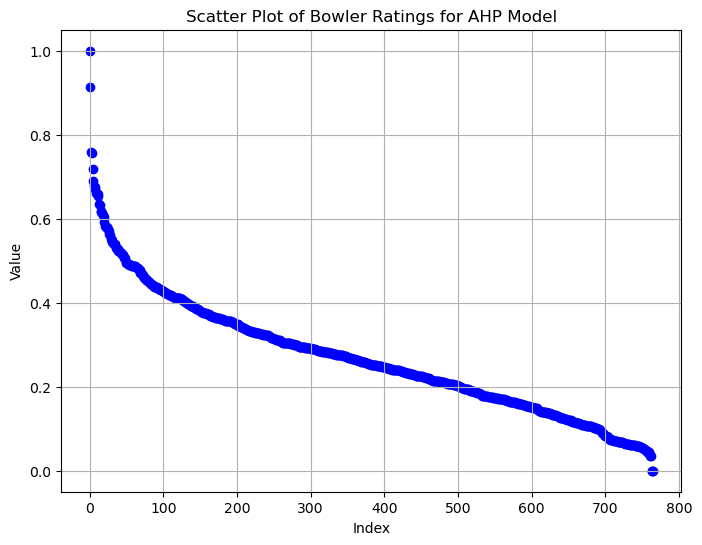

In [1452]:
# Extract float values
values = [x[1] for x in normalized_data]

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(range(len(values)), values, color='blue', marker='o')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Bowler Ratings for AHP Model')
plt.grid(True)

# Save the plot as an image file
plt.savefig('scatter_plot.png')

# Show the plot (optional, remove if not needed)
plt.show()

In [1453]:
rating_dict = dict(normalized_data)
player_stats=bowler_metrics
def update_player_ratings(stats_dict, ratings_dict):
    for player, stats in stats_dict.items():
        if player in ratings_dict:
            stats['rating'] = ratings_dict[player]
        else:
            stats['rating'] = None  # Handle missing ratings

# Update player stats with ratings
update_player_ratings(player_stats, rating_dict)

# Print updated player stats
for player, stats in player_stats.items():
    print(f"Player: {player}")
    print(f"Stats: {stats}\n")


Player: K Massam
Stats: {'runs_conceded': 2.0408163265306123, 'wickets': 5, 'extras': 2, 'balls_bowled': 73, 'innings': 5, 'average': 9.8, 'strike_rate': 14.6, 'economy_rate': 4.027397260273973, 'rating': 0.4166099792779297}

Player: L Thompson
Stats: {'runs_conceded': 2.083333333333333, 'wickets': 7, 'extras': 11, 'balls_bowled': 81, 'innings': 5, 'average': 6.857142857142857, 'strike_rate': 11.571428571428571, 'economy_rate': 3.5555555555555554, 'rating': 0.45429371007662805}

Player: A Rowell
Stats: {'runs_conceded': 5.0, 'wickets': 3, 'extras': 2, 'balls_bowled': 51, 'innings': 3, 'average': 6.666666666666667, 'strike_rate': 17.0, 'economy_rate': 2.3529411764705883, 'rating': 0.356444149228867}

Player: T Williamson
Stats: {'runs_conceded': 2.7777777777777777, 'wickets': 4, 'extras': 14, 'balls_bowled': 57, 'innings': 2, 'average': 9.0, 'strike_rate': 14.25, 'economy_rate': 3.789473684210526, 'rating': 0.3127344118948836}

Player: H Philpson
Stats: {'runs_conceded': 20.0, 'wickets'

In [1454]:
player_stats

{'K Massam': {'runs_conceded': 2.0408163265306123,
  'wickets': 5,
  'extras': 2,
  'balls_bowled': 73,
  'innings': 5,
  'average': 9.8,
  'strike_rate': 14.6,
  'economy_rate': 4.027397260273973,
  'rating': 0.4166099792779297},
 'L Thompson': {'runs_conceded': 2.083333333333333,
  'wickets': 7,
  'extras': 11,
  'balls_bowled': 81,
  'innings': 5,
  'average': 6.857142857142857,
  'strike_rate': 11.571428571428571,
  'economy_rate': 3.5555555555555554,
  'rating': 0.45429371007662805},
 'A Rowell': {'runs_conceded': 5.0,
  'wickets': 3,
  'extras': 2,
  'balls_bowled': 51,
  'innings': 3,
  'average': 6.666666666666667,
  'strike_rate': 17.0,
  'economy_rate': 2.3529411764705883,
  'rating': 0.356444149228867},
 'T Williamson': {'runs_conceded': 2.7777777777777777,
  'wickets': 4,
  'extras': 14,
  'balls_bowled': 57,
  'innings': 2,
  'average': 9.0,
  'strike_rate': 14.25,
  'economy_rate': 3.789473684210526,
  'rating': 0.3127344118948836},
 'H Philpson': {'runs_conceded': 20.0,


In [1455]:
df = pd.DataFrame(player_stats).T

# Display the DataFrame


In [1456]:
df

,runs_conceded,wickets,extras,balls_bowled,innings,average,strike_rate,economy_rate,rating
K Massam,2.040816,5.0,2.0,73.0,5.0,9.800000,14.600000,4.027397,0.416610
L Thompson,2.083333,7.0,11.0,81.0,5.0,6.857143,11.571429,3.555556,0.454294
A Rowell,5.000000,3.0,2.0,51.0,3.0,6.666667,17.000000,2.352941,0.356444
T Williamson,2.777778,4.0,14.0,57.0,2.0,9.000000,14.250000,3.789474,0.312734
H Philpson,20.000000,1.0,5.0,9.0,0.0,5.000000,9.000000,3.333333,0.171903
...,...,...,...,...,...,...,...,...,...
S Bowater,12.500000,0.0,0.0,12.0,0.0,8.000000,12.000000,4.000000,0.071061
A Routledge,5.263158,0.0,4.0,29.0,0.0,19.000000,29.000000,3.931034,0.131985
M Reynolds,4.761905,0.0,4.0,23.0,0.0,21.000000,23.000000,5.478261,0.184746
A Daughtery,20.000000,0.0,1.0,12.0,0.0,5.000000,12.000000,2.500000,0.102353


In [1457]:
df['Rating Class'] = pd.cut(df['rating'], bins=np.linspace(0, 1, 11), labels=range(1, 11))

In [1458]:
df=df.dropna()

In [1459]:
df

,runs_conceded,wickets,extras,balls_bowled,innings,average,strike_rate,economy_rate,rating,Rating Class
K Massam,2.040816,5.0,2.0,73.0,5.0,9.800000,14.600000,4.027397,0.416610,5
L Thompson,2.083333,7.0,11.0,81.0,5.0,6.857143,11.571429,3.555556,0.454294,5
A Rowell,5.000000,3.0,2.0,51.0,3.0,6.666667,17.000000,2.352941,0.356444,4
T Williamson,2.777778,4.0,14.0,57.0,2.0,9.000000,14.250000,3.789474,0.312734,4
H Philpson,20.000000,1.0,5.0,9.0,0.0,5.000000,9.000000,3.333333,0.171903,2
...,...,...,...,...,...,...,...,...,...,...
S Bowater,12.500000,0.0,0.0,12.0,0.0,8.000000,12.000000,4.000000,0.071061,1
A Routledge,5.263158,0.0,4.0,29.0,0.0,19.000000,29.000000,3.931034,0.131985,2
M Reynolds,4.761905,0.0,4.0,23.0,0.0,21.000000,23.000000,5.478261,0.184746,2
A Daughtery,20.000000,0.0,1.0,12.0,0.0,5.000000,12.000000,2.500000,0.102353,2


In [1460]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Assuming `df` is your DataFrame with the new data
y = df["Rating Class"]
x = df[['runs_conceded', 'wickets', 'extras', 'balls_bowled', 
        'innings', 'average', 'strike_rate', 'economy_rate', 'rating']]

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Initialize and train the RandomForestClassifier
model = RandomForestClassifier(n_estimators=500, random_state=42)
model.fit(x_train, y_train)

# Make predictions on the test set
y_pred = model.predict(x_test)

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F-measure (F1 Score): {f1:.4f}")

# Get feature importance
importances = model.feature_importances_

# List of features
features = ['runs_conceded', 'wickets', 'extras', 'balls_bowled', 
            'innings', 'average', 'strike_rate', 'economy_rate', 'rating']

# Create a dictionary of features and their importances
coefficients = dict(zip(features, importances))

# Compute the weighted score
df['weighted_score'] = (
    df['runs_conceded'] * coefficients['runs_conceded'] +
    df['wickets'] * coefficients['wickets'] +
    df['extras'] * coefficients['extras'] +
    df['balls_bowled'] * coefficients['balls_bowled'] +
    df['innings'] * coefficients['innings'] +
    df['average'] * coefficients['average'] +
    df['strike_rate'] * coefficients['strike_rate'] +
    df['economy_rate'] * coefficients['economy_rate'] +
    df['rating'] * coefficients['rating']
)

# Sort the DataFrame by 'weighted_score' from max to min
sorted_df = df.sort_values(by='weighted_score', ascending=False)

# Print the sorted DataFrame
print(sorted_df)


Accuracy: 0.9673
Precision: 0.9746
Recall: 0.9673
F-measure (F1 Score): 0.9697
             runs_conceded  wickets  extras  balls_bowled  innings    average  \
J Errington       1.149425     24.0    16.0         216.0     14.0   3.625000   
R Scott           0.746269      8.0    22.0         205.0     11.0  16.750000   
F Wright          0.735294     16.0    54.0         180.0     11.0   8.500000   
B Thompson        0.578035      2.0    33.0         153.0      8.0  86.500000   
S Lowther         0.819672     12.0    28.0         172.0     12.0  10.166667   
...                    ...      ...     ...           ...      ...        ...   
M Caris          11.111111      0.0     1.0           4.0      0.0   9.000000   
C Dye            10.000000      0.0     0.0           6.0      1.0  10.000000   
W Hunter          8.333333      0.0     1.0           6.0      0.0  12.000000   
J Fletcher       10.000000      0.0     1.0           5.0      0.0  10.000000   
M Suddick         9.090909    

C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\dheer\.cache\New folder\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\dheer\AppData\Local\Temp\ipykernel_20088\3395268080.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-c

In [1461]:
importances

array([0.06956473, 0.1004011 , 0.03093807, 0.08077588, 0.02227899,
       0.02639072, 0.02940923, 0.02311633, 0.61712493])

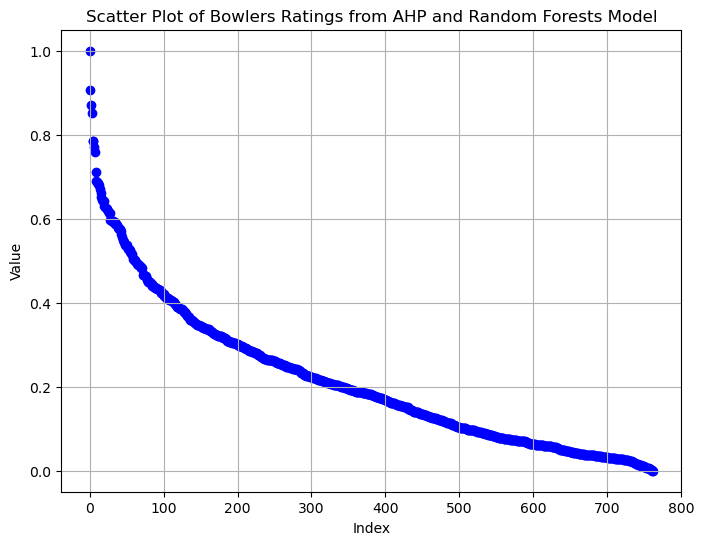

In [1462]:
df = sorted_df

min_score = df['weighted_score'].min()
max_score = df['weighted_score'].max()

df['normalized_score'] = (df['weighted_score'] - min_score) / (max_score - min_score)




# Extract float values
values = df['normalized_score']

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(range(len(values)), values, color='blue', marker='o')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Bowlers Ratings from AHP and Random Forests Model')
plt.grid(True)

# Save the plot as an image file
plt.savefig('scatter_plot.png')

# Show the plot (optional, remove if not needed)
plt.show()

In [1463]:
sorted_df.head(10)

,runs_conceded,wickets,extras,balls_bowled,innings,average,strike_rate,economy_rate,rating,Rating Class,weighted_score,normalized_score
J Errington,1.149425,24.0,16.0,216.0,14.0,3.625000,9.000000,2.416667,1.000000,10,21.777430,1.000000
R Scott,0.746269,8.0,22.0,205.0,11.0,16.750000,25.625000,3.921951,0.491358,5,19.929432,0.907242
F Wright,0.735294,16.0,54.0,180.0,11.0,8.500000,11.250000,4.533333,0.674896,7,19.189416,0.870098
B Thompson,0.578035,2.0,33.0,153.0,8.0,86.500000,76.500000,6.784314,0.579341,6,18.845869,0.852854
S Lowther,0.819672,12.0,28.0,172.0,12.0,10.166667,14.333333,4.255814,0.654903,7,17.481273,0.784359
A Carter,0.781250,3.0,28.0,161.0,6.0,42.666667,53.666667,4.770186,0.488469,5,17.476423,0.784116
S Birbeck,0.689655,9.0,8.0,177.0,12.0,16.111111,19.666667,4.915254,0.538409,6,17.213223,0.770905
H Higginson,0.719424,6.0,18.0,171.0,3.0,23.166667,28.500000,4.877193,0.518324,6,16.971013,0.758747
G Kilner,1.041667,10.0,22.0,159.0,9.0,9.600000,15.900000,3.622642,0.671431,7,16.020045,0.711015
H Keegan,0.917431,14.0,8.0,155.0,12.0,7.785714,11.071429,4.219355,0.758715,8,15.601381,0.690000
